In [2]:
from dataset_evaluation import (sentence_level_quality,
                                entity_level_quality,
                                pipeline_prediction,
                                fidelity)


import dataset_evaluation as dse
%load_ext autoreload
%autoreload 2


import pandas as pd
import seaborn as sns
from datasets import load_dataset
from transformers import (AutoModel,
                          AutoTokenizer)
import pickle
import torch
from torch.nn.functional import cosine_similarity


word_emb = "jjzha/jobbert-base-cased"
word_emb_model = AutoModel.from_pretrained(word_emb)
word_emb_tokenizer = AutoTokenizer.from_pretrained(word_emb)

TypeError: __init__() missing 1 required positional argument: 'taxonomy'

In [2]:
with open("./generation/generated/PROTOTYPE/prototype_split/train.pkl", "rb") as f:
    gen_ex = pickle.load(f)

with open("./generation/generated/PROTOTYPE/ANNOTATED_SUPPORT_SET.pkl", "rb") as f:
    support_set = pickle.load(f)


ESCO_DIR = "../../../esco/"
with open(ESCO_DIR + "embedded_tech_management_tax.pkl", "rb") as f:
    emb_tax = pickle.load(f)

taxonomy = pd.read_csv(ESCO_DIR + "tech_managment_taxonomy_narrow.csv")
taxonomy["name+definition"] = taxonomy["name+defintion"]
taxonomy["Example"] = taxonomy["altLabels"]

In [3]:
import sys

sys.path.append("../skillExtract/")
from utils import select_candidates_from_taxonomy

In [4]:
unique_support = support_set[["sentence", "embeddings"]].drop_duplicates()
all_embeddings = torch.cat(list(unique_support["embeddings"].values)).detach()

import random
from split_words import Splitter

def prepare_support(support):
    splitter = Splitter()
    span = random.choice(support["spans"])
    candidates = select_candidates_from_taxonomy(
        {
            "extracted_skills":[span],
            "sentence": support["sentence"]
         }, 
        taxonomy,
        splitter=splitter,
        tokenizer=word_emb_tokenizer,
        model=word_emb_model,
        max_candidates=10,
        method="mixed",
        emb_tax = emb_tax
    )
    
    skill_nd = taxonomy[taxonomy.name == support["skill"]].iloc[0]["name+definition"]
    all_candidates = [candidate["name+definition"] for candidate in candidates["skill_candidates"][span]]
    if(skill_nd not in all_candidates):
        all_candidates = [skill_nd] + all_candidates[:-1]
    shot = f"Sentence: {support['sentence']}\n"
    shot += f"Skill : {span}\nOptions: \n"
    for l, cand in zip(list("abcdefghijklmnopqrstuvwxyz"), all_candidates):
        shot += l.upper() + ": " + cand + "\n"
    shot += f"Answer : {support['skill']}\n"
    return shot



def generate_support_set(sentence, k):
    embedding = word_emb_model(
        **word_emb_tokenizer(sentence, return_tensors="pt", max_length=512, padding=True, truncation=True)
    ).last_hidden_state[:, 0, :]
    sims = cosine_similarity(embedding, all_embeddings)
    sims = sims.argsort().flip(dims=(-1,))[:k]
    supports = [
        support_set[["sentence", "annotated_sentence", "spans", "skill"]][support_set["sentence"] == x].sample(1).to_dict("records")[0]
        for x in list(unique_support.iloc[sims]["sentence"])
        ]

    prepared_supports = [prepare_support(s) for s in supports]
    return prepared_supports


def generate_random_support_set(sentence, k):
    return [
        prepare_support(x) 
        for x in support_set.sample(k)[["sentence", "annotated_sentence", "spans", "skill"]].to_dict("records")
    ]


ex = """
We are seeking a highly skilled database professional with deep expertise in database management systems, including SQL, IBM Informix, DB2, and SPARQL, to join our dynamic team and contribute to the development and maintenance of our robust data infrastructure.
"""

print(generate_support_set(ex, 5))
print(generate_random_support_set(ex, 5))

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


['Sentence: We are seeking a highly skilled database professional with deep expertise in database management systems, including SQL, IBM Informix, DB2, and SPARQL, to join our dynamic team and contribute to the development and maintenance of our robust data infrastructure.\nSkill : IBM Informix\nOptions: \nA: gather data : extract exportable data from multiple sources.\nB: IBM InfoSphere DataStage : the computer program ibm infosphere datastage is a tool for integration of information from multiple applications, created and maintained by organisations, into one consistent and transparent data structure, developed by the software company ibm.\nC: Oracle Warehouse Builder : the computer program oracle warehouse builder is a tool for integration of information from multiple applications, created and maintained by organisations, into one consistent and transparent data structure, developed by the software company oracle.\nD: Oracle Data Integrator : the computer program oracle data integra

In [5]:
valid = pd.read_csv("generation/generated/PROTOTYPE/prototype_split/val.csv").drop("Unnamed: 0", axis=1)
valid["skills"] = valid["skills"].apply(eval)
valid_records = valid.to_dict("records")
valid_records[0]

{'skills': ['design campaign actions', 'develop campaigns'],
 'sentence': 'We are seeking a highly skilled candidate with expertise in creating and executing innovative marketing initiatives, including designing and implementing impactful campaign strategies.'}

In [6]:
from dataset_evaluation import (sentence_level_quality,
                                entity_level_quality,
                                pipeline_prediction,
                                fidelity)

In [ ]:
preds_knn = pipeline_prediction(valid_records[:200], support_set="kNN", support_size=1)
kNN_elq = entity_level_quality(preds_knn, label_key="skills")

In [13]:
kNN_elq

{'1_to_1': {'accuracy': 0.2517361111111111,
  'precision_micro': 0.2517361111111111,
  'precision_macro': 0.21132657567083796,
  'recall_micro': 0.2517361111111111,
  'recall_macro': 0.22191863995142683,
  'F1_micro': 0.2517361111111111,
  'F1_macro': 0.21649312937527362},
 'many_to_many': {'jaccard_accuracy': 0.007275162337662336}}

In [ ]:
## support size = 2
preds_knn = pipeline_prediction(valid_records[:200], support_set="kNN", support_size=2)
kNN_elq = entity_level_quality(preds_knn, label_key="skills")

In [15]:
kNN_elq

{'1_to_1': {'accuracy': 0.08159722222222222,
  'precision_micro': 0.08159722222222222,
  'precision_macro': 0.06322273795197982,
  'recall_micro': 0.08159722222222222,
  'recall_macro': 0.06738868832731648,
  'F1_micro': 0.08159722222222222,
  'F1_macro': 0.06523927506824752},
 'many_to_many': {'jaccard_accuracy': 0.005701950826950827}}

In [24]:
for item in preds_knn[:10]:
    item = item[0]
    for span in item["matched_skills"]:
        print('- span : ', span)
        matched = item["matched_skills"][span]["name+definition"]
        print("\t - matched : ", matched)



- span :  creating and executing innovative marketing initiatives
	 - matched :  integrate content into output media : compile and integrate media and text content into online and offline systems, such as websites, platforms, applications and social media, for publishing and distribution.
- span :  designing and implementing impactful campaign strategies
	 - matched :  integrate content into output media : compile and integrate media and text content into online and offline systems, such as websites, platforms, applications and social media, for publishing and distribution.
- span :  geologist
	 - matched :  manage data collection systems : develop and manage methods and strategies used to maximise data quality and statistical efficiency in the collection of data, in order to ensure the gathered data are optimised for further processing.
- span :  analyze geological data
	 - matched :  perform a feasibility study for building management systems : perform the evaluation and assessment o

In [ ]:
## support size = 2, max_candidates = 5
preds_knn = pipeline_prediction(valid_records[:200], support_set="kNN", support_size=1, nb_candidates=10)
kNN_elq = entity_level_quality(preds_knn, label_key="skills")

In [28]:
kNN_elq

{'1_to_1': {'accuracy': 0.2465277777777778,
  'precision_micro': 0.2465277777777778,
  'precision_macro': 0.21189816037320658,
  'recall_micro': 0.2465277777777778,
  'recall_macro': 0.2199630314232902,
  'F1_micro': 0.2465277777777778,
  'F1_macro': 0.21585529144129556},
 'many_to_many': {'jaccard_accuracy': 0.0060675505050505054}}

In [23]:
## support size = 3, max_candidates = 10
preds_knn = pipeline_prediction(valid_records[:200], support_set="kNN", support_size=1)
kNN_elq = entity_level_quality(preds_knn, label_key="skills")
kNN_elq

{'1_to_1': {'accuracy': 0.07291666666666667,
  'precision_micro': 0.07291666666666667,
  'precision_macro': 0.05830098134368597,
  'recall_micro': 0.07291666666666667,
  'recall_macro': 0.05990510083036773,
  'F1_micro': 0.07291666666666667,
  'F1_macro': 0.059092156709166475},
 'many_to_many': {'jaccard_accuracy': 0.005771395271395271}}

In [1]:
preds_rand = pipeline_prediction(valid_records[:200], support_set="random")
rand_elq = entity_level_quality(preds_rand, label_key="skills")

NameError: name 'pipeline_prediction' is not defined

===================== New computation ==========================

In [ ]:
preds = pipeline_prediction(valid_records[:200], support_set=None)
base_elq = entity_level_quality(preds, label_key="skills")

In [ ]:
TP, FN, FP = computed_confusion_matrix(preds)

In [14]:
R = TP / (TP + FN)
P = TP / (TP + FP)
print("Precision : ", P)
print("Recall : ", R)
print("F1 : ", 2*P*R/(P + R))

Precision :  0.3458646616541353
Recall :  0.41818181818181815
F1 :  0.3786008230452675


In [29]:
base_elq

{'1_to_1': {'accuracy': 0.4791666666666667,
  'precision_micro': 0.4791666666666667,
  'precision_macro': 0.4231598654334875,
  'recall_micro': 0.4791666666666667,
  'recall_macro': 0.4530839895013123,
  'F1_micro': 0.4791666666666667,
  'F1_macro': 0.4376109662799499},
 'many_to_many': {'jaccard_accuracy': 0.010306603119103117}}

In [ ]:
preds_knn = pipeline_prediction(valid_records[:200], support_set="kNN", support_size=1, nb_candidates=10)

In [ ]:
TP, FN, FP = computed_confusion_matrix(preds_knn)
elq_knn = entity_level_quality(preds_knn, label_key="skills")

In [20]:
display(elq_knn)
R = TP / (TP + FN)
P = TP / (TP + FP)
print("Precision : ", P)
print("Recall : ", R)
print("F1 : ", 2*P*R/(P + R))

{'1_to_1': {'accuracy': 0.4861111111111111,
  'precision_micro': 0.4861111111111111,
  'precision_macro': 0.42381776141618666,
  'recall_micro': 0.4861111111111111,
  'recall_macro': 0.453740157480315,
  'F1_micro': 0.4861111111111111,
  'F1_macro': 0.43826882230120956},
 'many_to_many': {'jaccard_accuracy': 0.011222665921035484}}

Precision :  0.3447986577181208
Recall :  0.41641337386018235
F1 :  0.3772372648003671


In [ ]:
test = pd.read_csv("https://raw.githubusercontent.com/jensjorisdecorte/Skill-Extraction-benchmark/main/tech_test_annotations.csv")
multilabel = test.groupby("sentence").agg({"label": lambda x : x.tolist() , "span": lambda x : x.tolist()}).reset_index()
annotated_records = multilabel.to_dict(orient='records')

annot_preds_knn = pipeline_prediction(annotated_records[:200], support_set="kNN")
annot_kNN_elq = entity_level_quality(preds_knn, label_key="skills")

### Benchmark

In [ ]:
subsamp = valid_records[:200]
preds_baseline = pipeline_prediction(subsamp)
baseline_elq = entity_level_quality(preds_baseline, label_key="skills")

In [15]:
baseline_elq

{'1_to_1': {'accuracy': 0.4930555555555556,
  'precision_micro': 0.4930555555555556,
  'precision_macro': 0.4369595709570957,
  'recall_micro': 0.4930555555555556,
  'recall_macro': 0.465016501650165,
  'F1_micro': 0.4930555555555556,
  'F1_macro': 0.4505516658810535},
 'many_to_many': {'jaccard_accuracy': 0.010382992007992007}}

In [ ]:
## support size = 1, max_candidates = 10
preds_knn_1 = pipeline_prediction(subsamp, support_set="kNN", support_size=1, nb_candidates=10)
kNN_elq_1 = entity_level_quality(preds_knn_1, label_key="skills")

In [13]:
kNN_elq_1

{'1_to_1': {'accuracy': 0.4913194444444444,
  'precision_micro': 0.4913194444444444,
  'precision_macro': 0.4369467762100376,
  'recall_micro': 0.4913194444444444,
  'recall_macro': 0.4610347085789129,
  'F1_micro': 0.4913194444444444,
  'F1_macro': 0.4486676686476129},
 'many_to_many': {'jaccard_accuracy': 0.01034132534132534}}

In [ ]:
## support size = 2, max_candidates = 10
preds_knn_2 = pipeline_prediction(subsamp, support_set="kNN", support_size=2, nb_candidates=10)
kNN_elq_2 = entity_level_quality(preds_knn_2, label_key="skills")


In [9]:
kNN_elq_2

{'1_to_1': {'accuracy': 0.4982638888888889,
  'precision_micro': 0.4982638888888889,
  'precision_macro': 0.44070228987478166,
  'recall_micro': 0.4982638888888889,
  'recall_macro': 0.46712239583333326,
  'F1_micro': 0.4982638888888889,
  'F1_macro': 0.45352789527852333},
 'many_to_many': {'jaccard_accuracy': 0.01034132534132534}}

In [ ]:
preds_knn_3 = pipeline_prediction(subsamp, support_set="kNN", support_size=3, nb_candidates=10)
kNN_elq_3 = entity_level_quality(preds_knn_3, label_key="skills")

In [11]:
kNN_elq_3

Some weights of BertModel were not initialized from the model checkpoint at jjzha/jobbert-base-cased and are newly initialized: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


{'1_to_1': {'accuracy': 0.5052083333333334,
  'precision_micro': 0.5052083333333334,
  'precision_macro': 0.44454804991481334,
  'recall_micro': 0.5052083333333334,
  'recall_macro': 0.47047244094488183,
  'F1_micro': 0.5052083333333334,
  'F1_macro': 0.4571430000746925},
 'many_to_many': {'jaccard_accuracy': 0.01084132534132534}}

In [17]:
preds_knn_3_8 = pipeline_prediction(subsamp, support_set="kNN", support_size=3, nb_candidates=8)
kNN_elq_3_8 = entity_level_quality(preds_knn_3_8, label_key="skills")

new


  0%|          | 0/200 [00:00<?, ?it/s]

[[['design campaign actions', 'develop campaigns'], ['creating and executing innovative marketing initiatives', 'designing and implementing impactful campaign strategies']], [['evaluate mineral resources', 'determine characteristics of mineral deposits'], ['geologist', 'analyze geological data', 'expert evaluations of mineral resources', 'distinctive features of mineral deposits', 'mining engineer', 'assess the potential of mineral resources', 'determine the properties and qualities of various mineral deposits', 'geoscientists', 'evaluating the worth of mineral resources', 'identifying key attributes of diverse mineral deposits', 'geotechnical specialist', 'assess and appraise mineral resources', 'determining the unique characteristics and traits of different types of mineral deposits', 'evaluate the commercial value of mineral resources']], [['create thematic maps', 'assist with geophysical surveys', 'handle geospatial technologies', 'perform computer analyses of geotechnical structur

/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [18]:
kNN_elq_3_8

{'1_to_1': {'accuracy': 0.5069444444444444,
  'precision_micro': 0.5069444444444444,
  'precision_macro': 0.44910418185858497,
  'recall_micro': 0.5069444444444444,
  'recall_macro': 0.472276581865623,
  'F1_micro': 0.5069444444444444,
  'F1_macro': 0.4603989930339306},
 'many_to_many': {'jaccard_accuracy': 0.01071253746253746}}

In [ ]:
preds_knn_4_6 = pipeline_prediction(subsamp, support_set="kNN", support_size=4, nb_candidates=6)
kNN_elq_4_6 = entity_level_quality(preds_knn_4_6, label_key="skills")

In [20]:
kNN_elq_4_6

{'1_to_1': {'accuracy': 0.4930555555555556,
  'precision_micro': 0.4930555555555556,
  'precision_macro': 0.43604058159722225,
  'recall_micro': 0.4930555555555556,
  'recall_macro': 0.458984375,
  'F1_micro': 0.4930555555555556,
  'F1_macro': 0.44721839842305616},
 'many_to_many': {'jaccard_accuracy': 0.01021253746253746}}

In [ ]:
preds_knn_5_8 = pipeline_prediction(subsamp, support_set="kNN", support_size=5, nb_candidates=7)
kNN_elq_5_8 = entity_level_quality(preds_knn_4_6, label_key="skills")

Results with demonstration query with matching part :


|Model  | # support | # candidates | $F_1$ micro|
|:-----:|:----:|:-----:|:----:|
| baseline | X | X | 0.493 |
| kNN | 1 | 10 | 0.491 |
| kNN | 2 | 10 | 0.498 |
| kNN | 3 | 10 | 0.505 |
| kNN | 3 | 8  | 0.507 | 
| kNN | 3 | 8  | 0.493 | 
| kNN | 4 | 6  | 0.493 | 

On skillSpan :

In [21]:
with open(ESCO_DIR + "dev.json") as f:
    devsp = eval(",".join(f.read().split("\n")))
devsp = pd.DataFrame(devsp).drop("idx", axis=1)
devsp.columns = ["sentence", "skills"]
devsp = devsp[["skills", "sentence"]]

display(devsp.head(5))
devsp = devsp.to_dict(orient='records')

,skills,sentence
0,[UNK],Description Position <ORGANIZATION> is looking...
1,[web programming],Requirements 3+ years professional web develop...
2,"[UNK, CSS, LESS, Angular, JavaScript]",Strong knowledge of HTML and CSS ( LESS SCSS P...
3,"[Java (computer programming), C#]",Experience with Java C# or other backend language
4,[UNK],Awareness of client-side compatibility and per...


In [ ]:
preds_knn_1_1line = pipeline_prediction(devsp)
baseline_elq = entity_level_quality(preds_baseline, label_key="skills")

In [ ]:
TP, FN, FP = computed_confusion_matrix(preds_baseline)

In [25]:
R = TP / (TP + FN)
P = TP / (TP + FP)
print("Precision : ", P)
print("Recall : ", R)
print("F1 : ", 2*P*R/(P + R))

Precision :  0.11392405063291139
Recall :  0.10887096774193548
F1 :  0.111340206185567


In [20]:
baseline_elq

{'1_to_1': {'accuracy': 0.07365439093484419,
  'precision_micro': 0.07365439093484419,
  'precision_macro': 0.05591931216931217,
  'recall_micro': 0.07365439093484419,
  'recall_macro': 0.05566893424036281,
  'F1_micro': 0.07365439093484419,
  'F1_macro': 0.05579384231007786},
 'many_to_many': {'jaccard_accuracy': 0.012047440699126092}}

In [ ]:
preds_knn_1_10 = pipeline_prediction(devsp, support_set=1, nb_candidates=10)
elq_knn_1_10 = entity_level_quality(preds_knn_1_10, label_key="skills")

In [22]:
elq_knn_1_10

{'1_to_1': {'accuracy': 0.0821529745042493,
  'precision_micro': 0.0821529745042493,
  'precision_macro': 0.0674901185770751,
  'recall_micro': 0.0821529745042493,
  'recall_macro': 0.0621682665160926,
  'F1_micro': 0.0821529745042493,
  'F1_macro': 0.0647199743524091},
 'many_to_many': {'jaccard_accuracy': 0.013171036204744068}}

In [ ]:
preds_knn_3_10 = pipeline_prediction(devsp, support_set=3, nb_candidates=10)
elq_knn_3_10 = entity_level_quality(preds_knn_3_10, label_key="skills")

In [24]:
elq_knn_3_10

{'1_to_1': {'accuracy': 0.07365439093484419,
  'precision_micro': 0.07365439093484419,
  'precision_macro': 0.05866141732283465,
  'recall_micro': 0.07365439093484419,
  'recall_macro': 0.05067491563554556,
  'F1_micro': 0.07365439093484419,
  'F1_macro': 0.054376478403162565},
 'many_to_many': {'jaccard_accuracy': 0.013171036204744068}}

In [ ]:
preds_knn_3_8 = pipeline_prediction(devsp, support_set=3, nb_candidates=8)
elq_knn_3_8 = entity_level_quality(preds_knn_3_8, label_key="skills")

In [26]:
elq_knn_3_8

{'1_to_1': {'accuracy': 0.0821529745042493,
  'precision_micro': 0.0821529745042493,
  'precision_macro': 0.06226287262872628,
  'recall_micro': 0.0821529745042493,
  'recall_macro': 0.06045296167247386,
  'F1_micro': 0.0821529745042493,
  'F1_macro': 0.061344570145756665},
 'many_to_many': {'jaccard_accuracy': 0.012047440699126092}}

In [12]:
def computed_confusion_matrix(preds):
    TP = 0
    TPs = []
    FN = 0
    FNs = []
    FP = 0
    FPs = []
    for item in preds:
        titem = item[0]
        print("-"*150)
        print("skill : ", titem["skills"])
        
        label_skills = titem["skills"]
        matched_sk = []
        for mskill in titem["matched_skills"]:

            skill_item = titem['matched_skills'][mskill]
            skill_name = skill_item["name+definition"].split(" : ")[0]
            
            print("\t - ", skill_item['name+definition'])
            if(skill_name in titem["skills"]):
                TP += 1 ## we predicted a label and indeed in the target ==> TP
                TPs.append([skill_name, titem["skills"]])
            else :
                FP += 1 ## we predicted a lebl as positive but it's false
                FPs.append([skill_name, titem["skills"]])
            matched_sk.append(skill_item)
        for skill in titem["skills"]:
            if(skill != "UNK"):
                if(skill not in matched_sk):
                    FN += 1 ## we predicted a label as not in the skills but it it ==> false negative
                    FNs.append([skill, matched_sk])

    return TP, FN, FP
            

In [53]:
## for KNN, 3, 8
R = TP / (TP + FN)
P = TP / (TP + FP)
print("Precision : ", P)
print("Recall : ", R)
print("F1 : ", 2*P*R/(P + R))

Precision :  0.12083333333333333
Recall :  0.116
F1 :  0.11836734693877551


### Rework

In [1]:
from dataset_evaluation import Predictor

%load_ext autoreload
%autoreload 2


import pandas as pd
import pickle

Some weights of BertModel were not initialized from the model checkpoint at jjzha/jobbert-base-cased and are newly initialized: ['bert.pooler.dense.weight', 'bert.pooler.dense.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [6]:
ESCO_DIR = "../../../esco/"
with open(ESCO_DIR + "dev.json") as f:
    devsp = eval(",".join(f.read().split("\n")))
devsp = pd.DataFrame(devsp).drop("idx", axis=1)
devsp.columns = ["sentence", "skills"]
devsp = devsp[["skills", "sentence"]]

devsp = devsp.to_dict(orient='records')


predictor = Predictor(
        test_domain="SkillSpan-dev", ## domain for the test samples 
        train_domain="SkillSpan", ## domain of the demonstration retrieval
        candidates_method="mixed"
    )


def compare_labels_and_preds(preds):
    res = []
    for item in preds:
        titem = item[0]
        labels = titem["skills"]
        mk_skills = [
                        x.split(" : ")[0] for x in 
                        [titem["matched_skills"][span]["name+definition"]
                         for span in titem["matched_skills"]]
                    ]
        res.append(
            [labels, mk_skills]
        )
    return res

def computed_confusion_matrix(preds):
    TP = 0
    TPs = []
    FN = 0
    FNs = []
    FP = 0
    FPs = []
    for item in preds:
        titem = item[0]
        label_skills = titem["skills"]
        # if("UNK" in label_skills):
        #     label_skills.remove("UNK")
        matched_sk = []
        if(label_skills != ["UNK"]): ## we skip the "only unk" case
            for mskill in titem["matched_skills"]:

                skill_item = titem['matched_skills'][mskill]
                skill_name = skill_item["name+definition"].split(" : ")[0]
                if(skill_name in label_skills):
                    TP += 1 ## we predicted a label and indeed in the target ==> TP
                    TPs.append([skill_name, label_skills])
                else :
                    FP += 1 ## we predicted a lebl as positive but it's false
                    FPs.append([skill_name, label_skills])
                matched_sk.append(skill_item)
            for skill in label_skills:
                if(skill != "UNK"):
                    if(skill not in matched_sk):
                        FN += 1 ## we predicted a label as not in the skills but it it ==> false negative
                        FNs.append([skill, matched_sk])

    return TP, FN, FP, (TPs, FNs, FPs)


def print_metrics(TP, FN, FP):
    ## for KNN, 1, 10
    R = TP / (TP + FN)
    P = TP / (TP + FP)
    print("Precision : ", P)
    print("Recall : ", R)
    print("F1 : ", 2*P*R/(P + R))

In [ ]:
baseline_preds = predictor.pipeline_prediction(devsp, support_type=None)

In [10]:
TP_base, FN_base, FP_base, _ = computed_confusion_matrix(baseline_preds)

## for KNN, 3, 8
R_base = TP_base / (TP_base + FN_base)
P_base = TP_base / (TP_base + FP_base)
print("Precision : ", P_base)
print("Recall : ", R_base)
print("F1 : ", 2*P_base*R_base/(P_base + R_base))

In [ ]:
knn_1_10_preds = predictor.pipeline_prediction(devsp, support_type="kNN", support_size=1, nb_candidates=10)

In [10]:
TP_knn_1_1, FN_knn_1_1, FP_knn_1_1, _ = computed_confusion_matrix(knn_1_10_preds)

## for KNN, 1, 10
R_knn_1_1 = TP_knn_1_1 / (TP_knn_1_1 + FN_knn_1_1)
P_knn_1_1 = TP_knn_1_1 / (TP_knn_1_1 + FP_knn_1_1)
print("Precision : ", P_knn_1_1)
print("Recall : ", R_knn_1_1)
print("F1 : ", 2*P_knn_1_1*R_knn_1_1/(P_knn_1_1 + R_knn_1_1))

Precision :  0.44776119402985076
Recall :  0.28938906752411575
F1 :  0.35156250000000006


In [ ]:
knn_3_8_preds = predictor.pipeline_prediction(devsp, support_type="kNN", support_size=3, nb_candidates=8)

In [95]:
TP_knn_3_8, FN_knn_3_8, FP_knn_3_8, (TPs38, FNs38, FPs38) = computed_confusion_matrix(knn_3_8_preds)

## for KNN, 1, 10
R_knn_3_8 = TP_knn_3_8 / (TP_knn_3_8 + FN_knn_3_8)
P_knn_3_8 = TP_knn_3_8 / (TP_knn_3_8 + FP_knn_3_8)
print("Precision : ", P_knn_3_8)
print("Recall : ", R_knn_3_8)
print("F1 : ", 2*P_knn_3_8*R_knn_3_8/(P_knn_3_8 + R_knn_3_8))

Precision :  0.3247863247863248
Recall :  0.2558922558922559
F1 :  0.2862523540489642


In [17]:
lgts_base = compare_labels_and_preds(baseline_preds)
lgts_knn110 = compare_labels_and_preds(knn_1_10_preds)
lgts_knn38 = compare_labels_and_preds(knn_3_8_preds)

In [101]:
for i in range(len(lgts_base)):
    print("-"*150)
    print(baseline_preds[i][0]["sentence"])
    print("BASE [LABEL, PREDS] : ")
    print(lgts_base[i])
    print("KNN110 [LABEL, PREDS] : ")
    print(lgts_knn110[i])
    print("KNN38 [LABEL, PREDS] : ")
    print(lgts_knn38[i])

------------------------------------------------------------------------------------------------------------------------------------------------------
Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level .
BASE [LABEL, PREDS] :  [[], ['handle stressful situations']]
KNN110 [LABEL, PREDS] :  [[], ['maintain responsive design']]
KNN38 [LABEL, PREDS] :  [[], ['maintain responsive design']]
------------------------------------------------------------------------------------------------------------------------------------------------------
Requirements 3+ years professional web development experience
BASE [LABEL, PREDS] :  [['web programming'], ['communicate analytical insights']]
KNN110 [LABEL, PREDS] :  [['web programming'], ['solve technical problems']]
KNN38 [LABEL, PREDS] :  [['web programming'], ['solve technical problems']]
-------------------------------------------

In [ ]:
knn_3_8_preds = predictor.pipeline_prediction(devsp, support_type="kNN", support_size_match=3, nb_candidates=8, support_size_extr=7)

In [11]:
TP_knn_3_8_e, FN_knn_3_8_e, FP_knn_3_8_e, _ = computed_confusion_matrix(knn_3_8_preds)
R_knn_3_8_e = TP_knn_3_8_e / (TP_knn_3_8_e + FN_knn_3_8_e)
P_knn_3_8_e = TP_knn_3_8_e / (TP_knn_3_8_e + FP_knn_3_8_e)
print("Precision : ", P_knn_3_8_e)
print("Recall : ", R_knn_3_8_e)
print("F1 : ", 2*P_knn_3_8_e*R_knn_3_8_e/(P_knn_3_8_e + R_knn_3_8_e))

Precision :  0.4396135265700483
Recall :  0.2916666666666667
F1 :  0.3506743737957611


In [33]:
TP_knn_3_8_e, FN_knn_3_8_e, FP_knn_3_8_e, _ = computed_confusion_matrix(knn_3_8_preds)
R_knn_3_8_e = TP_knn_3_8_e / (TP_knn_3_8_e + FN_knn_3_8_e)
P_knn_3_8_e = TP_knn_3_8_e / (TP_knn_3_8_e + FP_knn_3_8_e)
print("Precision : ", P_knn_3_8_e)
print("Recall : ", R_knn_3_8_e)
print("F1 : ", 2*P_knn_3_8_e*R_knn_3_8_e/(P_knn_3_8_e + R_knn_3_8_e))

Precision :  0.43911439114391143
Recall :  0.35
F1 :  0.38952536824877254


In [4]:
knn_1_10_e = predictor.pipeline_prediction(devsp, support_type="kNN", support_size_match=1, nb_candidates=10, support_size_extr=7)

NameError: name 'predictor' is not defined

In [35]:
TP_knn_1_10_e, FN_knn_1_10_e, FP_knn_1_10_e, _ = computed_confusion_matrix(knn_1_10_e)
R_knn_1_10_e = TP_knn_1_10_e / (TP_knn_1_10_e + FN_knn_1_10_e)
P_knn_1_10_e = TP_knn_1_10_e / (TP_knn_1_10_e + FP_knn_1_10_e)
print("Precision : ", P_knn_1_10_e)
print("Recall : ", R_knn_1_10_e)
print("F1 : ", 2*P_knn_1_10_e*R_knn_1_10_e/(P_knn_1_10_e + R_knn_1_10_e))

Precision :  0.4541984732824427
Recall :  0.35
F1 :  0.3953488372093023


In [3]:
## benchmark
import pickle
with open("BENCHMARK.pkl", 'rb') as f:
    benchmark = pickle.load(f)

display(benchmark)

{'pred_0': {'R': 0.2939297124600639,
  'P': 0.34980988593155893,
  'F1': 0.3194444444444445},
 'pred_1': {'R': 0.28938906752411575,
  'P': 0.3435114503816794,
  'F1': 0.31413612565445026},
 'pred_2': {'R': 0.28938906752411575,
  'P': 0.3435114503816794,
  'F1': 0.31413612565445026},
 'pred_3': {'R': 0.28938906752411575,
  'P': 0.3435114503816794,
  'F1': 0.31413612565445026}}

In [ ]:
stats = []
for _ in range(1):
    knn_3_8_preds = predictor.pipeline_prediction(devsp, support_type="kNN", support_size_match=3, nb_candidates=8, support_size_extr=7)
    TP_knn_3_8_e, FN_knn_3_8_e, FP_knn_3_8_e, _ = computed_confusion_matrix(knn_3_8_preds)
    R_knn_3_8_e = TP_knn_3_8_e / (TP_knn_3_8_e + FN_knn_3_8_e)
    P_knn_3_8_e = TP_knn_3_8_e / (TP_knn_3_8_e + FP_knn_3_8_e)
    stats.append([P_knn_3_8_e, R_knn_3_8_e, 2*P_knn_3_8_e*R_knn_3_8_e/(P_knn_3_8_e + R_knn_3_8_e)])

In [13]:
stats

[[0.45893719806763283, 0.30063291139240506, 0.36328871892925424],
 [0.47342995169082125, 0.3072100313479624, 0.3726235741444867],
 [0.45410628019323673, 0.2984126984126984, 0.36015325670498083],
 [0.46634615384615385, 0.3050314465408805, 0.36882129277566544],
 [0.4563106796116505, 0.2984126984126984, 0.3608445297504798]]

In [15]:
all_preds = []
for i in range(4):
    with open(f"preds_{i}.pkl", 'rb') as f:
        all_preds.append(
            pickle.load(f)
        )

In [16]:
all_preds[0]

[[{'skills': ['UNK'],
   'sentence': 'Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level .',
   'extracted_skills': ['ui'],
   'skill_candidates': {'ui': [{'unique_id': 1157,
      'Type Level 2': 'solving problems',
      'name+definition': 'create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.'},
     {'unique_id': 1343,
      'Type Level 2': 'handling animals',
      'name+definition': 'insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol. insert the semen into the genital tract of the female animal using appropriate equipment and te

In [10]:
knn_1_10_preds = predictor.pipeline_prediction(devsp[:4], support_type="kNN", support_size_match=1, nb_candidates=10)

0it [00:00, ?it/s]

Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Extraction prediction : 
<organization> is looking for smart, enthusiastic full-stack software engineers with a focus on @@ui## to take our industry-leading website to the next level.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level . \nSkill: ui \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: systems developme

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


matching prediction : 
skill: ui

option: c: use markup
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


Extraction prediction : 
requirements @@3+ years professional web development experience##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : widely adopted programming language, along with a strong background in @@software engineering principles\nOptions: \nA: Objective-C\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms 

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

Extraction prediction : 
strong knowledge of @@html and css (less, scss, postcss)##. solid understanding of @@angular, react, or similar js frameworks##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
c: angular
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
experience with @@java, c#, or other backend languages##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: computer programming\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development,

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]

matching prediction : 
d
Costs:  matching 0


In [15]:
knn_full_1 = predictor.pipeline_prediction(devsp, support_type="kNN", support_size_match=1, nb_candidates=10, support_size_extr=7)

0it [00:00, ?it/s]

preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Extraction prediction : 
description position <organization> is looking for smart enthusiastic @@full-stack software engineers## with focus on @@ui## to take our industry-leading website to the next level.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level . \nSkill: full-stack software engineers \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
skill: ui

option: j: design application
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.'}, {'role': 'assistant', 'content': 'Experience in @@developing and maintaining iOS applications## using a @@widely adopted programming language, along with a strong backg

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
requirements @@3+ years professional web development experience##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : developing and maintaining iOS applications\nOptions: \nA: Objective-C\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informat

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

Extraction prediction : 
strong knowledge of @@html## and @@css## (less, scss, postcss). solid understanding of @@angular, react## or similar @@js frameworks##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


matching prediction : 
d: angular
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

Extraction prediction : 
experience with @@java##, @@c###, or other @@backend language##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : computer programming\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: manage ICT data architecture : oversee regulations and use ict techniques to de

100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


matching prediction : 
h: c#
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Solid knowledge and experience in utili

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
awareness of @@client-side compatibility## and @@performance considerations##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Experience in developing and optimizing

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


Extraction prediction : 
ability to @@debug issues## in a @@full stack environment##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with various modern database systems, including both NoSQL and PostgreSQL, in addition to a strong background in database management systems, is essential for this role.'}, {'role': 'assistant', 'content': 'Experience with various modern database systems, including both @@NoSQL## and @@PostgreSQL##, in addition to a strong background in @@database management systems##, is esse

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


Extraction prediction : 
@@sql experience## is a plus but not required.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with various modern database systems, including both NoSQL and PostgreSQL, in addition to a strong background in database management systems, is essential for this role.\nSkill : database management systems\nOptions: \nA: database management systems\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: SQL : the computer language sql is a query lang

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should possess exceptional verbal and written communication abilities, effectively conveying information and ideas to both internal and external stakeholders.'}, {'role': 'assistant', 'content': 'The ideal candidate should possess @@exceptional verbal and written communication abilities##, effectively @@conveying information and ideas## to both internal and external s

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Extraction prediction : 
team player who likes to engage with colleagues at a professional and personal level. great @@technical communication skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate should possess exceptional verbal and written communication abilities, effectively conveying information and ideas to both internal and external stakeholders.\nSkill : conveying information and ideas\nOptions: \nA: use communication techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice an

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


matching prediction : 
o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will possess advanced proficiency in utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level.'}, {'role': 'assistant', 'content': 'The successful candidate will possess advanced proficiency in @@utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level##.'}, {'role': 'user', '

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
the successful candidate will be expected to @@independently conduct the experimental work## in this project.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will possess advanced proficiency in utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level.\nSkill : utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level\nOptions: \nA: operate microscope\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


matching prediction : 
u
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, utilizing advanced knowledge in immunohaematology principles and techniques to ensure accurate and timely results.'}, {'role': 'assistant', 'content': 'sentence: Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, 

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Extraction prediction : 
this entails @@design execution and analysis of phosphoproteomics experiments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, utilizing advanced knowledge in immunohaematology principles and techniques to ensure accurate and timely results.\nSkill : immunohaematology principles and techniques\nOptions: \nA: immunohaematology\nB: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol. insert the semen into the genital tract of the female animal using appropriate equ

100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


matching prediction : 
s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will demonstrate a high level of expertise in conducting rigorous scientific analyses and executing meticulous experimental protocols, ensuring accurate and quality results through the use of specialized testing methodologies and procedures.'}, {'role': 'assistant', 'content': 'The successful candidate will demonstrate a high level of expertise in @@performing ch

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
qualifications: candidates should have a @@phd degree or equivalent##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will demonstrate a high level of expertise in conducting rigorous scientific analyses and executing meticulous experimental protocols, ensuring accurate and quality results through the use of specialized testing methodologies and procedures.\nSkill : testing methodologies and procedures\nOptions: \nA: test procedures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of col

100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should possess a deep understanding of genetic composition, cellular processes, and DNA manipulation techniques to contribute to our innovative research efforts in the field of life sciences.'}, {'role': 'assistant', 'content': 'The ideal candidate should possess a deep understanding of @@genetic composition, cellular processes, and DNA manipulation techniques## to co

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

Extraction prediction : 
for this project, we seek a researcher with experience in @@mass spectrometry-based quantitative proteomics## (preferentially @@phosphoproteomics##) as well as @@molecular biology## (vector construction, protein synthesis in e. coli).
Costs:  extraction 0
No candidates found for:  phosphoproteomics
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate should possess a deep understanding of genetic composition, cellular processes, and DNA manipulation techniques to contribute to our innovative research efforts in the field of life sciences.\nSkill : genetic composition, cellular processes, and DNA manipulation techniques\nOptions: \nA: molecular biology\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysin

100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in interpreting and evaluating cell culture data to support scientific decision-making.'}, {'role': 'assistant', 'content': 'The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in @@interpreting and evaluating cell culture data## to sup

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


Extraction prediction : 
prior experience with research areas involving @@post-translational modifications## would be considered an advantage.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in interpreting and evaluating cell culture data to support scientific decision-making.\nSkill : interpreting and evaluating cell culture data\nOptions: \nA: analyse cell cultures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate 

100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'Experience in developing and debugging code across multip

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Extraction prediction : 
i'm sorry, but the sentence you provided is incomplete. could you please provide more information or clarify what you mean by "b"?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 16578.28it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficient knowledge in utilizing software tools for data analysis, as well as proficiency in managing and organizing electronic documents, will be essential for this role.'}, {'role': 'assistant', 'content': 'Proficient knowledge in utilizing @@software tools for data analysis##, as well as proficiency in @@managing and organizing electronic documents##, will be essential for this role.

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Extraction prediction : 
fluency in english, @@excellent communication and collaboration skills##, as well as @@independence in paper and project writing##, are necessary prerequisites.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Fluency in English excellent communication and collaborations skills as well as independence in paper and project writing are necessary prerequisites . \nSkill: excellent communication and collaboration skills \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management i

100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


matching prediction : 
skill: independence in paper and project writing

option
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Extraction prediction : 
and are you motivated by @@designing existing transport construction maintenance processes and tools##?
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: And are you motivated by designing existing Transport Construction Maintenance processes and tools? \nSkill: designing existing transport construction maintenance processes and tools \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: quality assurance pr

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a skilled professional with expertise in maintaining equipment used in shellfish depuration, performing pressure washing tasks, and conducting cleaning activities on site? Join our team and put your knowledge to work!'}, {'role': 'assistant', 'content': 'Sentence : Are you a skilled professional with expertise in @@maintaining equipment used in shellfish depuration##, performing 

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Extraction prediction : 
are you ready to work in a @@dynamic and international team##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a skilled professional with expertise in maintaining equipment used in shellfish depuration, performing pressure washing tasks, and conducting cleaning activities on site? Join our team and put your knowledge to work!\nSkill : pressure washing tasks\nOptions: \nA: NO LABEL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate c

100%|██████████| 1/1 [00:00<00:00,  3.73it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

Extraction prediction : 
as part of @@<organization>##, the transport & handling processes team is responsible for @@developing and illustrating processes and concepts## related to @@transport installation and maintenance of wind turbines##.
Costs:  extraction 0
No candidates found for:  <organization>
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.'}, {'role': 'assistant', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the @@objectives## and @@strategies## related to qual

100%|██████████| 1/1 [00:01<00:00,  1.21s/it]

Extraction prediction : 
in relation to construction, our responsibilities are to: 

- develop construction concepts for new @@<organization> products## in collaboration with @@<organization> designers##.
- ensure that market requirements and best practice is included in @@<organization> design##.
- drive new product development to ensure @@<organization> design## enables cost optimized construction solutions and ensure full value chain perspective in new products.
- optimize construction in terms of cost reduction and quality improvements.
- collect improvement suggestions and best practice from a range of global stakeholders.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.\nSkill : quality assurance methodologies\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create 

100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


matching prediction : 
o: collaborate with designers
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]

Extraction prediction : 
your main responsibilities will be to: @@plan and ensure development of global construction work processes## for new wind turbines, and @@ensure that requirements from the operational business are included## in the wind turbine & tools designs.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


matching prediction : 
c: quality assurance procedures : the procedures to inspect
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.'}, {'role': 'assistant', 'content': 'Ensure optimal functionality of production machinery and equipment through @@precise calibration and fine-tuning##, and @@adjust manufacturing equipment## as needed.'}, {'role': 'user', 'content': 'Ensure efficient and accurate operation of 

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Extraction prediction : 
create new concepts for @@turbine installation## as well as @@optimize existing processes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.\nSkill : adjust manufacturing equipment\nOptions: \nA: adjust manufacturing equipment\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangem

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


matching prediction : 
n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.'}, {'role': 'assistant', 'content': 'Ensure optimal functionality of production machinery and equipment through @@precise calibration and fine-tuning##, and @@adjust manufacturing equipment## as needed.'}, {'role': 'user', 'content': 'Ensure the smooth operation of the organiza

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
take part in @@testing and verifying at site##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.\nSkill : precise calibration and fine-tuning\nOptions: \nA: adjust manufacturing equipment\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with safely maneuvering heavy machinery in a warehouse setting, including the operation of specialized equipment for material handling and transport.'}, {'role': 'assistant', 'content': 'Experience with safely @@maneuvering heavy machinery## in a warehouse setting, including the @@operation of specialized equipment for material handling and transport##.'}, {'role': 'user', 'co

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Extraction prediction : 
0-3 years of experience within @@production supply chain##, @@production installation maintenance##, or other @@handling of wind turbines## or other large components in other industries.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: 0-3 years of experience within production supply chain production installation maintenance or other handling of wind turbines or other large components in other industries \nSkill: production supply chain \nOptions: A: customer insight : the marketing concept referring to the deep understanding of the customer's motivations, behaviours, beliefs, preferences, and values that help understand the reasons why the way they do. this information is then useful for commercial purposes. \nB: Agile project management : the agile project m

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


matching prediction : 
skill: handling of wind turbines
best match:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'If you have a passion for designing and developing software applications using the principles of modern software engineering, and have a solid understanding of different modeling paradigms and computer science concepts, we have a challenging opportunity for you!'}, {'role': 'assistant', 'content': 'If you have a passion for designing and developing software applications using the princip

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Extraction prediction : 
you hold a @@b.sc##.
Costs:  extraction 0
No candidates found for:  b.sc
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: If you have a passion for designing and developing software applications using the principles of modern software engineering, and have a solid understanding of different modeling paradigms and computer science concepts, we have a challenging opportunity for you!\nSkill : different modeling paradigms and computer science concepts\nOptions: \nA: service-oriented modelling\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programmi

100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a detail-oriented candidate with experience in precision assembly and equipment operation, particularly in the realm of electronic components mounting and soldering.'}, {'role': 'assistant', 'content': 'Looking for a detail-oriented candidate with experience in @@precision assembly and equipment operation##, particularly in the realm of electronic components mounting and sold

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
@@degree in production mechanical electrical marine engineering (or similar)## and might be newly educated.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Looking for a detail-oriented candidate with experience in precision assembly and equipment operation, particularly in the realm of electronic components mounting and soldering.\nSkill : precision assembly and equipment operation\nOptions: \nA: NO LABEL\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise 

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing software development projects using a structured and iterative approach, including knowledge of ERP systems such as SAP R3, in order to effectively guide incremental development throughout the systems development life-cycle.'}, {'role': 'assistant', 'content': 'Experience in @@managing software development projects## using a @@structured and iterative approach##, i

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

Extraction prediction : 
knowledge about @@lean##, @@value stream mapping##, and @@process mapping## (production or development) competencies.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in managing software development projects using a structured and iterative approach, including knowledge of ERP systems such as SAP R3, in order to effectively guide incremental development throughout the systems development life-cycle.\nSkill : incremental development throughout the systems development life-cycle\nOptions: \nA: Iterative development\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of various types of wind turbines, including horizontal axis and vertical axis designs, is essential for this role in order to effectively analyze and optimize wind energy generation systems.'}, {'role': 'assistant', 'content': 'Knowledge of @@various types of wind turbines, including horizontal axis and vertical axis designs##, is essential for this role in order to effectivel

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Extraction prediction : 
you are able to @@develop processes or concepts for larger components## in either wind or maritime industry or similar.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Knowledge of various types of wind turbines, including horizontal axis and vertical axis designs, is essential for this role in order to effectively analyze and optimize wind energy generation systems.\nSkill : various types of wind turbines, including horizontal axis and vertical axis designs\nOptions: \nA: types of wind turbines\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process types of documents such as html.

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

Extraction prediction : 
you have a good understanding of @@risk assessment tools (pfmea, process mapping, etc.)##. you possess good @@communication and presentation skills in english##, both written and verbal.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will consistently demonstrate a structured and efficient approach to task management, ensuring all work is carried out in a well-ordered and methodical manner.'}, {'role': 'assistant', 'content': 'The successful candidate will consistently demonstrate a structured and efficient approach to @@task management, ensuring all work is carried out in a @@well-ordered an

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Extraction prediction : 
you are capable of @@cooperating with colleagues## in a @@professional and positive manner##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will consistently demonstrate a structured and efficient approach to task management, ensuring all work is carried out in a well-ordered and methodical manner.\nSkill : task management, ensuring all work is carried out in a @@well-ordered and methodical manner\nOptions: \nA: work in an organised manner\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: Agile project management : the agile project management approach is a methodology for plann

100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.'}, {'role': 'assistant', 'content': 'As a dynamic problem solver, you will @@anticipate future challenges## and @@take proactive measures## to ensure efficient and effective operations.'}, {'role': 'user', 'content': 'As the ideal candidate, you pos

100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Extraction prediction : 
you have a @@proactive mindset## and the ability to @@keep an overview## in stressed situations.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.\nSkill : anticipate future challenges\nOptions: \nA: think proactively\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: qu

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
as a person, you are @@outgoing of nature## and you possess @@natural project management skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
are you able to handle @@complex pricing calculations##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : analyzing complex data\nOptions: \nA: visual presentation techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
can you @@communicate quantitative analyzes in a simple understandable way##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : analyzing complex data\nOptions: \nA: risk identification\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice a

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a creative thinker with a proven track record in delivering innovative solutions to drive product development? Join our team and leverage your expertise in bringing new products to market!'}, {'role': 'assistant', 'content': 'Are you a creative thinker with a proven track record in delivering innovative solutions to @@drive product development##? Join our team and leverage your e

100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Extraction prediction : 
do you want to @@influence the sales of large-scale projects##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a creative thinker with a proven track record in delivering innovative solutions to drive product development? Join our team and leverage your expertise in bringing new products to market!\nSkill : drive product development\nOptions: \nA: develop new products\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create a

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a skilled candidate, you will leverage your expertise in financial analysis to assess the financial performance of our company, aligning it with our business objectives and providing accurate financial forecasting for informed decision making.'}, {'role': 'assistant', 'content': 'As a skilled candidate, you will @@leverage your expertise in financial analysis## to @@assess the financi

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]

Extraction prediction : 
in the position as pricing specialist, you will have an important role by @@supporting the electricity sales team## by carrying out @@pricing calculations##, @@competitor analysis##, and @@benchmarks##.
Costs:  extraction 0
No candidates found for:  benchmarks


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a skilled candidate, you will leverage your expertise in financial analysis to assess the financial performance of our company, aligning it with our business objectives and providing accurate financial forecasting for informed decision making.\nSkill : our business objectives\nOptions: \nA: analyse financial performance of a company\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achi

100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.'}, {'role': 'assistant', 'content': 'Ensure accurate financial planning and resource allocation to @@manage budgets##, drive cost efficiency, and optimize financial performance.'}, {'role': 'user', 'content': 'As the Financial Operations Specialist, you will ensure the 

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]

Extraction prediction : 
your main responsibilities are to: 
- @@prepare pricing calculations## and @@price-/cost analysis## 
- present the calculations at internal meetings 
- prepare business cases and benchmarks to justify the calculations and to support the sales strategies 
- build and maintain a database of submitted offers/kpi's 
- perform ad hoc tasks as a partner for the sales management team
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.\nSkill : manage budgets\nOptions: \nA: manage budgets\nB: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hiring and training employees and increasing employee satisifaction.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level b

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
e: perform business analysis
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

Extraction prediction : 
you must have an @@analytical##, @@proactive##, and @@structured## workstyle with a @@high-quality mindset##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
you must be @@highly numerate## and possess @@strong communicative skills## that enables you to interact with your commercial and technical colleagues.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As the successful candidate, you will be responsible for relaying important information and findings obtained through testing to various departments within the organization, ensuring effective communication channels are established and maintained throughout the process.'}, {'role': 'assistant', 'content': 'As the successful candidate, you will be responsible for @@relaying important info

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
you enjoy working independently but at the same time you are @@able to build relationships across the organization##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As the successful candidate, you will be responsible for relaying important information and findings obtained through testing to various departments within the organization, ensuring effective communication channels are established and maintained throughout the process.\nSkill : relaying important information and findings obtained through testing to various departments within the organization\nOptions: \nA: communicate test results to other departments\nB: create solutions to problems : solve problems which arise in planning, pr

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.'}, {'role': 'assistant', 'content': 'As a dynamic problem solver, you will @@anticipate future challenges## and @@take proactive measures## to ensure efficient and effective operations.'}, {'role': 'user', 'content': 'As a highly skilled problem sol

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


Extraction prediction : 
as a person, you are @@innovative## and @@solution-oriented##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.\nSkill : anticipate future challenges\nOptions: \nA: think proactively\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: qu

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

Extraction prediction : 
to succeed in the job as pricing specialist it is crucial that you: 
- have a @@masters' degree within finance economics or similar## 
- have minimum @@3 years of experience## from a similar @@position function or industry## 
- have solid experience with @@pricing## and @@complex analysis##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


matching prediction : 
e: apply numeracy skills
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in various productivity tools, including Word, Excel, and other essential office software, is a critical requirement for this role.'}, {'role': 'assistant', 'content': 'Proficiency in various productivity tools, including @@Word, Excel, and other essential office software##, is a critical requirement for this role.'}, {'role': 'user', 'content': 'Proficient in data management

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

Extraction prediction : 
are an experienced user of @@microsoft powerpoint and excel## (@@visual basic## and @@pivot## are an advantage). have understanding of @@capex/opex business cases##.
Costs:  extraction 0
No candidates found for:  pivot


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in various productivity tools, including Word, Excel, and other essential office software, is a critical requirement for this role.\nSkill : Word, Excel, and other essential office software\nOptions: \nA: use microsoft office\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandi

100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Extraction prediction : 
we expect that you @@speak and write fluently english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Extraction prediction : 
@@danish, swedish, and norwegian## will be an advance because of our many customers in <location>.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing animal welfare in various processes, including handling, humane euthanasia procedures, and proper animal suspension techniques, coupled with the ability to teach young horses and perform meticulous car cleaning procedures, is essential for success in this role.'}, {'role': 'assistant', 'content': 'Experience in @@managing animal welfare## in various processes, incl

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Extraction prediction : 
however, candidates with an overall experience in @@pig production## will be contacted.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in managing animal welfare in various processes, including handling, humane euthanasia procedures, and proper animal suspension techniques, coupled with the ability to teach young horses and perform meticulous car cleaning procedures, is essential for success in this role.\nSkill : teach young horses\nOptions: \nA: NO LABEL\nB: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol. insert the semen into the genital tract of the female animal

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


matching prediction : 
h: breed pigs
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a candidate, you should have extensive experience in ensuring the optimum nutrition and feeding practices for livestock to promote their overall health and productivity.'}, {'role': 'assistant', 'content': 'As a candidate, you should have extensive experience in @@ensuring the optimum nutrition and feeding practices for livestock## to promote their overall health and productivity.'}, 

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

Extraction prediction : 
the tasks can include @@feeding##, @@moving##, @@castration##, @@insemination##, @@monitoring the animals' health##, and others.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a candidate, you should have extensive experience in ensuring the optimum nutrition and feeding practices for livestock to promote their overall health and productivity.\nSkill : ensuring the optimum nutrition and feeding practices for livestock\nOptions: \nA: livestock feeding\nB: ensure compliance with legal requirements : guarantee compliance with established and applicable standards and legal requirements such as specifications, policies, standards or law for the goal that organisations aspire to achieve in their efforts.

100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


matching prediction : 
q
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience operating a motorbike or scooter is required for this role, as it entails daily transportation tasks on two-wheeled vehicles within the city.'}, {'role': 'assistant', 'content': 'Experience @@operating a motorbike or scooter## is required for this role, as it entails @@daily transportation tasks on two-wheeled vehicles## within the city.'}, {'role': 'user', 'content': 'Seeking

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]

Extraction prediction : 
you must have: - a valid @@driving license## - the desire to work with @@pigs## - a little @@experience with the job##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience operating a motorbike or scooter is required for this role, as it entails daily transportation tasks on two-wheeled vehicles within the city.\nSkill : operating a motorbike or scooter\nOptions: \nA: drive two-wheeled vehicles\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandin

100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our creative team and bring your expertise in developing and refining captivating visual ideas to shape the visual identity of our brand.'}, {'role': 'assistant', 'content': 'Join our creative team and bring your expertise in @@developing and refining captivating visual ideas## to @@determine the visual concepts## that will shape the visual identity of our brand.'}, {'role': 'user',

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

Extraction prediction : 
in this role, you'll work closely with @@developers, designers, and marketers## who are @@building our brand## and @@shaping the visual identity of our company##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our creative team and bring your expertise in developing and refining captivating visual ideas to shape the visual identity of our brand.\nSkill : determine the visual concepts\nOptions: \nA: determine visual concepts\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: engineering principles : the engineering elements\xa0like functionality, replicability, and costs in 

100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


matching prediction : 
k: graphic design
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a member of our team, you will leverage your deep understanding of cutting-edge technologies to design and implement intelligent algorithms that drive innovation and enhance user experiences.'}, {'role': 'assistant', 'content': 'As a member of our team, you will leverage your deep understanding of @@cutting-edge technologies## to design and implement intelligent algorithms that drive 

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Extraction prediction : 
together with the team, you'll @@develop beautiful campaigns##, create outstanding experiences that drive our ambitious growth objectives, and help maintain our @@frontend stack##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a member of our team, you will leverage your deep understanding of cutting-edge technologies to design and implement intelligent algorithms that drive innovation and enhance user experiences.\nSkill : cutting-edge technologies\nOptions: \nA: machine learning\nB: perform business analysis : evaluate the condition of a business on its own and in relation to the competitive business domain, performing research, placing data in context of the business' needs and determining areas of opportunity.\nC: manage ICT data architecture :

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a skilled front-end developer, you will be responsible for translating design concepts into visually appealing and interactive web pages, utilizing your expertise in building user-friendly interfaces that seamlessly integrate with back-end systems.'}, {'role': 'assistant', 'content': 'As a skilled front-end developer, you will be responsible for @@translating design concepts into visu

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]

Extraction prediction : 
you'll be working closely with our creative technology manager, @@backend developers##, @@designers##, and @@copywriters## where you will contribute with @@beautifully crafted layouts## built with @@scalable and modulable code##.
Costs:  extraction 0
No candidates found for:  copywriters


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As a skilled front-end developer, you will be responsible for translating design concepts into visually appealing and interactive web pages, utilizing your expertise in building user-friendly interfaces that seamlessly integrate with back-end systems.\nSkill : building user-friendly interfaces\nOptions: \nA: implement front-end website design\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process types of documents s

100%|██████████| 1/1 [00:01<00:00,  1.85s/it]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team of developers and contribute your expertise in front-end web development frameworks, with a strong focus on JavaScript frameworks such as Angular, combined with a solid understanding of industry-standard software design principles and methodologies.'}, {'role': 'assistant', 'content': 'Sentence : Join our dynamic team of developers and contribute your expertise in f

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


Extraction prediction : 
you should have at least @@2 years of experience## working in an agency or a similar company @@developing and integrating great frontend experiences##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our dynamic team of developers and contribute your expertise in front-end web development frameworks, with a strong focus on JavaScript frameworks such as Angular, combined with a solid understanding of industry-standard software design principles and methodologies.\nSkill : industry-standard software design principles and methodologies\nOptions: \nA: software design methodologies\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compil

100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


matching prediction : 
p: implement front-end website design
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with building dynamic websites using cutting-edge programming languages and tools, coupled with a deep understanding of web development frameworks, to create innovative and user-friendly online experiences.'}, {'role': 'assistant', 'content': 'Experience with @@building dynamic websites## using cutting-edge programming languages and tools, coupled with a deep understanding of 

100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


Extraction prediction : 
what you'll do: 
- collaborate with a team of designers, copywriters, and marketers to craft and deliver exceptional landing pages and experiences on our blog ecosystem.
- participate in creative projects to deliver maximum impact together with specialists; for example, our website for the annual conference spark.
- bring your own creative solutions and ideas to solve challenges and improve our overall website & campaign performance.
- help build and maintain a design system and development process to allow our team to move faster and become autonomous.
- organize and maintain markup, javascript, and css while developing quality, well-performing, and scalable code.

what you have: 
- +2 years experience in a similar role.
- proficient in javascript, html, and css/sass.
- understanding of version control systems like git.
- experience with angular, react, typescript.
- experience with restful apis.
- experience with responsive design media queries.
- be familiar

100%|██████████| 1/1 [00:00<00:00, 15534.46it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'We are in need of a proficient software developer with ex

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Extraction prediction : 
knowledge in @@wordpress/php## is a plus.
Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  C
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : C\nOptions: \nA: Visual Studio .NET\nB: Sass : the computer language sass is a style sheet language that conveys the presentation of structured documents. these documents have to adhere to style sheets, a set of stylistic rules such as font, color and layout.\nC: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compili

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in overseeing and guiding cross-functional teams in the successful execution of Agile projects, utilizing Agile development methodologies, while also integrating strategic planning to deliver high-quality outcomes.'}, {'role': 'assistant', 'content': 'Experience in @@overseeing and guiding cross-functional teams## in the successful execution of @@Agile projects##, utilizing @@

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
experience with working in @@scrum/agile teams## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in overseeing and guiding cross-functional teams in the successful execution of Agile projects, utilizing Agile development methodologies, while also integrating strategic planning to deliver high-quality outcomes.\nSkill : integrating strategic planning\nOptions: \nA: implement strategic planning\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesisi

100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a dynamic professional who can effectively oversee project execution, provide leadership and direction to the team, ensure efficient task management, and supervise the implementation of design plans in an organized manner.'}, {'role': 'assistant', 'content': 'We are seeking a dynamic professional who can effectively @@oversee project execution##, provide @@leadership and d

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

Extraction prediction : 
you will be responsible for the @@general management and development of the employees## for @@budget and resource allocation## and for ensuring @@timely and efficient project execution## with @@high quality results##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a dynamic professional who can effectively oversee project execution, provide leadership and direction to the team, ensure efficient task management, and supervise the implementation of design plans in an organized manner.\nSkill : supervise the implementation of design plans\nOptions: \nA: supervise work on design planning\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: oversee construction project : make sure 

100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate has the expertise to ensure the precise management of chemical processes, maintaining optimal conditions for reaction control and optimization within our manufacturing facility.'}, {'role': 'assistant', 'content': 'Our ideal candidate has the expertise to @@ensure the precise management of chemical processes##, @@maintaining optimal conditions for reaction control and

100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Extraction prediction : 
you are expected to @@drive the development of technology within solids processing##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Our ideal candidate has the expertise to ensure the precise management of chemical processes, maintaining optimal conditions for reaction control and optimization within our manufacturing facility.\nSkill : maintaining optimal conditions for reaction control and optimization\nOptions: \nA: regulate chemical reaction\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is acco

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"The ideal candidate for this position will possess a strong understanding of chemical principles and be proficient in conducting experiments and analyzing results to drive innovation and advance product development."'}, {'role': 'assistant', 'content': '"The ideal candidate for this position will possess a strong understanding of @@chemical principles## and be proficient in @@conducting

100%|██████████| 1/1 [00:01<00:00,  1.02s/it]

Extraction prediction : 
in this position you need to:
- have a @@master or phd degree## in @@chemical/biochemical engineering## or related field such as @@bio(chemistry)## or @@food science## 
- have @@experience with project leadership## 
- have @@experience with interfaces between external/internal customers## and understanding their needs.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "The ideal candidate for this position will possess a strong understanding of chemical principles and be proficient in conducting experiments and analyzing results to drive innovation and advance product development."\nSkill : chemical principles\nOptions: \nA: chemistry\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current pra

100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective strategies for online transactions.'}, {'role': 'assistant', 'content': 'The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective str

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
this can be @@commercial insight## or @@production knowledge##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective strategies for online transactions.\nSkill : online transactions\nOptions: \nA: e-commerce systems\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage ICT data architecture : oversee regulations and use ic

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
be able to @@drive technological advances## and increase @@expertise level## in the department.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess strong interpersonal skills and possess the ability to foster collaboration and inspire individuals to achieve team goals, resulting in a cohesive and motivated workforce.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess strong interpersonal skills and @@encourage teambuilding##, foster collaboration, and @@motivate employees## to ach

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
be able to @@lead and motivate people## and have @@good communication skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess strong interpersonal skills and possess the ability to foster collaboration and inspire individuals to achieve team goals, resulting in a cohesive and motivated workforce.\nSkill : motivate employees\nOptions: \nA: motivate employees\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
have @@experience with people management##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a valuable team member, you will leverage your expertise to optimize operations, ensuring the reliability of data while also providing insightful analysis and strategic recommendations to enhance efficiency and successfully assess project resource requirements.'}, {'role': 'assistant', 'content': 'As a valuable team member, you will @@leverage your expertise to optimize operations##, 

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Extraction prediction : 
key responsibilities include: @@hq lead on the implementation of successfactors##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a valuable team member, you will leverage your expertise to optimize operations, ensuring the reliability of data while also providing insightful analysis and strategic recommendations to enhance efficiency and successfully assess project resource requirements.\nSkill : providing insightful analysis and strategic recommendations\nOptions: \nA: communicate analytical insights\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating perform

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.'}, {'role': 'assistant', 'content': 'Ensure accurate financial planning and resource allocation to @@manage budgets##, drive cost efficiency, and optimize financial performance.'}, {'role': 'user', 'content': 'As the Financial Operations Specialist, you will ensure the 

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


Extraction prediction : 
specifically @@compensation and performance management##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.\nSkill : manage budgets\nOptions: \nA: manage budgets\nB: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hiring and training employees and increasing employee satisifaction.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level b

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
skill: compensation and performance management
option: a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will be responsible for streamlining and optimizing logistics operations through the development and implementation of efficiency plans, as well as identifying and implementing process improvements to enhance operational effectiveness.'}, {'role': 'assistant', 'content': 'The successful candidate will be responsible for @@streamlining and optimizing logistics ope

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Extraction prediction : 
optimize and manage @@existing reward and benefits programmes and processes## to support the business priorities and ensure @@local compliance##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will be responsible for streamlining and optimizing logistics operations through the development and implementation of efficiency plans, as well as identifying and implementing process improvements to enhance operational effectiveness.\nSkill : identifying and implementing process improvements\nOptions: \nA: develop efficiency plans for logistics operations\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating per

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.'}, {'role': 'assistant', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the @@objectives## and @@strategies## related to qual

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

Extraction prediction : 
develop global @@frameworks##, @@policies##, and @@programmes## together with the global rewards team.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.\nSkill : quality assurance methodologies\nOptions: \nA: quality standards\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create and maintain so

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Coordinate and manage a complex schedule of client meetings and ensure seamless execution of appointments.'}, {'role': 'assistant', 'content': 'Coordinate and manage a complex schedule of client meetings and @@administer appointments## to ensure seamless execution.'}, {'role': 'user', 'content': 'The successful candidate will lead a dynamic sales force, ensuring optimal performance and p

100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


Extraction prediction : 
@@manage hq reward programmes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Coordinate and manage a complex schedule of client meetings and ensure seamless execution of appointments.\nSkill : administer appointments\nOptions: \nA: administer appointments\nB: communication : exchanging and conveying information, ideas, concepts, thoughts, and feelings through the use of a shared system of words, signs, and semiotic rules via a medium.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consoli

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
e: manage budgets
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in analyzing global market trends and developing strategic trade plans to maximize international business opportunities.'}, {'role': 'assistant', 'content': 'Experience in @@analyzing global market trends## and @@developing strategic trade plans## to maximize @@international business opportunities##.'}, {'role': 'user', 'content': 'Ensure optimal inventory levels by strategica

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Extraction prediction : 
@@perform benchmarking## and @@conduct market analysis## for key positions.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Perform benchmarking and do market analysis for key positions . \nSkill: perform benchmarking \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system. \nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic. \nC: computer programming : the techniques and principles of so

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


matching prediction : 
skill: conduct market analysis

option: d:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate will possess a comprehensive understanding of financial oversight, ensuring efficient allocation of resources and optimizing budgetary plans.'}, {'role': 'assistant', 'content': 'Our ideal candidate will possess a comprehensive understanding of @@financial oversight##, @@ensuring efficient allocation of resources## and @@optimizing budgetary plans##.'}, {'role': 'user

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Extraction prediction : 
drive the annual salary review across hq, including @@benchmarking work for salary range setting## in <location> as well as in other countries in <organization> <organization> as needed and in cooperation with other colleagues in the global rewards team.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Our ideal candidate will possess a comprehensive understanding of financial oversight, ensuring efficient allocation of resources and optimizing budgetary plans.\nSkill : ensuring efficient allocation of resources\nOptions: \nA: manage budgets\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new under

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Job Ad'}, {'role': 'assistant', 'content': 'Job Ad: \n\n"The successful candidate will have a strong track record in @@effectively managing and improving operational processes##, utilizing their expertise in @@implementing and enhancing reporting protocols##, @@identifying and mitigating potential risks through incident report processing##, and @@ensuring optimal equipment performance th

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Extraction prediction : 
advise and train managers and hr business partners in @@compensation and benefits policies## and on how to apply <organization> <organization> global job structure based on mercers ipe framework.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Job Ad: \n\n"The successful candidate will have a strong track record in effectively managing and improving operational processes, utilizing their expertise in implementing and enhancing reporting protocols, identifying and mitigating potential risks through incident report processing, and ensuring optimal equipment performance through diligent maintenance practices."\nSkill : implementing and enhancing reporting protocols\nOptions: \nA: follow reporting procedures\nB: create solutions to problems : solve problems which arise in

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Drive the successful achievement of corporate objectives by fostering effective communication and collaboration with key stakeholders to ensure alignment of shareholder interests and propel sustainable growth within the organization.'}, {'role': 'assistant', 'content': 'Sentence : Drive the successful achievement of corporate objectives by @@liaising with key stakeholders to ensure align

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

Extraction prediction : 
drive @@hq communication initiatives## to support strong anchoring of @@rewards policies## and @@programmes##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Drive the successful achievement of corporate objectives by fostering effective communication and collaboration with key stakeholders to ensure alignment of shareholder interests and propel sustainable growth within the organization.\nSkill : liaising with key stakeholders to ensure alignment of shareholder interests\nOptions: \nA: strive for company growth\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credib

100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in conducting in-depth analysis of global market trends and leveraging knowledge of international business regulations to drive strategic trade decisions.'}, {'role': 'assistant', 'content': 'Experience in @@conducting in-depth analysis of global market trends## and leveraging knowledge of @@international business regulations## to drive strategic @@trade decisions##.'}, {'role

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Extraction prediction : 
experience with @@rewards in a global context##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in conducting in-depth analysis of global market trends and leveraging knowledge of international business regulations to drive strategic trade decisions.\nSkill : trade decisions\nOptions: \nA: international trade\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achieve organisational goals. ensure organisational strategies incorporate strong stakeholder management and identif

100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a proven track record of successfully establishing and leveraging industry connections to drive business growth?'}, {'role': 'assistant', 'content': 'Do you have a proven track record of successfully @@establishing and leveraging industry connections## to drive business growth?'}, {'role': 'user', 'content': 'Seeking a detail-oriented professional with a strong track record i

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Extraction prediction : 
you have experience as a @@rewards specialist or manager## in a global organisation and a strong track record of delivering a broad range of @@reward initiatives## in a complex environment.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a proven track record of successfully establishing and leveraging industry connections to drive business growth?\nSkill : establishing and leveraging industry connections\nOptions: \nA: develop professional network\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about p

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a strong understanding of operational procedures, extensive knowledge in logistics, exceptional project management skills, and a solid background in business operations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a strong understanding of @@operational procedures##, extensive knowledge in @@logistics##, exceptional @@project man

100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


Extraction prediction : 
ideally, this is backed by a relevant @@master's degree## (business administration, hr, finance, economics, or similar).
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess a strong understanding of operational procedures, extensive knowledge in logistics, exceptional project management skills, and a solid background in business operations.\nSkill : logistics\nOptions: \nA: business knowledge\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assurance procedures : the procedures to inspect a pr

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

Extraction prediction : 
you are skilled in @@excel and powerpoint## and have a natural interest in working with @@numbers and data## and @@translating those into findings and key messages##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : presenting it in a visually compelling way\nOptions: \nA: scientific modelling\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evalua

100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of our software products through various levels of testing.'}, {'role': 'assistant', 'content': 'We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of ou

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

Extraction prediction : 
you understand the importance of having a strong focus on @@details## and you are effective at @@building relationships with your stakeholders##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of our software products through various levels of testing.\nSkill : various levels of testing\nOptions: \nA: levels of software testing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate cu

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Extraction prediction : 
as you will be engaging with colleagues across the global organization, it is important that you can @@communicate effectively and confidently in english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"If you possess a deep understanding of the human digestive system and are experienced in diagnosing and treating gastrointestinal disorders, then this is the perfect opportunity for you to join our team of expert medical practitioners."'}, {'role': 'assistant', 'content': '"If you possess a deep understanding of the @@human digestive system## and are experienced in @@diagnosing and trea

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
we expect you to: be a @@registered surgeon##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We expect you to: Be a registered surgeon . \nSkill: registered surgeon \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools. \nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements. \nC: ensure compliance with legal requirements : guarantee compliance with established and

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
skill: registered surgeon

option: f: handle
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Extraction prediction : 
it seems like you have provided a list of programming languages and frameworks. however, it is not clear how they relate to the job description or what specific skills or tasks you would like me to highlight. could you please provide more context or specific requirements related to the job?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 14768.68it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.'}, {'role': 'assistant', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experien

100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Extraction prediction : 
as a member of our @@<organization> <organization> <organization>##, we look first and foremost for people who are @@passionate around solving business problems through innovation and engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization> <organization> <organization>
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through innovation and engineering practices . \nSkill: <organization> <organization> <organization> \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice a

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


matching prediction : 
skill: passionate around solving business problems through innovation and
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you passionate about helping individuals reach their full potential and thrive in their careers? Join our team as a mentor, guiding and empowering our employees to achieve personal and professional growth.'}, {'role': 'assistant', 'content': 'Are you passionate about @@helping individuals reach their full potential and thrive in their careers##? Join our team as a mentor, @@guiding a

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

Extraction prediction : 
you'll be required to @@apply your depth of knowledge and expertise to all aspects of the software development lifecycle## as well as @@partner continuously with your many stakeholders## on a daily basis to @@stay focused on common goals##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you passionate about helping individuals reach their full potential and thrive in their careers? Join our team as a mentor, guiding and empowering our employees to achieve personal and professional growth.\nSkill : helping individuals reach their full potential and thrive in their careers\nOptions: \nA: coach employees\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict too

100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


matching prediction : 
s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a talented individual who can design and implement comprehensive test solutions for our cutting-edge technologies, ensuring the seamless integration of ICT systems throughout our organization.'}, {'role': 'assistant', 'content': 'We are in need of a talented individual who can @@design and implement comprehensive test solutions## for our cutting-edge technologies, ensur

100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

Extraction prediction : 
this opportunity requires a @@highly motivated candidate## to work in a @@small and talented software development team## in order to @@deliver a next-generation analytics products## for our @@institutional client base##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are in need of a talented individual who can design and implement comprehensive test solutions for our cutting-edge technologies, ensuring the seamless integration of ICT systems throughout our organization.\nSkill : design and implement comprehensive test solutions\nOptions: \nA: develop ICT test suite\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data 

100%|██████████| 1/1 [00:01<00:00,  1.20s/it]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Extraction prediction : 
* • @@bs/ba degree## or equivalent experience@@
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  3.73it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Experience wi

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Extraction prediction : 
@@advanced knowledge## of @@application data## and @@infrastructure architecture disciplines##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : managing large-scale computing systems\nOptions: \nA: data storage\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pr

100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


matching prediction : 
o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
* • @@understanding of architecture and design## across all systems
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : open source methodologies\nOptions: \nA: Open source model\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and 

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


matching prediction : 
b: systems development life-cycle
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Experience in developin

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


Extraction prediction : 
working proficiency in @@developmental toolsets##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


matching prediction : 
c: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'We are seeking a highly

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
@@knowledge of industry-wide technology strategies and best practices##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Rapidly growing tech startup seeks an exceptional candidate with proven success in continuously enhancing their professional growth, successfully overseeing and inspiring a high-performing team, cultivating a culture of learning and development, and spearheading the advancement of cutting-edge technology within the organization.'}, {'role': 'assistant', 'content': 'Rapidly growing tech s

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Extraction prediction : 
* • ability to work in large collaborative teams to achieve organizational goals and @@passionate about building an innovative culture##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Rapidly growing tech startup seeks an exceptional candidate with proven success in continuously enhancing their professional growth, successfully overseeing and inspiring a high-performing team, cultivating a culture of learning and development, and spearheading the advancement of cutting-edge technology within the organization.\nSkill : cultivating a culture of learning and development\nOptions: \nA: coach employees\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/fa

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Extraction prediction : 
* • proficiency in one or more modern programming languages - @@java## and @@javascript## preferable.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: ASP.NET\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as anal

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.'}, {'role': 'assistant', 'content': 'Experience in @@identifying and resolving technical issues within software applications##, @@debugging software##, ensuring smooth operation and optimal performance.'}, {'role': 'user', 'content': 'Experience in usi

100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

Extraction prediction : 
understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.\nSkill : debugging software\nOptions: \nA: debug software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: solve technical pr

100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


matching prediction : 
o: develop technological improvement strategies
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Extraction prediction : 
* • in-depth @@html5## / @@javascript##
Costs:  extraction 0
No candidates found for:  html5
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Solid knowledge and experience in utili

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Extraction prediction : 
* • competent with @@developing multithreaded scalable concurrent applications##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Extraction prediction : 
* • @@node js## ( server side and tooling ) 
* • @@react## or similar view framework
Costs:  extraction 0
No candidates found for:  node js
No candidates found for:  react
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
proficiency in @@java spring## and @@java ee## frameworks is required.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.\nSkill : blockchain programming languages, object-oriented programming, integrated development environments, and web development\nOptions: \nA: Java (computer programming)\nB: Visual Studio .NET : the techniques and principles of software develo

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Extraction prediction : 
* @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

Extraction prediction : 
* @@java## @@spring boot## @@nosql## @@message## @@cloud## @@ci/cd## experience
Costs:  extraction 0


No candidates found for:  ci/cd
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Experience wi

100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Extraction prediction : 
* advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : managing large-scale computing systems\nOptions: \nA: distributed computing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


matching prediction : 
m
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Extraction prediction : 
understanding of @@architecture and design across all systems##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : familiarity with industry-standard design patterns\nOptions: \nA: Open source model\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: operate open source

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


matching prediction : 
s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Extraction prediction : 
* working proficiency in @@developmental toolsets##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : .NET framework\nOptions: \nA: C#\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Proficient in implement

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
@@knowledge of industry-wide technology trends and best practices##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Successful candidates will demonstrate exceptional interpersonal abilities, fostering collaboration within cross-functional teams whilst effectively transmitting and receiving information, utilizing coaching methodologies to enhance individual and collective performance."'}, {'role': 'assistant', 'content': '"Successful candidates will demonstrate exceptional @@interpersonal abilities##

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
* ability to work in @@large collaborative teams## to achieve @@organizational goals##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "Successful candidates will demonstrate exceptional interpersonal abilities, fostering collaboration within cross-functional teams whilst effectively transmitting and receiving information, utilizing coaching methodologies to enhance individual and collective performance."\nSkill : interpersonal abilities\nOptions: \nA: coaching techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of colle

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Passionately driving a culture of ongoing growth and positive change, fostering a collaborative environment that encourages constant evolution and progress.'}, {'role': 'assistant', 'content': 'Passionately driving a culture of @@ongoing growth and positive change##, fostering a @@collaborative environment## that encourages @@constant evolution and progress##.'}, {'role': 'user', 'conten

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
* @@passionate about building an innovative culture##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Passionately driving a culture of ongoing growth and positive change, fostering a collaborative environment that encourages constant evolution and progress.\nSkill : constant evolution and progress\nOptions: \nA: create a work atmosphere of continuous improvement\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice an

100%|██████████| 1/1 [00:00<00:00,  3.99it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing complex software systems using a widely adopted object-oriented programming language and familiarity with modern software development techniques.'}, {'role': 'assistant', 'content': 'Experience in developing complex software systems using a widely adopted @@object-oriented programming language##, such as @@Java (computer programming)##, and familiarity with @@mod

100%|██████████| 1/1 [00:00<00:00,  2.20it/s]


Extraction prediction : 
proficiency in @@one or more modern programming languages##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in developing complex software systems using a widely adopted object-oriented programming language and familiarity with modern software development techniques.\nSkill : modern software development techniques\nOptions: \nA: software design methodologies\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, 

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


matching prediction : 
d: computer programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.'}, {'role': 'assistant', 'content': 'Experience in using @@automation tools## such as @@Ansible and Jenkins## for @@software configuration management## and @@continuous integration##, along with an understanding of @

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

Extraction prediction : 
understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.\nSkill : Ansible and Jenkins\nOptions: \nA: Ansible\nB: debug software : repair computer code by analysing testing results, locating the defects causing the software to output an incorrect or unexpected result and remove these faults.\nC: use concurrent programming : utilise specialised ict tools to create programs that can execute concurrent operations by s

100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by staying attuned to emerging technologies and effectively assessing our technological requirements.'}, {'role': 'assistant', 'content': 'Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by @@@staying

100%|██████████| 1/1 [00:00<00:00,  2.25it/s]


Extraction prediction : 
i'm sorry, but i can't assist with that request.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 13400.33it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Join our dynamic team and leverage your expertise in modern web development technologies, including front-end programming with a strong foundation in JavaScript, as well as proficiency in utilizing Visual Studio .NET for crafting innovative solutions."'}, {'role': 'assistant', 'content': '"Join our dynamic team and leverage your expertise in modern web development technologies, includin

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

Extraction prediction : 
azure @@.net##, @@asp.net web api##, @@powershell##, and @@json.net##
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: azure . net asp.net-web-api powershell json.net \nSkill: .net \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools. \nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic. \nC: ASP.NET : the techniques and principles of software developme

100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


matching prediction : 
skill: json.net

option: b: visual
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Extraction prediction : 
financial technology saas wealthtech
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 11066.77it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you an expert in managing diverse database systems, including both NoSQL and relational databases such as SQL Server and Oracle? We are seeking a candidate with a comprehensive understanding of these technologies to optimize data storage and retrieval in our organization.'}, {'role': 'assistant', 'content': 'Are you an expert in @@managing diverse database systems##, including both @

100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

Extraction prediction : 
open for continuous change with passion for automation and proven experience with @@azure paas microservices##, @@.net##, @@powershell##, and @@ms sql##, you will enable us to further develop our enterprise wealth management platform by allowing us to move faster without breaking things.
Costs:  extraction 0


preparing supports for  matching
String not found in sentence for:  Oracle
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you an expert in managing diverse database systems, including both NoSQL and relational databases such as SQL Server and Oracle? We are seeking a candidate with a comprehensive understanding of these technologies to optimize data storage and retrieval in our organization.\nSkill : Oracle\nOptions: \nA: SQL Server\nB: support managers : provide support and solutions to managers and directors in regards with their business needs and requests for the running of a business or the daily operations of a business unit.\nC: deploy c

100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.20it/s]


Extraction prediction : 
enhance and maintain @@ci infrastructure pipelines## and @@azure paas environments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Extraction prediction : 
ensure on-going @@health and stability## of pipelines across @@multiple environments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : thorough testing\nOptions: \nA: monitor system performance\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define th

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

Extraction prediction : 
administrate and manage @@azure resources## such as @@subscriptions##, @@resource groups##, and other @@devops services## such as @@github##, etc.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising

100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with various data integration tools, such as Pentaho, in performing complex data extraction, transformation, and loading operations using SQL and other data manipulation techniques.'}, {'role': 'assistant', 'content': 'Experience with various data integration tools, such as @@Pentaho##, in performing complex @@data extraction, transformation, and loading operations## using @@S

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Extraction prediction : 
support developers troubleshooting deployed applications (identify app issues vs configuration/environment issues). enhance quality through pipelines and usage of static analysis tools (@@sonarqube@@, @@.net analyzers@@, @@infer#@@, etc.). your qualifications, skills, & experience.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 11949.58it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

Extraction prediction : 
proven experience in creating and maintaining @@build and deployment pipelines## for web applications and services (@@azure appservice##, @@iis##) and @@sql dbs##.
Costs:  extraction 0
No candidates found for:  iis


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting

100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


matching prediction : 
b: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.62it/s]

Extraction prediction : 
ability to @@troubleshoot azure appservice hosted websites and services## (identify app issues vs configuration/environment issues) preferably @@.net technology stack##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systemat

100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

Extraction prediction : 
proven experience in @@automation## (e.g.: @@powershell##, @@azure cli##, @@json##).
Costs:  extraction 0
No candidates found for:  json
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : manage and optimize complex data structures\nOptions: \nA: Oracle Relational Database\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic pr

100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


matching prediction : 
c: debug software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate possesses the unique ability to inject a well-timed dose of wit and lightheartedness into daily interactions, creating a positive and jovial atmosphere.'}, {'role': 'assistant', 'content': 'Sentence : Our ideal candidate possesses the unique ability to @@inject a well-timed dose of wit and lightheartedness## into daily interactions, creating a positive and jovial atmo

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Extraction prediction : 
looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications, @@and yaml##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: - and yaml \nSkill: and yaml \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system. \nC: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project manageme

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


matching prediction : 
i: deploy ict systems : deliver and install computers
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

Extraction prediction : 
familiarity with the following azure services (or equivalents from different cloud providers) is a clear advantage: @@appservices##, @@redis##, @@servicebus##, @@api management##, @@cosmosdb##, and @@keyvault##.
Costs:  extraction 0
No candidates found for:  redis


No candidates found for:  keyvault
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: SQL Server\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data a

100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


Extraction prediction : 
basic knowledge of @@azure sql## and experience with @@sql scripts##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : database systems including popular relational databases such as SQL Server and Oracle\nOptions: \nA: database management systems\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to c

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


Extraction prediction : 
proven experience with @@azure devops (cloud and server)## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systemat

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Extraction prediction : 
knowledge and experience with @@docker containers## / @@k8s## are a clear advantage.
Costs:  extraction 0
No candidates found for:  k8s
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : computer programming\nOptions: \nA: Java (computer programming)\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: manage ICT data architecture : oversee regulations and use ict technique

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


matching prediction : 
c: deploy cloud resource : identify and execute steps
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Extraction prediction : 
fluent in written and spoken @@english##; any additional language is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a detail-oriented candidate with expertise in overseeing daily financial transactions, ensuring accuracy and compliance with company policies, managing financial records, and resolving any issues related to bank accounts.'}, {'role': 'assistant', 'content': 'Seeking a @@detail-oriented candidate with expertise in overseeing daily financial transactions##, ensuring accuracy and co

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Extraction prediction : 
i'm sorry, but i cannot identify any specific skills, competencies, or tasks related to the industry of financial services in the given text.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 13662.23it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

Extraction prediction : 
@@java## @@reactjs## @@web-services##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a Financial Services Specialist, you will leverage your expertise to assist clients by providing comprehensive financial solutions tailored to their specific needs and objectives.'}, {'role': 'assistant', 'content': 'As a Financial Services Specialist, you will leverage your expertise to @@assist clients by providing comprehensive financial solutions## tailored to their specific needs

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


Extraction prediction : 
i'm sorry, but "financial services" is not a skill, competency, or task mentioned in the given job description.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 12557.80it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.'}, {'role': 'assistant', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experien

100%|██████████| 1/1 [00:00<00:00,  1.65it/s]

Extraction prediction : 
as a member of our @@<organization>##, we look first and foremost for people who are @@passionate around solving business problems## through @@innovation & engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization>


preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through innovation & engineering practices . \nSkill: <organization> \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate curre

100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


matching prediction : 
skill: innovation & engineering practices

option: g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in staying abreast of the latest advancements and technological innovations.'}, {'role': 'assistant', 'content': 'Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in @@staying abreast of th

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]

Extraction prediction : 
you will be required to @@apply your depth of knowledge and expertise to all aspects of the software development lifecycle## as well as @@partner continuously with your many stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in staying abreast of the latest advancements and technological innovations.\nSkill : staying abreast of the latest advancements and technological innovations\nOptions: \nA: keep up with digital transformation of industrial processes\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals an

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


Extraction prediction : 
• @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Solid knowled

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Extraction prediction : 
• strong knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : data storage solutions\nOptions: \nA: data storage\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: use 

100%|██████████| 1/1 [00:00<00:00,  3.74it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Extraction prediction : 
• expert understanding of @@architecture and design## across all systems.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : integrating and leveraging modern development approaches\nOptions: \nA: Open source model\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
t
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.'}, {'role': 'assistant', 'content': 'Experience in @@identifying and resolving technical issues within software applications##, @@debugging software##, ensuring smooth operation and optimal performance.'}, {'role': 'user', 'content': 'Experience in dev

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
• successful contribution to @@software systems##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.\nSkill : debugging software\nOptions: \nA: debug software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: solve technical pr

100%|██████████| 1/1 [00:00<00:00,  3.36it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.'}, {'role': 'assistant', 'content': 'Experience in @@developing and maintaining iOS applications## using a @@widely adopted programming language, along with a strong backg

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


Extraction prediction : 
• working proficiency in @@developmental toolsets##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : developing and maintaining iOS applications\nOptions: \nA: Objective-C\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informat

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Proficient in implement

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Extraction prediction : 
• knowledge of @@industry-wide technology strategies and best practices##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and championing a commitment to continuous improvement to ensure organizational growth and success.'}, {'role': 'assistant', 'content': 'Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and cha

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Extraction prediction : 
• ability to work in a @@co-located team## to achieve organizational goals and passionate about @@building an innovative culture##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: • Ability to work in a co-located team to achieve organizational goals and passionate about building an innovative culture \nSkill: co-located team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: Agile project management : the agile project management

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
option: a: create solutions to problems : solve
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.'}, {'role': 'assistant', 'content': 'Experience in using @@automation tools## such as @@Ansible and Jenkins## for @@software configuration management## and @@continuous integration##, along with an understanding of @

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

Extraction prediction : 
• understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.\nSkill : infrastructure automation\nOptions: \nA: Ansible\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings ab

100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Take full responsibility for personal actions, demonstrating ownership and integrity in delivering high-quality results.'}, {'role': 'assistant', 'content': 'Take full responsibility for personal actions, @@demonstrating ownership and integrity## in delivering high-quality results.'}, {'role': 'user', 'content': '"Seeking a highly organized and detail-oriented professional with a proven 

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Extraction prediction : 
• a clear passion to @@deliver high quality products##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Take full responsibility for personal actions, demonstrating ownership and integrity in delivering high-quality results.\nSkill : demonstrating ownership and integrity\nOptions: \nA: accept own accountability\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: lead 

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

Extraction prediction : 
@@java/j2ee## @@python## @@go## @@react##
Costs:  extraction 0
No candidates found for:  react
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.\nSkill : blockchain programming languages, object-oriented programming, integrated development environments, and web development\nOptions: \nA: Solidity\nB: Visual Studio .NET : the techniques and principles of software development, such as anal

100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.20it/s]

Extraction prediction : 
• experience of @@cloud technologies## including @@aws containers## and @@kubernetes##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising

100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in driving cross-functional collaboration and delivering high-quality software solutions using efficient, iterative methodologies, ensuring seamless integration between development and operations, while effectively managing Agile projects.'}, {'role': 'assistant', 'content': 'Experience in driving cross-functional collaboration and delivering high-quality software solutions us

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


Extraction prediction : 
• demonstrated experience of performing @@devops## for platforms.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in driving cross-functional collaboration and delivering high-quality software solutions using efficient, iterative methodologies, ensuring seamless integration between development and operations, while effectively managing Agile projects.\nSkill : efficient, iterative methodologies\nOptions: \nA: DevOps\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and syn

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Ensure the quality and reliability of o

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Extraction prediction : 
• experience with @@automated testing##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a candidate for this position, you should demonstrate your ability to efficiently maintain inventory levels, oversee operational processes, and effectively allocate resources to ensure project success.'}, {'role': 'assistant', 'content': 'As a candidate for this position, you should demonstrate your ability to efficiently @@maintain inventory levels##, @@oversee operational processes#

100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Extraction prediction : 
• @@resource management## preferred.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As a candidate for this position, you should demonstrate your ability to efficiently maintain inventory levels, oversee operational processes, and effectively allocate resources to ensure project success.\nSkill : effectively allocate resources\nOptions: \nA: coordinate operational activities\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information t

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


matching prediction : 
e: plan resource allocation
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in leveraging advanced data analytics techniques and modern programming languages to extract actionable insights from large datasets, while utilizing efficient spreadsheet software for data manipulation and visualization.'}, {'role': 'assistant', 'content': 'Sentence : Experience in leveraging advanced data analytics techniques and modern programming languages to @@extract act

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Extraction prediction : 
i'm sorry, but i cannot identify any specific skills, competencies, or tasks in the given industry information.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 15252.01it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Are you a tech-savvy problem solver with a knack for unraveling complex data patterns and a solid grasp of cutting-edge programming techniques?"'}, {'role': 'assistant', 'content': '"Are you a tech-savvy problem solver with a knack for @@unraveling complex data patterns## and a solid grasp of @@cutting-edge programming techniques##?"'}, {'role': 'user', 'content': 'Our ideal candidate s

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Extraction prediction : 
i'm sorry, but i couldn't find any mention of the word "python" in the given text. could you please provide more context or specific sentences where "python" is mentioned?
Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00, 13530.01it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?'}, {'role': 'assistant', 'content': 'Do you have a deep understanding of @@functional programming techniques## and experience in @@developing data processing applications## using @@Objective-C##?'}, {'role': 'user', 'content': 'Experience in l

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
i'm sorry, but i can't assist with that request.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 13189.64it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team where you will leverage your expertise in front-end development frameworks, numerical computing platforms, and software engineering to create innovative solutions and enhance user experiences.'}, {'role': 'assistant', 'content': 'Join our dynamic team where you will leverage your expertise in @@front-end development frameworks@@, @@numerical computing platforms@@, a

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

Extraction prediction : 
you will work directly with a team of @@veterans and young bright technical minds## on exciting challenges as we build @@highly efficient accurate and scalable computer vision and machine learning services## for high-end customers.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our dynamic team where you will leverage your expertise in front-end development frameworks, numerical computing platforms, and software engineering to create innovative solutions and enhance user experiences.\nSkill : front-end development frameworks@@, @@numerical computing platforms@@, and @@software engineering\nOptions: \nA: computer programming\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic pr

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a candidate with expert knowledge in system integration, extensive experience in programming ICT systems, and a proven track record of successfully conducting integration testing.'}, {'role': 'assistant', 'content': 'We are seeking a candidate with @@expert knowledge in @@system integration##, extensive experience in @@programming ICT systems##, and a proven track record o

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
you have a degree in @@computer science## or equivalent experience.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are seeking a candidate with expert knowledge in system integration, extensive experience in programming ICT systems, and a proven track record of successfully conducting integration testing.\nSkill : programming ICT systems\nOptions: \nA: execute integration testing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current prac

100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a problem-solving wizard with an uncanny ability to tackle complex technical issues, especially when it comes to troubleshooting ICT systems?'}, {'role': 'assistant', 'content': 'Are you a @@problem-solving wizard## with an uncanny ability to @@tackle complex technical issues##, especially when it comes to @@troubleshooting ICT systems##?'}, {'role': 'user', 'content': 'Do you ha

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
you @@like to solve technical challenges independently##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Are you a problem-solving wizard with an uncanny ability to tackle complex technical issues, especially when it comes to troubleshooting ICT systems?\nSkill : tackle complex technical issues\nOptions: \nA: perform ICT troubleshooting\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings 

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?'}, {'role': 'assistant', 'content': 'Do you have a deep understanding of @@functional programming techniques## and experience in @@developing data processing applications## using @@Objective-C##?'}, {'role': 'user', 'content': 'Looking for a c

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Extraction prediction : 
you are proficient in @@python## and @@english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?\nSkill : developing data processing applications\nOptions: \nA: develop data processing applications\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new u

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a master communicator with the ability to present innovative solutions that captivate and convince clients?'}, {'role': 'assistant', 'content': 'Are you a master communicator with the ability to @@present innovative solutions that captivate and convince clients##?'}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abili

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
you are a @@good communicator## and enjoy @@working in a team##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a master communicator with the ability to present innovative solutions that captivate and convince clients?\nSkill : present innovative solutions that captivate and convince clients\nOptions: \nA: persuade clients with alternatives\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understan

100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

Extraction prediction : 
ideally, you have some knowledge with @@postgresql## / @@django## / @@postgis## / @@opencv## / @@numpy## / @@shapely## / @@python multithreading and multiprocessing## @@aws/azure## or in @@computer vision## / @@machine learning##.
Costs:  extraction 0
No candidates found for:  django


No candidates found for:  numpy
No candidates found for:  aws/azure
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ideally you have some knowledge with PostgreSQL / Django / PostGIS / OpenCV / NumPy / Shapely / Pyhon Multithreading and Multiprocessing AWS/Azure or in Computer Vision / Machine Learning \nSkill: postgresql \nOptions: A: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them. \nB: debug software : repair computer code by analysing testing results, locating the defects causing the soft

100%|██████████| 1/1 [00:03<00:00,  3.51s/it]


matching prediction : 
c: machine learning
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Extraction prediction : 
experience with @@e-commerce##, @@open-source##, @@ruby-on-rails##, @@sql##, and @@heroku##.
Costs:  extraction 0
No candidates found for:  ruby-on-rails


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: algorithms\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analy

100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a skilled candidate with the ability to orchestrate the flawless integration of system components, demonstrate expertise in devising test procedures, execute meticulous integration testing and possess in-depth knowledge of software architecture design.'}, {'role': 'assistant', 'content': 'Seeking a skilled candidate with the ability to @@orchestrate the flawless integration of sy

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

Extraction prediction : 
to @@gather technical requirements##, @@architect solutions##, @@estimate timelines##, @@deliver and further develop applications##, @@communicate##, and @@investigate##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a skilled candidate with the ability to orchestrate the flawless integration of system components, demonstrate expertise in devising test procedures, execute meticulous integration testing and possess in-depth knowledge of software architecture design.\nSkill : execute meticulous integration testing\nOptions: \nA: integrate system components\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processe

100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team and enjoy a competitive salary that commensurates with your skills and experience.'}, {'role': 'assistant', 'content': 'Join our dynamic team and enjoy a competitive salary that @@commensurates with your skills and experience##.'}, {'role': 'user', 'content': 'Seeking a discerning individual with the ability to provide insightful and actionable inputs to enhance tea

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Extraction prediction : 
@@celebrate##, @@reward##, and @@promote## individuals who demonstrate exceptional performance and contribute to the success of the team.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: celebrate reward and promote . \nSkill: celebrate \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nC: advise on personnel management : advise se

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


matching prediction : 
h: manage personnel
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Extraction prediction : 
@@tdd## (test-driven development)
Costs:  extraction 0
No candidates found for:  tdd
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : DevOps practices\nOptions: \nA: Agile development\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice 

100%|██████████| 1/1 [00:00<00:00,  3.49it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  3.33it/s]


Extraction prediction : 
@@agile delivery##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : implement Agile project management methodologies\nOptions: \nA: Agile project management\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising in

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Inspire collaboration and foster a positive work environment, empowering individuals to connect, contribute, and thrive together towards shared goals."'}, {'role': 'assistant', 'content': '"Inspire collaboration and foster a positive work environment, @@empowering individuals to connect, contribute, and thrive together towards shared goals##."'}, {'role': 'user', 'content': '"To excel i

100%|██████████| 1/1 [00:00<00:00,  3.71it/s]


Extraction prediction : 
@@teamwork##
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: teamwork \nSkill: teamwork \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate and communicate with individuals from different cultures. \nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nC: communicate professionally with colleagues in other fields : communicate professionally and cooperate with members of the other professions in the health and social services sector. \

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
skill: teamwork
best match: b: cooperate
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

Extraction prediction : 
- @@automated testing##
- @@code reviews##
- @@pair programming##
- @@professional qa and pm support## for our development teams
- @@daily standups##
- staying in touch using @@slack## or @@jira##.
Costs:  extraction 0


No candidates found for:  slack
No candidates found for:  jira
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : thorough testing\nOptions: \nA: conduct ICT code review\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the i

100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
know and use @@ruby on rails## in commercial projects for at least @@2 years##.
Costs:  extraction 0
No candidates found for:  ruby on rails
No candidates found for:  2 years
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: ASP.NET\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as anal

100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the adherence to standard coding practices, fostering efficient and error-free ICT development workflows.'}, {'role': 'assistant', 'content': 'Ensure the @@adherence to standard coding practices##, @@implementing ICT coding conventions##, fostering efficient and error-free ICT development workflows.'}, {'role': 'user', 'content': 'Experience collaborating with cross-functional tea

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


Extraction prediction : 
@@practice tdd##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the adherence to standard coding practices, fostering efficient and error-free ICT development workflows.\nSkill : adherence to standard coding practices\nOptions: \nA: implement ICT coding conventions\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according 

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


matching prediction : 
o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Extraction prediction : 
@@deploy apps## to @@heroku## and/or @@aws##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising

100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficient in querying and managing databases, with a strong knowledge of database management systems and the ability to write complex queries in order to extract and analyze data.'}, {'role': 'assistant', 'content': 'Proficient in @@querying and managing databases@@, with a strong knowledge of @@database management systems@@ and the ability to write complex queries in @@SQL## in order t

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


Extraction prediction : 
are fluent in @@sql##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficient in querying and managing databases, with a strong knowledge of database management systems and the ability to write complex queries in order to extract and analyze data.\nSkill : querying and managing databases@@, with a strong knowledge of @@database management systems@@ and the ability to write complex queries in @@SQL\nOptions: \nA: SQL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic process

100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Extraction prediction : 
@@communicate fluently in english##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


matching prediction : 
q
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


Extraction prediction : 
work in @@agile/scrum##.
Costs:  extraction 0
No candidates found for:  agile/scrum
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : incremental development processes\nOptions: \nA: Incremental development\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  3.41it/s]


matching prediction : 
c: agile project management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
have been working with @@3rd party api’s##.
Costs:  extraction 0
No candidates found for:  3rd party api’s
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


Extraction prediction : 
@@performed code reviews## for your teammates.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : continuous performance monitoring\nOptions: \nA: execute software tests\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system.\nC: quality assurance procedures : the procedures to inspect a product or sys

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Extraction prediction : 
used @@docker containers##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analys

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
spree commerce - our @@e-commerce framework## of choice which you'll have to get familiar with.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: use concurrent programming\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of c

100%|██████████| 1/1 [00:00<00:00,  3.44it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in guiding and motivating individuals, effectively relaying information, and fostering team collaboration are essential for success in this role.'}, {'role': 'assistant', 'content': 'Experience in @@guiding and motivating individuals, effectively relaying information##, and fostering @@team collaboration## are essential for success in this role.'}, {'role': 'user', 'content': 

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
experience @@leading a team##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience leading a team \nSkill: leading a team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
d: lead a team
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a detail-oriented professional with expertise in utilizing cutting-edge development frameworks, including a deep knowledge of a popular scientific computing software, experience with web application development using a modern programming language, and proficiency in developing iOS applications with the latest Apple technologies.'}, {'role': 'assistant', 'content': 'Sentence : See

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


Extraction prediction : 
contributions to @@open source projects##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a detail-oriented professional with expertise in utilizing cutting-edge development frameworks, including a deep knowledge of a popular scientific computing software, experience with web application development using a modern programming language, and proficiency in developing iOS applications with the latest Apple technologies.\nSkill : developing iOS applications with the latest Apple technologies\nOptions: \nA: Objective-C\nB: Java (computer programming) : the techniques and principles of software development, such as

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through digital commerce solutions.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through @@digital commerce solutions##.'}, {'role': 'user', 'content': 'Knowledge of fr

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


Extraction prediction : 
@@e-commerce experience##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through digital commerce solutions.\nSkill : digital commerce solutions\nOptions: \nA: e-commerce systems\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create and maintain solid internal and external relatio

100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Extraction prediction : 
@@familiarity with elasticsearch##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: SQL Server\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data a

100%|██████████| 1/1 [00:00<00:00,  3.58it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Extraction prediction : 
@@familiarity with kubernetes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:00<00:00,  3.24it/s]


matching prediction : 
m
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Extraction prediction : 
the job posting does not mention "reactjs", "cloud", or "python" as specific skills or requirements.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 18001.30it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a deep technical understanding and extensive experience in managing the holistic alignment of organizational systems and technologies, optimizing the integration strategy, executing ICT system integration, and articulating software architectures that drive efficiency and innovation.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a d

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
deliver initiatives that are part of the @@asset manager platform (amp) data solutions initiative##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess a deep technical understanding and extensive experience in managing the holistic alignment of organizational systems and technologies, optimizing the integration strategy, executing ICT system integration, and articulating software architectures that drive efficiency and innovation.\nSkill : articulating software architectures\nOptions: \nA: ICT system integration\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices and systems to drive innovation and optimize operational efficiency within the digital landscape.'}, {'role': 'assistant', 'content': 'Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


Extraction prediction : 
get an opportunity to work on @@modernizing and transforming the platform## into a @@cloud-based data platform##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices and systems to drive innovation and optimize operational efficiency within the digital landscape.\nSkill : Internet of Things\nOptions: \nA: Internet of Things\nB: use concurrent programming : utilise specialised ict tools to create programs that can execute concurrent operations by splitting programs into parallel processes and, once computed, combining the outcomes together.\nC: manage ICT data archit

100%|██████████| 1/1 [00:01<00:00,  1.76s/it]


matching prediction : 
b: cloud-based data platform
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.'}, {'role': 'assistant', 'content': 'Solid knowledge and experience in utilizing @@cloud-based technologies to develop scalable and efficient applications##, combined with a strong expertise in @@JavaScri

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

Extraction prediction : 
work on a mix of @@front-end##, @@back-end##, and @@cloud technologies##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.\nSkill : cloud-based technologies to develop scalable and efficient applications\nOptions: \nA: develop with cloud services\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesisi

100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.'}, {'role': 'assistant', 'content': 'Solid knowledge and experience in utilizing @@cloud-based technologies to develop scalable and efficient applications##, combined with a strong expertise in @@JavaScri

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

Extraction prediction : 
experience with running with a @@full stack development##: @@java## @@python## @@react js## @@redux##.
Costs:  extraction 0
No candidates found for:  react js
No candidates found for:  redux


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.\nSkill : cloud-based technologies to develop scalable and efficient applications\nOptions: \nA: develop with cloud services\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesisi

100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Extraction prediction : 
knowledge of @@public and private cloud offerings##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analys

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


matching prediction : 
n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


Extraction prediction : 
@@data warehousing/etl experience## would be useful.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : PostgreSQL\nOptions: \nA: database management systems\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing

100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


matching prediction : 
s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should demonstrate proficiency in the systematic collection and organization of relevant information for analysis and decision-making purposes.'}, {'role': 'assistant', 'content': 'The ideal candidate should demonstrate proficiency in @@the systematic collection and organization of relevant information## for analysis and decision-making purposes.'}, {'role': 'user', '

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
knowledge of @@fixed income instruments## and @@reference data## would be useful.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: 4 ) Knowledge of fixed income instruments and reference data would be useful \nSkill: fixed income instruments \nOptions: A: Sass : the computer language sass is a style sheet language that conveys the presentation of structured documents. these documents have to adhere to style sheets, a set of stylistic rules such as font, color and layout. \nB: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hiring and training employees and increa

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]

matching prediction : 
skill: reference data

option: e: sql
Costs:  matching 0


In [3]:
knn_base = predictor.pipeline_prediction(devsp, support_type=None)

0it [00:00, ?it/s]

Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


Extraction prediction : 
<organization> is looking for smart, enthusiastic full-stack software engineers with a focus on @@ui## to take our industry-leading website to the next level.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level . \nSkill: ui \nOptions: A: create solu

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


matching prediction : 
q: implement front-end website design.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.24it/s]


Extraction prediction : 
requirements @@3+ years professional web development experience##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Requirements 3+ years professional web development experience \nSkill: 3+ years professional web development experience \nOptions: A: create solutions to problems : solve problems which arise in planning, priori

100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


matching prediction : 
skill: 3+ years professional web development experience
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Extraction prediction : 
strong knowledge of @@html and css (less, scss, postcss)##. solid understanding of @@angular, react, or similar js frameworks##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Strong knowledge of HTML and CSS ( LESS SCSS PostCSS ) Solid understanding of Angular React or similar JS frameworks \nSkill: html and css (less, scss, postcss) \nOptions: A: use markup languages : utilise compu

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


matching prediction : 
d: angular : the techniques and principles of software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Extraction prediction : 
experience with @@java, c#, or other backend languages##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience with Java C# or other backend language \nSkill: java, c#, or other backend languages \nOptions: A: Sass : the computer language sass is a style sheet language that conveys the presentation of structur

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
c: java (computer programming)
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


Extraction prediction : 
@@awareness of client-side compatibility and performance considerations##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Awareness of client-side compatibility and performance considerations \nSkill: awareness of client-side compatibility and performance considerations \nOptions: A: insert semen : confirm observation of animals in

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


matching prediction : 
options: g: monitor technology trends.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Extraction prediction : 
@@ability to debug issues## in a full stack environment.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Ability to debug issues in a full stack environment \nSkill: ability to debug issues \nOptions: A: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to s

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


matching prediction : 
f: debug software.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Extraction prediction : 
@@sql experience## is a plus but not required.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: SQL experience is a plus but not required \nSkill: sql experience \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compi

100%|██████████| 1/1 [00:00<00:00,  3.58it/s]


matching prediction : 
g: sql
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


Extraction prediction : 
@@team player## who likes to engage with colleagues at a professional and personal level. great @@technical communication skills##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Team player who likes to engage with colleagues at a professional and personal level Great technical communication skills \nSkill: team player \nOptions: A: work in an international environment : guide your care

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


matching prediction : 
d: consult with technical staff : seek the advice
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Extraction prediction : 
the successful candidate will be expected to @@independently conduct the experimental work## in this project.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: The successful candidate will be expected to independently conduct the experimental work in this project . \nSkill: independently conduct the experimental work \nOptions: A: create solutions to problems : solve 

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Extraction prediction : 
this entails @@design execution and analysis of phosphoproteomics experiments##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: This entails design execution and analysis of phosphoproteomics experiments . \nSkill: design execution and analysis of phosphoproteomics experiments \nOptions: A: insert semen : confirm observation of animals i

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
skill: design execution and analysis of phosphoprote
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
qualifications: candidates should have a @@phd degree or equivalent##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Qualifications Candidates should have a PhD degree or equivalent . \nSkill: phd degree or equivalent \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or compl

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


matching prediction : 
a: no
b: no
c:
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

Extraction prediction : 
for this project, we seek a researcher with experience in @@mass spectrometry-based quantitative proteomics## (preferentially @@phosphoproteomics##) as well as @@molecular biology## (vector construction, protein synthesis in e. coli).
Costs:  extraction 0
No candidates found for:  phosphoproteomics


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: For this project we seek a researcher with experience in mass spectrometry-based quantitative proteomics ( preferentially phosphoproteomics ) as well as molecular biology ( vector construction protein synthesis 

100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


matching prediction : 
f: molecular biology.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


Extraction prediction : 
prior experience with research areas involving @@post-translational modifications## would be considered an advantage.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Prior experience with research areas involving post-translational modifications would be considered an advantage . \nSkill: post-translational modifications \nOptions: A: insert semen : confirm observation of an

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
i: molecular biology.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.44it/s]


Extraction prediction : 
experience with @@b##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience with B . \nSkill: b \nOptions: A: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements. \nB: Visual Studio .NE

100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Extraction prediction : 
fluency in english, excellent @@communication and collaboration skills##, as well as independence in paper and project writing, are necessary prerequisites.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Fluency in English excellent communication and collaborations skills as well as independence in paper and project writing are necessary prerequisites . \nSkill: communication and collaboration skills \nOptions: 

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


matching prediction : 
e: manage relationships with stakeholders
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Extraction prediction : 
and are you motivated by @@designing existing transport construction maintenance processes and tools##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: And are you motivated by designing existing Transport Construction Maintenance processes and tools? \nSkill: designing existing transport construction maintenance processes and tools \nOptions: A: create solutio

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Extraction prediction : 
are you ready to work in a @@dynamic and international team##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Are you ready to work in a dynamic and international team? \nSkill: dynamic and international team \nOptions: A: work in an international environment : guide your career to an international level which often req

100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


matching prediction : 
a: work in an international environment
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Extraction prediction : 
as part of @@<organization>##, the transport & handling processes team is responsible for developing and illustrating processes and concepts related to @@transport installation and maintenance of wind turbines##.
Costs:  extraction 0
No candidates found for:  <organization>


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As part of <ORGANIZATION> the Transport & Handling Processes team is responsible for developing and illustrating processes and concepts related to transport installation and maintenance of wind turbines . \nSkil

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
skill: transport installation and maintenance of wind turbines
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:01<00:00,  1.30s/it]

Extraction prediction : 
in relation to construction, our responsibilities are to: 

- develop construction concepts for new @@<organization> products## in collaboration with @@<organization> designers##
- ensure that market requirements and best practice is included in @@<organization> design##
- drive new product development to ensure @@<organization> design enables cost optimized construction solutions## and ensure full value chain perspective in new products
- optimize construction in terms of @@cost reduction and quality improvements##
- collection of improvement suggestions and best practice from a range of global stakeholders

responsibilities:
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In relation to construction our responsibilities are to: Develop construction concepts for new <ORGANIZATION> products in collaboration with <ORGANIZATION> designers Ensure that market requirements and best prac

100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


matching prediction : 
j: cost management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Extraction prediction : 
your main responsibilities will be to: 
- @@plan and ensure development of global construction work processes## for new wind turbines 
- @@ensure that requirements from the operational business are included in the wind turbine & tools designs##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Your main responsibilities will be to: Plan and ensure development of global construction work processes for new wind turbines Ensure that requirements from the operational business are included in the wind turb

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


matching prediction : 
c: quality assurance procedures
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


Extraction prediction : 
create new concepts for @@turbine installation## as well as @@optimize existing processes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Create new concepts for turbine installation as well as optimize existing processes \nSkill: turbine installation \nOptions: A: work in an international environment : guide your career to an international level 

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


matching prediction : 
n: identify process improvements.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


Extraction prediction : 
take part in @@testing and verifying at site##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Take part in testing verifying at site \nSkill: testing and verifying at site \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: quality 

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


matching prediction : 
j: develop automated software tests
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Extraction prediction : 
@@0-3 years of experience## within production supply chain, production installation, maintenance, or other handling of wind turbines or other large components in other industries.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 0-3 years of experience within production supply chain production installation maintenance or other handling of wind turbines or other large components in other industries \nSkill: 0-3 years of experience \nOpti

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


matching prediction : 
n: perform project management.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Extraction prediction : 
you hold a @@b.sc. degree##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You hold a B.Sc . \nSkill: b.sc. degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate and communicate with 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


matching prediction : 
b: agile project management : the agile project management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Extraction prediction : 
degree in @@production mechanical electrical marine engineering## (or similar) and might be @@newly educated##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: degree in Production Mechanical Electrical Marine Engineering ( or similar ) and might be newly educated \nSkill: production mechanical electrical marine engineering \nOptions: A: create solutions to problems : 

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


matching prediction : 
i: project management.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


Extraction prediction : 
knowledge about @@lean value stream mapping## and @@process mapping (production or development)## competencies.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Knowledge about LEAN Value stream Mapping Process Mapping ( production or development ) Competencies \nSkill: lean value stream mapping \nOptions: A: create solutions to problems : solve problems which arise in 

100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


matching prediction : 
b: customer insight : the marketing concept referring to
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
you are able to develop processes or concepts for larger components in either @@wind or maritime industry## or similar.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are able to develop processes or concepts for larger components in either wind or maritime industry or similar \nSkill: wind or maritime industry \nOptions: A: Agile project management : the agile project ma

100%|██████████| 1/1 [00:00<00:00,  3.41it/s]


matching prediction : 
b: marine engineering
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Extraction prediction : 
you have a good understanding of @@risk assessment tools (pfmea, process mapping, etc.)##. you possess good @@communication and presentation skills## in english, both written and verbal.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You have a good understanding of risk assessment tools ( PFMEA process mapping etc. ) You possess good communication and presentation skills in English both written and verbal \nSkill: risk assessment tools (pfm

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
skill: communication and presentation skills

options: b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


Extraction prediction : 
you are capable of @@cooperating with colleagues## in a professional and positive manner.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are capable of cooperating with colleagues in a professional and positive manner \nSkill: cooperating with colleagues \nOptions: A: create solutions to problems : solve problems which arise in planning, prio

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
b: cooperate with colleagues : cooperate with colleagues in
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
you have a @@proactive mindset## and the @@ability to maintain an overview## in stressed situations.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You have a proactive mindset and the ability to keep an overview in stressed situations \nSkill: proactive mindset \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that oper

100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


matching prediction : 
r: work in an organised manner
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Extraction prediction : 
as a person, you are @@outgoing## of nature and you possess @@natural project management skills##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As a person you are outgoing of nature and you possess natural project management skills \nSkill: outgoing \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organ

100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


matching prediction : 
m: project management.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Extraction prediction : 
are you able to handle @@complex pricing calculations##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Are you able to handle complex pricing calculations? \nSkill: complex pricing calculations \nOptions: A: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical c

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


matching prediction : 
f: apply numeracy skills.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


Extraction prediction : 
can you @@communicate quantitative analyses## in a simple and understandable way?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Can you communicate quantitative analyzes in a simple understandable way? \nSkill: communicate quantitative analyses \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritis

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


matching prediction : 
c: communication.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
do you want to @@influence the sales of large-scale projects##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Do you want to influence the sales of large-scale projects? \nSkill: influence the sales of large-scale projects \nOptions: A: Agile project management : the agile project management approach is a methodology fo

100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


matching prediction : 
l: implement sales strategies
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Extraction prediction : 
in the position as pricing specialist, you will have an important role by @@supporting the electricity sales team## through carrying out pricing calculations, competitor analysis, and benchmarks.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In the position as Pricing Specialist you will have an important role by supporting the Electricity Sales team by carrying out pricing calculations competitor analysis and benchmarks . \nSkill: supporting the el

100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


matching prediction : 
d: support managers
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


Extraction prediction : 
your main responsibilities are to: 

- @@prepare pricing calculations and price-/cost analysis##
- present the calculations at internal meetings
- prepare business cases and benchmarks to justify the calculations and to support the sales strategies
- build and maintain a database of submitted offers/kpi's
- handle ad hoc tasks as a partner for the sales management team.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Your main responsible is to: Prepare pricing calculations and price-/cost analysis Present the calculations at internal meetings Prepare business cases and benchmarks to justify the calculations and to support t

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


matching prediction : 
a: use spreadsheets software : use software tools
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
you must have an @@analytical, proactive, and structured workstyle## with a high-quality mindset.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You must have an analytical proactive and structured workstyle with a high-quality mindset . \nSkill: analytical, proactive, and structured workstyle \nOptions: A: create solutions to problems : solve problems w

100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


Extraction prediction : 
you must be highly @@numerate## and possess strong @@communicative skills## that enable you to interact with your commercial and technical colleagues.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You must be highly numerate and possess strong communicative skills that enables you to interact with your commercial and technical colleagues . \nSkill: numerate \nOptions: A: create solutions to problems : sol

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


matching prediction : 
a: communication : exchanging and conveying information, ideas
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
you enjoy working independently, but at the same time, you are able to @@build relationships across the organization##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You enjoy working independently but at the same time you are to build relationships across the organization . \nSkill: build relationships across the organization \nOptions: A: work in an international environme

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


matching prediction : 
c: manage relationships with stakeholders : create and maintain
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Extraction prediction : 
as a person, you are @@innovative and solution-oriented##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As a person you are innovative and solution-oriented . \nSkill: innovative and solution-oriented \nOptions: A: innovation processes : the techniques, models, methods and strategies which contribute to the promot

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
a: innovation processes : the techniques, models,
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Extraction prediction : 
to succeed in the job as a pricing specialist, it is crucial that you: 
- have a @@masters' degree within finance economics or similar##
- have a minimum of @@3 years of experience## from a similar position, function, or industry
- have solid experience with @@pricing and complex analysis##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: To succeed in the job as Pricing Specialist it is crucial that you: Have a Masters\x92 degree within finance economics or similar Have minimum 3 years of experience from a similar position function or industry H

100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


matching prediction : 
option: g: cost management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Extraction prediction : 
are an experienced user of @@microsoft powerpoint and excel## (visual basic and pivot are an advantage). have understanding of @@capex/opex business cases##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Are an experienced user of Microsoft PowerPoint and Excel ( Visual Basic and Pivot are an advantage ) Have understanding of CAPEX/OPEX business cases \nSkill: microsoft powerpoint and excel \nOptions: A: use mar

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
h: cost management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
we expect that you @@speak and write english fluently##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: We expect that you speak and write fluently English . \nSkill: speak and write english fluently \nOptions: A: work in an international environment : guide your career to an international level which often requir

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
b: sass : the computer language sass is a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


Extraction prediction : 
@@danish, swedish, and norwegian language skills## will be an advantage because of our many customers in <location>.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Danish Swedish and Norwegian will be an advance because of our many customers in <LOCATION> . \nSkill: danish, swedish, and norwegian language skills \nOptions: A: cooperate with colleagues : cooperate with coll

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


matching prediction : 
option a: no, this option does not match
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
however, candidates with @@overall experience in pig production## will be contacted.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: However candidates with an overall experience in the pig production will be contacted . \nSkill: overall experience in pig production \nOptions: A: insert semen : confirm observation of animals in heat to detect

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


matching prediction : 
e: handle pigs
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Extraction prediction : 
the tasks can include @@feeding, moving, castration, insemination, monitoring the animals' health, and others##.
Costs:  extraction 0
String not found in sentence for:  feeding, moving, castration, insemination, monitoring the animals' health, and others


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: The tasks can be feeding moving castration insemination monitoring the animals health and others . \nSkill: feeding, moving, castration, insemination, monitoring the animals' health, and others \nOptions: A: cre

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
f: handle pigs.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Extraction prediction : 
you must have: - a valid @@driving license## - the desire to work with pigs - a little @@experience with the job##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You must have: - A valid driving license - The desire to work with pigs - A little experience with the job \nSkill: driving license \nOptions: A: insert semen : confirm observation of animals in heat to detect t

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


matching prediction : 
e: handle pigs
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Extraction prediction : 
in this role, you'll work closely with @@developers, designers, and marketers## who are building our brand and shaping the visual identity of our company.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: In this role you\x92ll work closely with developers designers and marketers who are building our brand and shaping the visual identity of our company . \nSkill: developers, designers, and marketers \nOptions: A:

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


matching prediction : 
options: c, o
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
together with the team, you'll @@develop beautiful campaigns##, create outstanding experiences that drive our ambitious growth objectives, and help maintain our @@frontend stack##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Together with the team you\x92ll develop beautiful campaigns create outstanding experiences that drive our ambitious growth objectives and help maintain our frontend stack . \nSkill: develop beautiful campaigns 

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
h: implement front-end website design.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

Extraction prediction : 
you'll be working closely with our creative technology manager, @@backend developers##, @@designers##, and @@copywriters##, where you will contribute with beautifully crafted layouts built with @@scalable and modulable code##.
Costs:  extraction 0
No candidates found for:  copywriters


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You\x92ll be working closely with our Creative Technology Manager backend developer designers and copywriters where you will contribute with beautifully crafted layouts built with scalable and modulable code . \

100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


matching prediction : 
b: use markup languages : utilise computer languages that
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


Extraction prediction : 
you should have at least @@2 years of experience## working in an agency or a similar company developing and integrating great frontend experiences.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You should have at least 2 years of experience working in an agency or a similar company developing and integrating great frontend experiences . \nSkill: 2 years of experience \nOptions: A: Agile project managem

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


matching prediction : 
skill: 2 years of experience

option:
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:02<00:00,  2.28s/it]

Extraction prediction : 
what you'll do: collaborate with a team of @@designers##, @@copywriters##, and @@marketers## to craft and deliver exceptional landing pages and experiences on our blog ecosystem. participate in creative projects to deliver maximum impact together with specialists; for example, our website for the annual conference spark. bring your own creative solutions and ideas to solve challenges and improve our overall website & campaign performance. help build and maintain a design system and development process to allow our team to move faster and become autonomous. organize and maintain markup, javascript, and css while developing quality, well-performing, and scalable code.

what you have: +2 years experience in a similar role. proficient in @@javascript##, @@html##, and @@css/sass##. understanding of version control systems like @@git##. experience with @@angular##, @@react##, @@typescript##. experience with @@restful apis##. experience with responsive design media qu

No candidates found for:  react
No candidates found for:  sketch


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: What you'll do: Collaborate with a team of designers copywriters and marketers to craft and deliver exceptional landing pages and experiences on our blog ecosystem Participate in creative projects to deliver max

100%|██████████| 1/1 [00:04<00:00,  4.78s/it]


matching prediction : 
b: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.24it/s]


Extraction prediction : 
@@knowledge in wordpress/php## is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Knowledge in WordPress/PHP is a plus \nSkill: knowledge in wordpress/php \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations t

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
e: web programming
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
experience with working in @@scrum/agile teams## is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience with working in Scrum/Agile teams is a plus \nSkill: scrum/agile teams \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilita

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
c: agile project management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Extraction prediction : 
you will be responsible for @@general management and development of the employees##, including budget and resource allocation, and ensuring timely and efficient project execution with high quality results.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You will be responsible for the general management and development of the employees for budget and resource allocation and for ensuring timely and efficient project execution with high quality results . \nSkill:

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


matching prediction : 
e: lead a team
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Extraction prediction : 
you are expected to @@drive the development of technology## within solids processing.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are expected to drive the development of technology within solids processing . \nSkill: drive the development of technology \nOptions: A: customer insight : the marketing concept referring to the deep unders

100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


matching prediction : 
f: define technology strategy
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]

Extraction prediction : 
in this position you need to: 
- have a @@master or phd degree## in chemical/biochemical engineering or a related field such as bio(chemistry) or food science 
- have @@experience with project leadership## 
- have @@experience with interfaces between external/internal customers and understanding their needs##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In this position you need to: Have a Master or PhD degree in chemical/biochemical engineering or related field such as bio(chemistry ) or food science Have experience with project leadership Have experience with

100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


matching prediction : 
c: cooperate with colleagues
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
this can be @@commercial insight## or @@production knowledge##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: This can be commercial insight or production knowledge \nSkill: commercial insight \nOptions: A: Sass : the computer language sass is a style sheet language that conveys the presentation of structured documents.

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
option a: create solutions to problems : solve problems
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Extraction prediction : 
be able to @@drive technological advances## and @@increase expertise level## in the department.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Be able to drive technological advances and increase expertise level in the department \nSkill: drive technological advances \nOptions: A: create solutions to problems : solve problems which arise in planning, p

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
l: identify process improvements.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


Extraction prediction : 
be able to @@lead and motivate people## and have @@good communication skills##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Be able to lead and motivate people and have good communication skills \nSkill: lead and motivate people \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run

100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


matching prediction : 
c: communication.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


Extraction prediction : 
have @@experience with people management##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Have experience with people management \nSkill: experience with people management \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overse

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


matching prediction : 
f: lead a team
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


Extraction prediction : 
key responsibilities include: @@hq lead on the implementation of successfactors##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Key responsibilities include: HQ lead on the implementation of SuccessFactors . \nSkill: hq lead on the implementation of successfactors \nOptions: A: systems development life-cycle : the sequence of steps, such

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


matching prediction : 
a: no
b: no
c:
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Extraction prediction : 
specifically @@compensation and performance management##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Specifically Compensation and Performance Management . \nSkill: compensation and performance management \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organisi

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Extraction prediction : 
@@optimize and manage existing reward and benefits programmes and processes## to support the business priorities and ensure local compliance.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Optimize and manage existing reward and benefits programmes and processes to support the business priorities and ensure local compliance . \nSkill: optimize and manage existing reward and benefits programmes and

100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


matching prediction : 
k: personnel management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
@@developing global frameworks, policies, and programs## together with the global rewards team.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: develop global frameworks policies and programmes together with the Global Rewards team . \nSkill: developing global frameworks, policies, and programs \nOptions: A: Agile project management : the agile project 

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


matching prediction : 
a: agile project management
b: marine engineering
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
@@manage hq reward programmes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Manage HQ reward programmes . \nSkill: manage hq reward programmes \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


matching prediction : 
e: manage budgets.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
@@perform benchmarking## and @@conduct market analysis## for key positions.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Perform benchmarking and do market analysis for key positions . \nSkill: perform benchmarking \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithm

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


matching prediction : 
f: perform business analysis
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


Extraction prediction : 
@@drive the annual salary review## across hq including @@benchmarking work for salary range setting## in <location> as well as in other countries in <organization> <organization> as needed and in cooperation with other colleagues in the global rewards team.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Drive the annual salary review across HQ including benchmarking work for salary range setting in <LOCATION> as well as in other countries in <ORGANIZATION> <ORGANIZATION> as needed and in cooperation with other 

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


matching prediction : 
b: advise on personnel management : advise senior staff
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Extraction prediction : 
advise and train managers and hr business partners in @@compensation and benefits policies## and on how to apply <organization> <organization> global job structure based on mercers ipe framework.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Advise and train managers and HR Business Partners in compensation and benefits policies and on how to apply <ORGANIZATION> <ORGANIZATION> global job structure based on Mercers IPE framework . \nSkill: compensat

100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


matching prediction : 
a: advise on personnel management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
@@drive hq communication initiatives## to support strong anchoring of rewards policies and programmes.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Drive HQ communication initiatives to support strong anchoring of rewards policies and programmes . \nSkill: drive hq communication initiatives \nOptions: A: advise on personnel management : advise senior staff 

100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


matching prediction : 
b: manage relationships with stakeholders
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


Extraction prediction : 
experience with @@rewards in a global context##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience with rewards in a global context \nSkill: rewards in a global context \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and oversee

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
a: agile project management
b: advise
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Extraction prediction : 
you have experience as a @@rewards specialist or manager## in a global organisation and a strong track record of delivering a broad range of @@reward initiatives## in a complex environment.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You have experience as a Rewards Specialist or Manager in a global organisation and a strong track record of delivering a broad range of reward initiatives in a complex environment . \nSkill: rewards specialist 

100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


matching prediction : 
skill: reward initiatives

option: c: manage
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


Extraction prediction : 
ideally, this is backed by a relevant @@master's degree## (business administration, hr, finance, economics, or similar).
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Ideally this is backed by a relevant Master\x92s degree ( Business Administration HR Finance Economics or similar) . \nSkill: master's degree \nOptions: A: work in an international environment : guide your caree

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


matching prediction : 
skill: master's degree

option: a,
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Extraction prediction : 
you are skilled in @@excel and powerpoint## and have a natural interest in working with @@numbers and data## and translating them into @@findings and key messages##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are skilled in Excel and PowerPoint and have a natural interest in working with numbers and data and translate those into findings and key messages . \nSkill: excel and powerpoint \nOptions: A: work in an in

100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


matching prediction : 
s: communicate analytical insights.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
you understand the importance of having a strong @@attention to details## and you are effective at @@building relationships with stakeholders##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You understand the importance of having a strong focus on details and you are effective at building relationship with your stakeholders . \nSkill: attention to details \nOptions: A: cooperate with colleagues : c

100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


matching prediction : 
c: manage relationships with stakeholders : create and maintain
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Extraction prediction : 
as you will be engaging with colleagues across the global organization, it is important that you can @@effectively and confidently communicate in english##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As you will be engaging with colleagues across the global organisation it is important that you can communicate effectively and confidently in English . \nSkill: effectively and confidently communicate in englis

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
a: work in an international environment : guide your
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
we expect you to: be a @@registered surgeon##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: We expect you to: Be a registered surgeon . \nSkill: registered surgeon \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ic

100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


matching prediction : 
p: general surgery.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Extraction prediction : 
i'm sorry, but i'm unable to identify any specific skills, competencies, or tasks in the given text. could you please provide more context or specific sentences from the job description?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 4524.60it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Extraction prediction : 
as a member of our @@<organization> <organization> <organization>##, we look first and foremost for people who are @@passionate about solving business problems through innovation and engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization> <organization> <organization>


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through innovation and engineering practices . \nSkill: <

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Extraction prediction : 
you'll be required to apply your @@depth of knowledge and expertise## to all aspects of the software development lifecycle as well as @@partner continuously with your many stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You'll be required to apply your depth of knowledge and expertise to all aspects of the software development lifecycle as well as partner continuously with your many stakeholders on a daily basis to stay focused

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
b: manage relationships with stakeholders : create and maintain
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Extraction prediction : 
this opportunity requires a highly motivated candidate to work in a small and talented software development team in order to deliver @@next-generation analytics products## for our institutional client base.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: This opportunity requires a highly motivated candidate to work in a small and talented software development team in order to deliver of a next-generation analytics products for our institutional client base . \n

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


matching prediction : 
e: software architecture models
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
* • @@bs/ba degree## or equivalent experience
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • BS/BA degree or equivalent experience \nSkill: bs/ba degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, rela

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


matching prediction : 
a: none of the options match the skill of
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
* • advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Advanced knowledge of application data and infrastructure architecture disciplines \nSkill: application data and infrastructure architecture disciplines \nOptions: A: solve technical problems : identify tech

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
b: manage ict data architecture
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Extraction prediction : 
* • @@understanding of architecture and design across all systems##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Understanding of architecture and design across all systems \nSkill: understanding of architecture and design across all systems \nOptions: A: systems development life-cycle : the sequence of steps, such as 

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


matching prediction : 
a: systems development life-cycle : no, this
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Extraction prediction : 
* • working proficiency in @@developmental toolsets##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Working proficiency in developmental toolsets \nSkill: developmental toolsets \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overse

100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


Extraction prediction : 
* • knowledge of @@industry-wide technology strategies and best practices##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Knowledge of industry-wide technology strategies and best practices \nSkill: industry-wide technology strategies and best practices \nOptions: A: systems development life-cycle : the sequence of steps, such 

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


matching prediction : 
e: define technology strategy
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Extraction prediction : 
* • @@ability to work in large collaborative teams## to achieve organizational goals and @@passionate about building an innovative culture##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Ability to work in large collaborative teams to achieve organizational goals and passionate about building an innovative culture \nSkill: ability to work in large collaborative teams \nOptions: A: create sol

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


matching prediction : 
t: identify with the company's goals.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
* • proficiency in one or more modern programming languages - @@java## and @@javascript## preferable
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Proficiency in one or more modern programming languages - Java and Javascript preferable \nSkill: java \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analys

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
d: javascript : the techniques and principles of software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
* • understanding of software skills such as @@business analysis, development, maintenance, and software improvement##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Understanding of software skills such as business analysis development maintenance and software improvement \nSkill: business analysis, development, maintenance, and software improvement \nOptions: A: create

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


Extraction prediction : 
@@in-depth html5 / javascript##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • In-depth HTML5 / JavaScript \nSkill: in-depth html5 / javascript \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a 

100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


matching prediction : 
e: javascript
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
* • competent with @@developing multithreaded scalable concurrent applications##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Competent with developing multithreaded scalable concurrent applications . \nSkill: developing multithreaded scalable concurrent applications \nOptions: A: use spreadsheets software : use software tools to c

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


matching prediction : 
e: use concurrent programming
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
* • @@node js (server side and tooling)## 
* • @@react or similar view framework##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Node JS ( server side and tooling ) * • React or similar view framework \nSkill: node js (server side and tooling) \nOptions: A: use markup languages : utilise computer languages that are syntactically disti

100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


matching prediction : 
q: implement front-end website design.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Extraction prediction : 
java spring and java ee.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 7025.63it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


Extraction prediction : 
* @@bs/ba degree## or equivalent experience
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * BS/BA degree or equivalent experience \nSkill: bs/ba degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate

100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


matching prediction : 
a: none of the options match the skill of
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

Extraction prediction : 
* @@java## @@spring boot## @@nosql## @@message cloud## @@ci/cd experience##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * Java Spring Boot NoSQL Message Cloud CI/CD Experience \nSkill: java \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action 

100%|██████████| 1/1 [00:01<00:00,  1.67s/it]


matching prediction : 
a: systems development life-cycle : the sequence of
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Extraction prediction : 
* advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Advanced knowledge of application data and infrastructure architecture disciplines \nSkill: application data and infrastructure architecture disciplines \nOptions: A: Sass : the computer language sass is a sty

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
d: manage ict data architecture
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


Extraction prediction : 
@@understanding of architecture and design across all systems##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Understanding of architecture and design across all systems \nSkill: understanding of architecture and design across all systems \nOptions: A: create solutions to problems : solve problems which arise in plann

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


matching prediction : 
f: manage ict data architecture
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Extraction prediction : 
* @@working proficiency in developmental toolsets##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Working proficiency in developmental toolsets \nSkill: working proficiency in developmental toolsets \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organisin

100%|██████████| 1/1 [00:00<00:00,  2.45it/s]


matching prediction : 
b: visual studio .net : the techniques and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
* @@knowledge of industry-wide technology trends and best practices##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Knowledge of industry-wide technology trends and best practices \nSkill: knowledge of industry-wide technology trends and best practices \nOptions: A: ensure compliance with legal requirements : guarantee comp

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
k: monitor technology trends
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Extraction prediction : 
* @@ability to work in large collaborative teams## to achieve organizational goals
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Ability to work in large collaborative teams to achieve organizational goals \nSkill: ability to work in large collaborative teams \nOptions: A: create solutions to problems : solve problems which arise in pla

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
* passionate about building an @@innovative culture##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Passionate about building an innovative culture \nSkill: innovative culture \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
@@proficiency in one or more modern programming languages##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Proficiency in one or more modern programming languages \nSkill: proficiency in one or more modern programming languages \nOptions: A: Visual Studio .NET : the techniques and principles of software development, 

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


matching prediction : 
b: java (computer programming) : the techniques
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
* understanding of software skills such as @@business analysis, development, maintenance, and software improvement##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Understanding of software skills such as business analysis development maintenance and software improvement \nSkill: business analysis, development, maintenance, and software improvement \nOptions: A: create s

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


matching prediction : 
a, f, g, j, k,
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Extraction prediction : 
industry: @@financial technology## saas @@wealthtech##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Industry: Financial Technology SaaS wealthtech \nSkill: financial technology \nOptions: A: use concurrent programming : utilise specialised ict tools to create programs that can execute concurrent operations by 

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


matching prediction : 
skill: wealthtech

option: i: e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Extraction prediction : 
i'm sorry, but i'm unable to understand the context of the provided information. could you please provide more details or clarify your request?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 4249.55it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Extraction prediction : 
financial technology saas @@wealthtech##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Financial Technology SaaS wealthtech \nSkill: wealthtech \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of p

100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


matching prediction : 
skill: wealthtech

option: i: e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Extraction prediction : 
open for continuous change with passion for @@automation## and proven experience with @@azure paas microservices, .net, powershell, and ms sql##, you will enable us to further develop our enterprise wealth management platform by allowing us to move faster without breaking things.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Open for continuous change with passion for automation and proven experience with Azure PaaS microservices . NET PowerShell and MS SQL you will enable us to further develop our enterprise wealth management platf

100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


matching prediction : 
g: deploy cloud resource
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


Extraction prediction : 
@@enhance and maintain ci infrastructure pipelines## and @@azure paas environments##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Enhance and maintain CI infrastructure pipelines and Azure PaaS environments \nSkill: enhance and maintain ci infrastructure pipelines \nOptions: A: communication : exchanging and conveying information, ideas, c

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


matching prediction : 
l: deploy cloud resource.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
ensure @@on-going health and stability of pipelines## across multiple environments.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Ensure on-going health and stability of pipelines across multiple environments \nSkill: on-going health and stability of pipelines \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to 

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
l: identify process improvements.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Extraction prediction : 
@@administrate and manage azure resources## such as subscriptions, resource groups, and other devops services such as github, etc.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Administrate and manage Azure resources such as subscriptions resource groups and other DevOps services such as GitHub etc . \nSkill: administrate and manage azure resources \nOptions: A: create solutions to pro

100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


matching prediction : 
f: deploy cloud resource.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Extraction prediction : 
support developers troubleshooting deployed applications (identify @@app issues vs configuration/environment issues##). enhance quality through pipelines and usage of static analysis tools (@@sonarqube##, .net analyzers, infer#, etc.). your qualifications, skills, & experience.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Support developers troubleshooting deployed applications ( identify app issues vs configuration/environment issues ) Enhance quality through pipelines and usage of static analysis tools ( SonarQube . NET Analyze

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


matching prediction : 
d: use spreadsheets software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Extraction prediction : 
proven experience in creating and maintaining @@build and deployment pipelines## for web applications and services (azure appservice, iis) and sql dbs.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Proven experience in creating and maintaining build and deployment pipelines for web applications and services ( Azure AppService IIS ) and SQL DBs \nSkill: build and deployment pipelines \nOptions: A: create so

100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


matching prediction : 
g: deploy cloud resource
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Extraction prediction : 
@@ability to troubleshoot azure appservice hosted websites and services## (identify app issues vs configuration/environment issues) preferably .net technology stack.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Ability to troubleshoot Azure AppService hosted websites and services ( identify app issues vs configuration/environment issues) preferably . NET technology stack \nSkill: ability to troubleshoot azure appservic

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


matching prediction : 
c: solve technical problems : identify technical problems when
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
proven experience in @@automation (e.g., powershell, azure cli, json)##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Proven experience in automation ( e.g.: PowerShell Azure CLI json \nSkill: automation (e.g., powershell, azure cli, json) \nOptions: A: create solutions to problems : solve problems which arise in planning, prio

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


matching prediction : 
b: solve technical problems : identify technical problems when
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


Extraction prediction : 
- and @@yaml##
Costs:  extraction 0
No candidates found for:  yaml


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: - and yaml \nSkill: yaml \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: support managers : provide support and solutions to managers 

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


matching prediction : 
e: deploy ict systems: deliver and install computers
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

Extraction prediction : 
familiarity with the following azure services (or equivalents from different cloud providers) is a clear advantage: @@appservices##, @@redis##, @@servicebus##, @@api management##, @@cosmosdb##, @@keyvault##.
Costs:  extraction 0
No candidates found for:  redis


No candidates found for:  keyvault


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: - based templates etc. ) Familiarity with the following Azure services ( or equivalents from different cloud providers ) is a clear advantage: AppServices Redis ServiceBus Api Management CosmosDB KeyVault \nSkil

100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


matching prediction : 
c: manage ict data architecture : oversee regulations and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
@@basic knowledge of azure sql## and @@experience with sql scripts##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Basic knowledge of Azure SQL and experience with SQL scripts \nSkill: basic knowledge of azure sql \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algo

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


matching prediction : 
b: use spreadsheets software : use software tools
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


Extraction prediction : 
proven experience with @@azure devops (cloud and server)## is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Proven experience with Azure DevOps ( cloud and server ) is a plus \nSkill: azure devops (cloud and server) \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, orga

100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


matching prediction : 
i: deploy cloud resource.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
@@knowledge and experience with docker containers / k8s## are a clear advantage.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Knowledge and experience with Docker Containers / K8s are a clear advantage \nSkill: knowledge and experience with docker containers / k8s \nOptions: A: cooperate with colleagues : cooperate with colleagues in o

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


matching prediction : 
b: solve technical problems
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
fluent in @@written and spoken english##, any additional language is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Fluent in written and spoken English any additional language is a plus \nSkill: written and spoken english \nOptions: A: communication : exchanging and conveying information, ideas, concepts, thoughts, and feeli

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


matching prediction : 
a: communication : exchanging and conveying information, ideas
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


Extraction prediction : 
industry: @@financial services##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Industry: Financial Services \nSkill: financial services \nOptions: A: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


matching prediction : 
h: offer financial services.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Extraction prediction : 
please note that the given phrase "java reactjs web-services" does not contain any skills, competencies, or tasks. it appears to be a combination of programming languages and technologies.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 743.28it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


Extraction prediction : 
financial services
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 10837.99it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


Extraction prediction : 
as a member of our @@organization##, we look first and foremost for people who are passionate around solving business problems through @@innovation & engineering practices##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through inno

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Extraction prediction : 
you will be required to apply your @@depth of knowledge and expertise## to all aspects of the software development lifecycle as well as @@partner continuously with your stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You will be required to apply your depth of knowledge and expertise to all aspects of the software development lifecycle as well as partner continuously with your many stakeholders on a daily basis to stay focus

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
b: manage relationships with stakeholders : create and maintain
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Extraction prediction : 
• @@bs/ba degree## or equivalent experience
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • BS/BA degree or equivalent experience \nSkill: bs/ba degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate

100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


matching prediction : 
a: none of the options match the skill of
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Extraction prediction : 
• strong knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Strong knowledge of application data and infrastructure architecture disciplines \nSkill: application data and infrastructure architecture disciplines \nOptions: A: manage budgets : plan, monitor and report on

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


matching prediction : 
b: manage ict data architecture : oversee regulations and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
• expert understanding of @@architecture and design## across all systems.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: • Expert understanding of architecture and design across all systems \nSkill: architecture and design \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


matching prediction : 
skill: architecture and design

options: b,
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


Extraction prediction : 
• successful @@contribution to software systems##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Successful contribution to software systems \nSkill: contribution to software systems \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/fa

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Extraction prediction : 
• working proficiency in @@developmental toolsets##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Working proficiency in developmental toolsets \nSkill: developmental toolsets \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseei

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


Extraction prediction : 
• @@knowledge of industry-wide technology strategies and best practices##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: • Knowledge of industry wide technology strategies and best practices \nSkill: knowledge of industry-wide technology strategies and best practices \nOptions: A: use spreadsheets software : use software tools to 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


matching prediction : 
d: define technology strategy.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Extraction prediction : 
• @@ability to work in a co-located team## to achieve organizational goals and @@passionate about building an innovative culture##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Ability to work in a co-located team to achieve organizational goals and passionate about building an innovative culture \nSkill: ability to work in a co-located team \nOptions: A: create solutions to problems

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


matching prediction : 
options: a, c, o, s
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Extraction prediction : 
• understanding of software skills such as @@business analysis, development, maintenance, and software improvement##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Understanding of software skills such as business analysis development maintenance and software improvement \nSkill: business analysis, development, maintenance, and software improvement \nOptions: A: create s

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


matching prediction : 
a, b, e, g, i,
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


Extraction prediction : 
• a clear passion to deliver @@high quality products##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • A clear passion to deliver high quality products \nSkill: high quality products \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilita

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


matching prediction : 
b: quality assurance procedures
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
java/j2ee, python, go, and react.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 5084.00it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
• experience of @@cloud technologies## including aws containers and kubernetes
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: • Experience of Cloud Technologies including AWS containers and Kubernetes \nSkill: cloud technologies \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organisin

100%|██████████| 1/1 [00:00<00:00,  3.50it/s]


matching prediction : 
g: cloud technologies
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
• demonstrated experience of performing @@devops## for platforms.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Demonstrated experience of performing DevOps for platforms \nSkill: devops \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating 

100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


matching prediction : 
k: devops
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Extraction prediction : 
• experience with @@automated testing##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Experience with Automated testing \nSkill: automated testing \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and eva

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


matching prediction : 
h: develop automated software tests.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Extraction prediction : 
• @@resource management## preferred
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Resource management preferred \nSkill: resource management \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evalu

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
industry: @@artificial intelligence##, @@computer graphics##, @@software development##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Industry: Artificial Intelligence Computer Graphics Software Development \nSkill: artificial intelligence \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organi

100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


matching prediction : 
b: visual studio .net : the techniques and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Extraction prediction : 
i'm sorry, but i'm unable to understand your request. could you please provide more context or clarify your question?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 6732.43it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
artificial intelligence @@computer graphics software development##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Artificial Intelligence Computer Graphics Software Development \nSkill: computer graphics software development \nOptions: A: work in an international environment : guide your career to an international level whi

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
t: operate 3d computer graphics software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Extraction prediction : 
you will work directly with a team of @@veterans and young bright technical minds## on exciting challenges as we build highly efficient, accurate, and scalable computer vision and machine learning services for high-end customers.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You will work directly with a team of veterans and young bright technical minds on exciting challenges as we build highly efficient accurate and scalable computer vision and machine learning services for high-en

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


matching prediction : 
skill: veterans and young bright technical minds

option
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Extraction prediction : 
you have a degree in @@computer science## or equivalent experience.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You have a degree Computer Science or equivalent experience \nSkill: computer science \nOptions: A: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to 

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
g: computer science
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Extraction prediction : 
you @@enjoy solving technical challenges independently##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You like to solve technical challenges independently \nSkill: enjoy solving technical challenges independently \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, o

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


matching prediction : 
b: solve technical problems : identify technical problems when
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
you are proficient in @@python## and @@english##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You are proficient in Python and English \nSkill: python \nOptions: A: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and inf

100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


Extraction prediction : 
you are a @@good communicator## and enjoy working in a @@team##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are a good communicator and enjoy working in a team \nSkill: good communicator \nOptions: A: work in an international environment : guide your career to an international level which often requires the abilit

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


matching prediction : 
b: cooperate with colleagues
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

Extraction prediction : 
ideally, you have some knowledge with @@postgresql## / @@django## / @@postgis## / @@opencv## / @@numpy## / @@shapely## / @@python multithreading and multiprocessing##, as well as experience with @@aws/azure## or in @@computer vision## / @@machine learning##.
Costs:  extraction 0
No candidates found for:  django


No candidates found for:  numpy
No candidates found for:  aws/azure


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Ideally you have some knowledge with PostgreSQL / Django / PostGIS / OpenCV / NumPy / Shapely / Pyhon Multithreading and Multiprocessing AWS/Azure or in Computer Vision / Machine Learning \nSkill: postgresql \nO

100%|██████████| 1/1 [00:03<00:00,  3.37s/it]


matching prediction : 
c: machine learning : the principles, methods and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

Extraction prediction : 
the skills required for this position include @@e-commerce##, @@open-source##, @@ruby-on-rails##, @@sql##, and @@heroku##.
Costs:  extraction 0
No candidates found for:  ruby-on-rails


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: e-commerce open-source ruby-on-rails sql heroku \nSkill: e-commerce \nOptions: A: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testin

100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


matching prediction : 
j: sql
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

Extraction prediction : 
to @@gather technical requirements##, @@architect solutions##, @@estimate timelines##, @@deliver and further develop applications##, @@communicate##, and @@investigate##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: to gather technical requirements architect solutions estimate timelines deliver and further develop applications communicate and investigate finally.. . \nSkill: gather technical requirements \nOptions: A: creat

100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


matching prediction : 
f: conduct ict code review
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
@@celebrate, reward, and promote##.
Costs:  extraction 0
String not found in sentence for:  celebrate, reward, and promote


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: celebrate reward and promote . \nSkill: celebrate, reward, and promote \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation pro

100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


matching prediction : 
f: manage personnel.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.31it/s]


Extraction prediction : 
tdd (test-driven development)
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 10837.99it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.36it/s]


Extraction prediction : 
@@agile delivery##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: agile delivery \nSkill: agile delivery \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle ma

100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


matching prediction : 
j: agile development.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


Extraction prediction : 
@@teamwork##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: teamwork \nSkill: teamwork \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate and communicate with individuals f

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


matching prediction : 
b: cooperate with colleagues : cooperate with colleagues in
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

Extraction prediction : 
- @@automated testing##
- @@code reviews##
- @@pair programming##
- @@professional qa and pm support for our development teams##
- @@daily standups##
- @@staying in touch using slack or jira##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: - automated testing code reviews pair programming professional QA and PM support for our development teams daily standups staying in touch using slack or Jira . \nSkill: automated testing \nOptions: A: create so

100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


matching prediction : 
q: support ict system users
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
@@knowledge and experience in using ruby on rails in commercial projects for at least 2 years##.
Costs:  extraction 0
String not found in sentence for:  knowledge and experience in using ruby on rails in commercial projects for at least 2 years


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: know and use Ruby on Rails in commercial projects for at least 2 years \nSkill: knowledge and experience in using ruby on rails in commercial projects for at least 2 years \nOptions: A: insert semen : confirm ob

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
b: solve technical problems
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
@@practice test-driven development (tdd)##.
Costs:  extraction 0
String not found in sentence for:  practice test-driven development (tdd)


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: practice TDD \nSkill: practice test-driven development (tdd) \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the develop

100%|██████████| 1/1 [00:00<00:00,  2.45it/s]


matching prediction : 
e: computer programming : the techniques and principles of
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Extraction prediction : 
@@deploy apps to heroku and/or aws##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: deploy apps to Heroku and/or AWS \nSkill: deploy apps to heroku and/or aws \nOptions: A: customer insight : the marketing concept referring to the deep understanding of the customer's motivations, behaviours, be

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


matching prediction : 
e: deploy cloud resource
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
are fluent in @@sql##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: are fluent in SQL \nSkill: sql \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process t

100%|██████████| 1/1 [00:00<00:00,  3.55it/s]


matching prediction : 
d: sql
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Extraction prediction : 
@@fluent english communication## is required.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: communicate fluently in English \nSkill: fluent english communication \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


matching prediction : 
c: communication : exchanging and conveying information, ideas
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Extraction prediction : 
@@work in agile/scrum##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: work in agile/scrum \nSkill: work in agile/scrum \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating perfor

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
n: agile development.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Extraction prediction : 
have been working with @@3rd party api's##.
Costs:  extraction 0
No candidates found for:  3rd party api's


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: have been working with 3rd party API’s \nSkill: 3rd party api's \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and ev

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


matching prediction : 
skill: 3rd party api's

option
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
@@performed code reviews## for your teammates.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: performed code reviews for your teammates \nSkill: performed code reviews \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating act

100%|██████████| 1/1 [00:00<00:00,  2.98it/s]


matching prediction : 
f: debug software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Extraction prediction : 
used @@docker containers##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: used Docker containers \nSkill: docker containers \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and li

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
b: use markup languages : utilise computer languages that
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Extraction prediction : 
@@spree commerce## - our e-commerce framework of choice which you'll have to get familiar with.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Spree Commerce - our E-Commerce framework of choice which you'll have to get familiar with \nSkill: spree commerce \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oe

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
l: e-commerce systems.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Extraction prediction : 
@@experience leading a team##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience leading a team \nSkill: experience leading a team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evalu

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
d: lead a team
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

Extraction prediction : 
@@contributions to open source projects##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Contributions to open source projects \nSkill: contributions to open source projects \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facil

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
e: operate open source software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


Extraction prediction : 
@@e-commerce experience##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: E-commerce experience \nSkill: e-commerce experience \nOptions: A: lead a team : lead, supervise and motivate a group of people, in order to meet the expected results within a given timeline and with the foresee

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


matching prediction : 
e: e-commerce systems.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Extraction prediction : 
@@familiarity with elasticsearch##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: familiarity with ElasticSearch \nSkill: familiarity with elasticsearch \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and 

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
b: java (computer programming) : the techniques
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


Extraction prediction : 
@@familiarity with kubernetes##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: familiarity with Kubernetes \nSkill: familiarity with kubernetes \nOptions: A: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved 

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
k: nosql
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Extraction prediction : 
i'm sorry, but i'm unable to understand the context of "reactjs cloud python" in relation to the job description. could you please provide more information or clarify your request?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 9404.27it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


Extraction prediction : 
@@deliver initiatives## that are part of the asset manager platform (amp) data solutions initiative.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 2 ) Deliver initiatives that are part of the asset manager platform ( AMP ) data solutions initiative \nSkill: deliver initiatives \nOptions: A: Agile project management : the agile project management approach i

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


matching prediction : 
i: project management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Extraction prediction : 
get an opportunity to work on @@modernizing and transforming the platform into a cloud-based data platform##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 3 ) Get an opportunity to work on modernizing and transforming the platform into a cloud based Data Platform \nSkill: modernizing and transforming the platform into a cloud-based data platform \nOptions: A: crea

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


matching prediction : 
skill: modernizing and transforming the platform into a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


Extraction prediction : 
work on a mix of @@front-end, back-end, and cloud technologies##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 4 ) Work on a mix of front-end back-end and cloud technologies . \nSkill: front-end, back-end, and cloud technologies \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creat

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


matching prediction : 
g: maintain responsive design.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


Extraction prediction : 
experience with running with a full stack development: @@java## @@python## @@react js## @@redux##
Costs:  extraction 0
No candidates found for:  react js
No candidates found for:  redux


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: 1 ) Experience with running with a full stack development : Java Python React JS Redux \nSkill: java \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and 

100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


matching prediction : 
d: javascript : the techniques and principles of software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


Extraction prediction : 
@@knowledge of public and private cloud offerings##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: 2 ) Knowledge of public and private cloud offerings \nSkill: knowledge of public and private cloud offerings \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, org

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


matching prediction : 
i: cloud technologies.
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


Extraction prediction : 
@@data warehousing/etl experience## would be useful.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: 3 ) Data warehousing/ETL experience would be useful \nSkill: data warehousing/etl experience \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directi

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
e: manage ict data architecture
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
@@knowledge of fixed income instruments## and @@reference data## would be useful.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 4 ) Knowledge of fixed income instruments and reference data would be useful \nSkill: knowledge of fixed income instruments \nOptions: A: create solutions to problems : solve problems which arise in planning, pr

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

matching prediction : 
option: e: manage ict data architecture
Costs:  matching 0


In [5]:
knn_m_1 = predictor.pipeline_prediction(devsp, support_type="kNN", support_size_match=1, nb_candidates=10)

0it [00:00, ?it/s]

Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


Extraction prediction : 
<organization> is looking for smart, enthusiastic full-stack software engineers with a focus on @@ui## to take our industry-leading website to the next level.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level . \nSkill: ui \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: insert semen : co

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


matching prediction : 
skill: ui

option: m: design application
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


Extraction prediction : 
requirements @@3+ years professional web development experience##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : widely adopted programming language, along with a strong background in @@software engineering principles\nOptions: \nA: computer science\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming parad

100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

Extraction prediction : 
strong knowledge of @@html and css (less, scss, postcss)##. solid understanding of @@angular, react, or similar js frameworks##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Extraction prediction : 
experience with @@java, c#, or other backend languages##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : computer programming\nOptions: \nA: Java (computer programming)\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: manage ICT data architecture : oversee regulations and use ict technique

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


matching prediction : 
c: java (computer programming)
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


Extraction prediction : 
@@awareness of client-side compatibility and performance considerations##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


Extraction prediction : 
@@ability to debug issues## in a full stack environment.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


Extraction prediction : 
@@sql experience## is a plus but not required.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with various modern database systems, including both NoSQL and PostgreSQL, in addition to a strong background in database management systems, is essential for this role.\nSkill : PostgreSQL\nOptions: \nA: database management systems\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: debug software : repair computer code by analysing testing results, locating the

100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


Extraction prediction : 
@@team player## who likes to engage with colleagues at a professional and personal level. great @@technical communication skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate should possess exceptional verbal and written communication abilities, effectively conveying information and ideas to both internal and external stakeholders.\nSkill : exceptional verbal and written communication abilities\nOptions: \nA: use communication techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evalu

100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


matching prediction : 
n: provide written content
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
the successful candidate will be expected to @@independently conduct the experimental work## in this project.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will possess advanced proficiency in utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level.\nSkill : utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level\nOptions: \nA: microscopic techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesi

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


matching prediction : 
s
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Extraction prediction : 
this entails @@design execution and analysis of phosphoproteomics experiments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, utilizing advanced knowledge in immunohaematology principles and techniques to ensure accurate and timely results.\nSkill : immunohaematology principles and techniques\nOptions: \nA: immunohaematology\nB: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol. insert the semen into the genital tract of the female animal using appropriate equ

100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


matching prediction : 
m
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
qualifications: candidates should have a @@phd degree or equivalent##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The successful candidate will demonstrate a high level of expertise in conducting rigorous scientific analyses and executing meticulous experimental protocols, ensuring accurate and quality results through the use of specialized testing methodologies and procedures.\nSkill : meticulous experimental protocols\nOptions: \nA: test procedures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collec

100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.56it/s]

Extraction prediction : 
for this project, we seek a researcher with experience in @@mass spectrometry-based quantitative proteomics## (preferentially @@phosphoproteomics##) as well as @@molecular biology## (vector construction, protein synthesis in e. coli).
Costs:  extraction 0
No candidates found for:  phosphoproteomics
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate should possess a deep understanding of genetic composition, cellular processes, and DNA manipulation techniques to contribute to our innovative research efforts in the field of life sciences.\nSkill : genetic composition, cellular processes, and DNA manipulation techniques\nOptions: \nA: molecular biology\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysin

100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Extraction prediction : 
prior experience with research areas involving @@post-translational modifications## would be considered an advantage.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in interpreting and evaluating cell culture data to support scientific decision-making.\nSkill : interpreting and evaluating cell culture data\nOptions: \nA: analyse cell cultures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate 

100%|██████████| 1/1 [00:00<00:00,  3.33it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


Extraction prediction : 
experience with @@b##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : .NET framework\nOptions: \nA: C#\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.

100%|██████████| 1/1 [00:00<00:00,  3.90it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Extraction prediction : 
fluency in english, excellent @@communication and collaboration skills##, as well as independence in paper and project writing, are necessary prerequisites.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Fluency in English excellent communication and collaborations skills as well as independence in paper and project writing are necessary prerequisites . \nSkill: communication and collaboration skills \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: adv

100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


matching prediction : 
option: b: advise on personnel management
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
and are you motivated by @@designing existing transport construction maintenance processes and tools##?
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: And are you motivated by designing existing Transport Construction Maintenance processes and tools? \nSkill: designing existing transport construction maintenance processes and tools \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: customer insight : t

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


matching prediction : 
q: design enterprise architecture : analyse the business structure
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
are you ready to work in a @@dynamic and international team##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a skilled professional with expertise in maintaining equipment used in shellfish depuration, performing pressure washing tasks, and conducting cleaning activities on site? Join our team and put your knowledge to work!\nSkill : pressure washing tasks\nOptions: \nA: NO LABEL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate c

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

Extraction prediction : 
as part of @@<organization>##, the transport & handling processes team is responsible for developing and illustrating processes and concepts related to @@transport installation and maintenance of wind turbines##.
Costs:  extraction 0
No candidates found for:  <organization>
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
l: develop technological improvement strategies
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

Extraction prediction : 
in relation to construction, our responsibilities are to: 

- develop construction concepts for new @@<organization> products## in collaboration with @@<organization> designers##
- ensure that market requirements and best practice is included in @@<organization> design##
- drive new product development to ensure @@<organization> design enables cost optimized construction solutions## and ensure full value chain perspective in new products
- optimize construction in terms of @@cost reduction and quality improvements##
- collection of improvement suggestions and best practice from a range of global stakeholders

responsibilities:
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.\nSkill : quality standards\nOptions: \nA: set quality assurance objectives\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operati

100%|██████████| 1/1 [00:01<00:00,  1.69s/it]


matching prediction : 
j
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.25it/s]

Extraction prediction : 
your main responsibilities will be to: 
- @@plan and ensure development of global construction work processes## for new wind turbines 
- @@ensure that requirements from the operational business are included in the wind turbine & tools designs##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
create new concepts for @@turbine installation## as well as @@optimize existing processes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.\nSkill : precise calibration and fine-tuning\nOptions: \nA: adjust manufacturing equipment\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


matching prediction : 
p
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
take part in @@testing and verifying at site##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.\nSkill : precise calibration and fine-tuning\nOptions: \nA: adjust manufacturing equipment\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Extraction prediction : 
@@0-3 years of experience## within production supply chain, production installation, maintenance, or other handling of wind turbines or other large components in other industries.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: 0-3 years of experience within production supply chain production installation maintenance or other handling of wind turbines or other large components in other industries \nSkill: 0-3 years of experience \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools. \nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is acc

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
skill: 0-3 years of experience
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Extraction prediction : 
you hold a @@b.sc. degree##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: If you have a passion for designing and developing software applications using the principles of modern software engineering, and have a solid understanding of different modeling paradigms and computer science concepts, we have a challenging opportunity for you!\nSkill : different modeling paradigms and computer science concepts\nOptions: \nA: service-oriented modelling\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programmi

100%|██████████| 1/1 [00:00<00:00,  3.27it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Extraction prediction : 
degree in @@production mechanical electrical marine engineering## (or similar) and might be @@newly educated##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Looking for a detail-oriented candidate with experience in precision assembly and equipment operation, particularly in the realm of electronic components mounting and soldering.\nSkill : precision assembly and equipment operation\nOptions: \nA: NO LABEL\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise 

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


matching prediction : 
n
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

Extraction prediction : 
knowledge about @@lean value stream mapping## and @@process mapping (production or development)## competencies.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in managing software development projects using a structured and iterative approach, including knowledge of ERP systems such as SAP R3, in order to effectively guide incremental development throughout the systems development life-cycle.\nSkill : incremental development throughout the systems development life-cycle\nOptions: \nA: Incremental development\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle manageme

100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


Extraction prediction : 
you are able to develop processes or concepts for larger components in either @@wind or maritime industry## or similar.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Knowledge of various types of wind turbines, including horizontal axis and vertical axis designs, is essential for this role in order to effectively analyze and optimize wind energy generation systems.\nSkill : various types of wind turbines, including horizontal axis and vertical axis designs\nOptions: \nA: types of wind turbines\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process types of documents such as html.

100%|██████████| 1/1 [00:00<00:00,  3.71it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

Extraction prediction : 
you have a good understanding of @@risk assessment tools (pfmea, process mapping, etc.)##. you possess good @@communication and presentation skills## in english, both written and verbal.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


Extraction prediction : 
you are capable of @@cooperating with colleagues## in a professional and positive manner.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will consistently demonstrate a structured and efficient approach to task management, ensuring all work is carried out in a well-ordered and methodical manner.\nSkill : task management, ensuring all work is carried out in a @@well-ordered and methodical manner\nOptions: \nA: work in an organised manner\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: Agile project management : the agile project management approach is a methodology for plann

100%|██████████| 1/1 [00:00<00:00,  4.03it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Extraction prediction : 
you have a @@proactive mindset## and the @@ability to maintain an overview## in stressed situations.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.\nSkill : anticipate future challenges\nOptions: \nA: think proactively\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: qu

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

Extraction prediction : 
as a person, you are @@outgoing## of nature and you possess @@natural project management skills##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
are you able to handle @@complex pricing calculations##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : analyzing complex data\nOptions: \nA: visual presentation techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current

100%|██████████| 1/1 [00:00<00:00,  2.98it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


Extraction prediction : 
can you @@communicate quantitative analyses## in a simple and understandable way?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : presenting it in a visually compelling way\nOptions: \nA: risk identification\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluat

100%|██████████| 1/1 [00:25<00:00, 25.49s/it]


matching prediction : 
m
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
do you want to @@influence the sales of large-scale projects##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a creative thinker with a proven track record in delivering innovative solutions to drive product development? Join our team and leverage your expertise in bringing new products to market!\nSkill : drive product development\nOptions: \nA: develop new products\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create a

100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


matching prediction : 
j
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Extraction prediction : 
in the position as pricing specialist, you will have an important role by supporting the electricity sales team through @@pricing calculations, competitor analysis, and benchmarks##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a skilled candidate, you will leverage your expertise in financial analysis to assess the financial performance of our company, aligning it with our business objectives and providing accurate financial forecasting for informed decision making.\nSkill : accurate financial forecasting\nOptions: \nA: financial forecasting\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, 

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


Extraction prediction : 
your main responsibilities are to: 
- @@prepare pricing calculations and price-/cost analysis##
- present the calculations at internal meetings
- prepare business cases and benchmarks to justify the calculations and to support the sales strategies
- build and maintain a database of submitted offers/kpi's
- handle ad hoc tasks as a partner for the sales management team.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.\nSkill : manage budgets\nOptions: \nA: manage budgets\nB: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hiring and training employees and increasing employee satisifaction.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level b

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
c: use spreadsheets software
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
you must have an @@analytical, proactive, and structured workstyle## with a high-quality mindset.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


matching prediction : 
t
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
you must be highly @@numerate## and possess strong @@communicative skills## that enable you to interact with your commercial and technical colleagues.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Extraction prediction : 
you enjoy working independently, but at the same time, you are able to @@build relationships across the organization##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As the successful candidate, you will be responsible for relaying important information and findings obtained through testing to various departments within the organization, ensuring effective communication channels are established and maintained throughout the process.\nSkill : effective communication channels are established and maintained throughout the process\nOptions: \nA: communicate test results to other departments\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effective

100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


matching prediction : 
o
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Extraction prediction : 
as a person, you are @@innovative and solution-oriented##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.\nSkill : anticipate future challenges\nOptions: \nA: think proactively\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: qu

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


matching prediction : 
t
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

Extraction prediction : 
to succeed in the job as a pricing specialist, it is crucial that you: 
- have a @@masters' degree within finance economics or similar##
- have a minimum of @@3 years of experience## from a similar position, function, or industry
- have solid experience with @@pricing and complex analysis##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


matching prediction : 
c: less : the computer language less is a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


Extraction prediction : 
are an experienced user of @@microsoft powerpoint and excel## (visual basic and pivot are an advantage). have understanding of @@capex/opex business cases##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in various productivity tools, including Word, Excel, and other essential office software, is a critical requirement for this role.\nSkill : Word, Excel, and other essential office software\nOptions: \nA: use microsoft office\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandi

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Extraction prediction : 
we expect that you @@speak and write english fluently##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


Extraction prediction : 
@@danish, swedish, and norwegian language skills## will be an advantage because of our many customers in <location>.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


Extraction prediction : 
however, candidates with @@overall experience in pig production## will be contacted.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in managing animal welfare in various processes, including handling, humane euthanasia procedures, and proper animal suspension techniques, coupled with the ability to teach young horses and perform meticulous car cleaning procedures, is essential for success in this role.\nSkill : managing animal welfare\nOptions: \nA: NO LABEL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of colle

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


Extraction prediction : 
the tasks can include @@feeding, moving, castration, insemination, monitoring the animals' health, and others##.
Costs:  extraction 0
String not found in sentence for:  feeding, moving, castration, insemination, monitoring the animals' health, and others
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a candidate, you should have extensive experience in ensuring the optimum nutrition and feeding practices for livestock to promote their overall health and productivity.\nSkill : ensuring the optimum nutrition and feeding practices for livestock\nOptions: \nA: animal nutrition\nB: ensure compliance with legal requirements : guarantee compliance with established and applicable standards and legal requirements such as specifications, policies, standards or law for the goal that organisations aspire to achieve in their efforts.\

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


Extraction prediction : 
you must have: - a valid @@driving license## - the desire to work with pigs - a little @@experience with the job##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience operating a motorbike or scooter is required for this role, as it entails daily transportation tasks on two-wheeled vehicles within the city.\nSkill : operating a motorbike or scooter\nOptions: \nA: drive two-wheeled vehicles\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandin

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Extraction prediction : 
in this role, you'll work closely with @@developers, designers, and marketers## who are building our brand and shaping the visual identity of our company.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our creative team and bring your expertise in developing and refining captivating visual ideas to shape the visual identity of our brand.\nSkill : determine the visual concepts\nOptions: \nA: determine visual concepts\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: engineering principles : the engineering elements\xa0like functionality, replicability, and costs in 

100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


matching prediction : 
m
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Extraction prediction : 
together with the team, you'll @@develop beautiful campaigns##, create outstanding experiences that drive our ambitious growth objectives, and help maintain our @@frontend stack##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a member of our team, you will leverage your deep understanding of cutting-edge technologies to design and implement intelligent algorithms that drive innovation and enhance user experiences.\nSkill : cutting-edge technologies\nOptions: \nA: computer science\nB: perform business analysis : evaluate the condition of a business on its own and in relation to the competitive business domain, performing research, placing data in context of the business' needs and determining areas of opportunity.\nC: manage ICT data architecture :

100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


matching prediction : 
h
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:01<00:00,  1.14s/it]

Extraction prediction : 
you'll be working closely with our creative technology manager, @@backend developers##, @@designers##, and @@copywriters##, where you will contribute with beautifully crafted layouts built with @@scalable and modulable code##.
Costs:  extraction 0
No candidates found for:  copywriters


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As a skilled front-end developer, you will be responsible for translating design concepts into visually appealing and interactive web pages, utilizing your expertise in building user-friendly interfaces that seamlessly integrate with back-end systems.\nSkill : building user-friendly interfaces\nOptions: \nA: implement front-end website design\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process types of documents s

100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Extraction prediction : 
you should have at least @@2 years of experience## working in an agency or a similar company developing and integrating great frontend experiences.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our dynamic team of developers and contribute your expertise in front-end web development frameworks, with a strong focus on JavaScript frameworks such as Angular, combined with a solid understanding of industry-standard software design principles and methodologies.\nSkill : JavaScript frameworks such as Angular\nOptions: \nA: Angular\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


matching prediction : 
skill: 2 years of experience

option:
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:02<00:00,  2.56s/it]

Extraction prediction : 
what you'll do: collaborate with a team of @@designers##, @@copywriters##, and @@marketers## to craft and deliver exceptional landing pages and experiences on our blog ecosystem. participate in creative projects to deliver maximum impact together with specialists; for example, our website for the annual conference spark. bring your own creative solutions and ideas to solve challenges and improve our overall website & campaign performance. help build and maintain a design system and development process to allow our team to move faster and become autonomous. organize and maintain markup, javascript, and css while developing quality, well-performing, and scalable code.

what you have: +2 years experience in a similar role. proficient in @@javascript##, @@html##, and @@css/sass##. understanding of version control systems like @@git##. experience with @@angular##, @@react##, @@typescript##. experience with @@restful apis##. experience with responsive design media qu

No candidates found for:  react
No candidates found for:  sketch
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience with building dynamic websites using cutting-edge programming languages and tools, coupled with a deep understanding of web development frameworks, to create innovative and user-friendly online experiences.\nSkill : web development frameworks\nOptions: \nA: JavaScript\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate cur

100%|██████████| 1/1 [00:04<00:00,  4.73s/it]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


Extraction prediction : 
@@knowledge in wordpress/php## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : .NET framework\nOptions: \nA: Visual Studio .NET\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming pa

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Extraction prediction : 
experience with working in @@scrum/agile teams## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in overseeing and guiding cross-functional teams in the successful execution of Agile projects, utilizing Agile development methodologies, while also integrating strategic planning to deliver high-quality outcomes.\nSkill : integrating strategic planning\nOptions: \nA: Agile development\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informat

100%|██████████| 1/1 [00:00<00:00,  3.95it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Extraction prediction : 
you will be responsible for @@general management and development of the employees##, including budget and resource allocation, and ensuring timely and efficient project execution with high quality results.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a dynamic professional who can effectively oversee project execution, provide leadership and direction to the team, ensure efficient task management, and supervise the implementation of design plans in an organized manner.\nSkill : supervise the implementation of design plans\nOptions: \nA: work in an organised manner\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: oversee construction project : make sure that t

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
you are expected to @@drive the development of technology## within solids processing.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Our ideal candidate has the expertise to ensure the precise management of chemical processes, maintaining optimal conditions for reaction control and optimization within our manufacturing facility.\nSkill : ensure the precise management of chemical processes\nOptions: \nA: regulate chemical reaction\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assuranc

100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.13it/s]

Extraction prediction : 
in this position you need to: 
- have a @@master or phd degree## in chemical/biochemical engineering or a related field such as bio(chemistry) or food science 
- have @@experience with project leadership## 
- have @@experience with interfaces between external/internal customers and understanding their needs##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "The ideal candidate for this position will possess a strong understanding of chemical principles and be proficient in conducting experiments and analyzing results to drive innovation and advance product development."\nSkill : chemical principles\nOptions: \nA: chemistry\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current pra

100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


matching prediction : 
j
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Extraction prediction : 
this can be @@commercial insight## or @@production knowledge##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective strategies for online transactions.\nSkill : online transactions\nOptions: \nA: e-commerce systems\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage ICT data architecture : oversee regulations and use ic

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
be able to @@drive technological advances## and @@increase expertise level## in the department.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


matching prediction : 
k
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
be able to @@lead and motivate people## and have @@good communication skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess strong interpersonal skills and possess the ability to foster collaboration and inspire individuals to achieve team goals, resulting in a cohesive and motivated workforce.\nSkill : encourage teambuilding\nOptions: \nA: encourage teambuilding\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


matching prediction : 
c: communication
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.14it/s]


Extraction prediction : 
have @@experience with people management##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


matching prediction : 
e: lead a team
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


Extraction prediction : 
key responsibilities include: @@hq lead on the implementation of successfactors##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a valuable team member, you will leverage your expertise to optimize operations, ensuring the reliability of data while also providing insightful analysis and strategic recommendations to enhance efficiency and successfully assess project resource requirements.\nSkill : leverage your expertise to optimize operations\nOptions: \nA: communicate analytical insights\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use sys

100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


matching prediction : 
n
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


Extraction prediction : 
specifically @@compensation and performance management##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.\nSkill : manage budgets\nOptions: \nA: manage budgets\nB: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hiring and training employees and increasing employee satisifaction.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level b

100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


matching prediction : 
skill: compensation and performance management
option: a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
@@optimize and manage existing reward and benefits programmes and processes## to support the business priorities and ensure local compliance.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will be responsible for streamlining and optimizing logistics operations through the development and implementation of efficiency plans, as well as identifying and implementing process improvements to enhance operational effectiveness.\nSkill : identifying and implementing process improvements\nOptions: \nA: develop efficiency plans for logistics operations\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating per

100%|██████████| 1/1 [00:00<00:00,  3.88it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Extraction prediction : 
@@developing global frameworks, policies, and programs## together with the global rewards team.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.\nSkill : objectives\nOptions: \nA: quality standards\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process types of documents such as html.\nC: ensure compliance with legal requirements : guarantee compliance with established and applicabl

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


matching prediction : 
q
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


Extraction prediction : 
@@manage hq reward programmes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Coordinate and manage a complex schedule of client meetings and ensure seamless execution of appointments.\nSkill : administer appointments\nOptions: \nA: administer appointments\nB: communication : exchanging and conveying information, ideas, concepts, thoughts, and feelings through the use of a shared system of words, signs, and semiotic rules via a medium.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consoli

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
d: manage budgets
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


Extraction prediction : 
@@perform benchmarking## and @@conduct market analysis## for key positions.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Perform benchmarking and do market analysis for key positions . \nSkill: perform benchmarking \nOptions: A: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements. \nB: solve technical problems : identify technical problems when operating devices and using digital environments, and solve them (from trouble-shooting to solving more complex problems). \nC: Angular : the techniques and principles of software development, such as analysis, algori

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


matching prediction : 
skill: conduct market analysis
option: d:
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

Extraction prediction : 
@@drive the annual salary review## across hq including @@benchmarking work for salary range setting## in <location> as well as in other countries in <organization> <organization> as needed and in cooperation with other colleagues in the global rewards team.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Our ideal candidate will possess a comprehensive understanding of financial oversight, ensuring efficient allocation of resources and optimizing budgetary plans.\nSkill : optimizing budgetary plans\nOptions: \nA: control financial resources\nB: manage budgets : plan, monitor and report on the budget.\nC: feed livestock : calculate feed rations for all stages of growth and prepare, distribute and control quality of fodder\nD: plan resource allocation : plan future needs of various resources such as time, money and specific proces

100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


matching prediction : 
j
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Extraction prediction : 
advise and train managers and hr business partners in @@compensation and benefits policies## and on how to apply <organization> <organization> global job structure based on mercers ipe framework.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Job Ad: \n\n"The successful candidate will have a strong track record in effectively managing and improving operational processes, utilizing their expertise in implementing and enhancing reporting protocols, identifying and mitigating potential risks through incident report processing, and ensuring optimal equipment performance through diligent maintenance practices."\nSkill : effectively managing and improving operational processes\nOptions: \nA: ensure equipment maintenance\nB: create solutions to problems : solve problems whi

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
@@drive hq communication initiatives## to support strong anchoring of rewards policies and programmes.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Drive the successful achievement of corporate objectives by fostering effective communication and collaboration with key stakeholders to ensure alignment of shareholder interests and propel sustainable growth within the organization.\nSkill : liaising with key stakeholders to ensure alignment of shareholder interests\nOptions: \nA: strive for company growth\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credib

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Extraction prediction : 
experience with @@rewards in a global context##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in conducting in-depth analysis of global market trends and leveraging knowledge of international business regulations to drive strategic trade decisions.\nSkill : conducting in-depth analysis of global market trends\nOptions: \nA: market analysis\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and gen

100%|██████████| 1/1 [00:00<00:00,  3.47it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

Extraction prediction : 
you have experience as a @@rewards specialist or manager## in a global organisation and a strong track record of delivering a broad range of @@reward initiatives## in a complex environment.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a proven track record of successfully establishing and leveraging industry connections to drive business growth?\nSkill : establishing and leveraging industry connections\nOptions: \nA: develop professional network\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about p

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Extraction prediction : 
ideally, this is backed by a relevant @@master's degree## (business administration, hr, finance, economics, or similar).
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess a strong understanding of operational procedures, extensive knowledge in logistics, exceptional project management skills, and a solid background in business operations.\nSkill : logistics\nOptions: \nA: project management\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assurance procedures : the procedures to inspect a pr

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

Extraction prediction : 
you are skilled in @@excel and powerpoint## and have a natural interest in working with @@numbers and data## and translating them into @@findings and key messages##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : identifying potential risks\nOptions: \nA: visual presentation techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate cu

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Extraction prediction : 
you understand the importance of having a strong @@attention to details## and you are effective at @@building relationships with stakeholders##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of our software products through various levels of testing.\nSkill : various levels of testing\nOptions: \nA: levels of software testing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate cu

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Extraction prediction : 
as you will be engaging with colleagues across the global organization, it is important that you can @@effectively and confidently communicate in english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  4.02it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
we expect you to: be a @@registered surgeon##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We expect you to: Be a registered surgeon . \nSkill: registered surgeon \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools. \nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements. \nC: ensure compliance with legal requirements : guarantee compliance with established and

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


matching prediction : 
skill: registered surgeon
option: q: general
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Extraction prediction : 
i'm sorry, but i'm unable to identify any specific skills, competencies, or tasks in the given text. could you please provide more context or specific sentences from the job description?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 13400.33it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Extraction prediction : 
as a member of our @@<organization> <organization> <organization>##, we look first and foremost for people who are @@passionate about solving business problems through innovation and engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization> <organization> <organization>
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through innovation and engineering practices . \nSkill: <organization> <organization> <organization> \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice a

100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


matching prediction : 
skill: passionate about solving business problems through innovation and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

Extraction prediction : 
you'll be required to apply your @@depth of knowledge and expertise## to all aspects of the software development lifecycle as well as @@partner continuously with your many stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you passionate about helping individuals reach their full potential and thrive in their careers? Join our team as a mentor, guiding and empowering our employees to achieve personal and professional growth.\nSkill : helping individuals reach their full potential and thrive in their careers\nOptions: \nA: coach employees\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict too

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Extraction prediction : 
this opportunity requires a highly motivated candidate to work in a small and talented software development team in order to deliver @@next-generation analytics products## for our institutional client base.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are in need of a talented individual who can design and implement comprehensive test solutions for our cutting-edge technologies, ensuring the seamless integration of ICT systems throughout our organization.\nSkill : design and implement comprehensive test solutions\nOptions: \nA: develop ICT test suite\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data 

100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


Extraction prediction : 
* • @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Extraction prediction : 
* • advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : data storage solutions\nOptions: \nA: data storage\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: use 

100%|██████████| 1/1 [00:00<00:00,  3.65it/s]


matching prediction : 
s
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
* • @@understanding of architecture and design across all systems##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : familiarity with industry-standard design patterns\nOptions: \nA: use software design patterns\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: operate 

100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


Extraction prediction : 
* • working proficiency in @@developmental toolsets##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
c: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
* • knowledge of @@industry-wide technology strategies and best practices##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


Extraction prediction : 
* • @@ability to work in large collaborative teams## to achieve organizational goals and @@passionate about building an innovative culture##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Rapidly growing tech startup seeks an exceptional candidate with proven success in continuously enhancing their professional growth, successfully overseeing and inspiring a high-performing team, cultivating a culture of learning and development, and spearheading the advancement of cutting-edge technology within the organization.\nSkill : successfully overseeing and inspiring a high-performing team\nOptions: \nA: coach employees\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, d

100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Extraction prediction : 
* • proficiency in one or more modern programming languages - @@java## and @@javascript## preferable
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : computer programming\nOptions: \nA: ASP.NET\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the info

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


matching prediction : 
d: javascript
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Extraction prediction : 
* • understanding of software skills such as @@business analysis, development, maintenance, and software improvement##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.\nSkill : debugging software\nOptions: \nA: debug software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: solve technical pr

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Extraction prediction : 
@@in-depth html5 / javascript##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


matching prediction : 
e: javascript
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Extraction prediction : 
* • competent with @@developing multithreaded scalable concurrent applications##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Extraction prediction : 
* • @@node js (server side and tooling)## 
* • @@react or similar view framework##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


matching prediction : 
f: javascript
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.59it/s]


Extraction prediction : 
java spring and java ee.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 12157.40it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Extraction prediction : 
* @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : offering strategic recommendations\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluat

100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
* @@java## @@spring boot## @@nosql## @@message cloud## @@ci/cd experience##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systemat

100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Extraction prediction : 
* advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : data storage solutions\nOptions: \nA: distributed computing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]


matching prediction : 
n
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
@@understanding of architecture and design across all systems##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : integrating and leveraging modern development approaches\nOptions: \nA: Open source model\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes

100%|██████████| 1/1 [00:00<00:00,  3.74it/s]


matching prediction : 
r
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

Extraction prediction : 
* @@working proficiency in developmental toolsets##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : .NET framework\nOptions: \nA: C#\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
c: visual studio .net : the techniques and
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


Extraction prediction : 
* @@knowledge of industry-wide technology trends and best practices##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
k
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Extraction prediction : 
* @@ability to work in large collaborative teams## to achieve organizational goals
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "Successful candidates will demonstrate exceptional interpersonal abilities, fostering collaboration within cross-functional teams whilst effectively transmitting and receiving information, utilizing coaching methodologies to enhance individual and collective performance."\nSkill : coaching methodologies\nOptions: \nA: coaching techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collec

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Extraction prediction : 
* passionate about building an @@innovative culture##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Passionately driving a culture of ongoing growth and positive change, fostering a collaborative environment that encourages constant evolution and progress.\nSkill : ongoing growth and positive change\nOptions: \nA: create a work atmosphere of continuous improvement\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Extraction prediction : 
@@proficiency in one or more modern programming languages##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing complex software systems using a widely adopted object-oriented programming language and familiarity with modern software development techniques.\nSkill : object-oriented programming language\nOptions: \nA: software design methodologies\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, s

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


matching prediction : 
d: computer programming : the techniques and principles of
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Extraction prediction : 
* understanding of software skills such as @@business analysis, development, maintenance, and software improvement##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.\nSkill : Ansible and Jenkins\nOptions: \nA: Jenkins (tools for software configuration management)\nB: debug software : repair computer code by analysing testing results, locating the defects causing the software to output an incorrect or unexpected result and remove these faults.\nC: use concurrent programming : utilise specialised ict tools to create progra

100%|██████████| 1/1 [00:00<00:00,  3.86it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Extraction prediction : 
industry: @@financial technology## saas @@wealthtech##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by staying attuned to emerging technologies and effectively assessing our technological requirements.\nSkill : @staying attuned to emerging technologies\nOptions: \nA: monitor technology trends\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthes

100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Extraction prediction : 
i'm sorry, but i'm unable to understand the context of the provided information. could you please provide more details or clarify your request?
Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00, 10565.00it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Extraction prediction : 
financial technology saas @@wealthtech##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: PostgreSQL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data a

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
k
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.49it/s]

Extraction prediction : 
open for continuous change with @@passion for automation## and proven experience with @@azure paas microservices, .net, powershell, and ms sql##, you will enable us to further develop our enterprise wealth management platform by allowing us to move faster without breaking things.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Are you an expert in managing diverse database systems, including both NoSQL and relational databases such as SQL Server and Oracle? We are seeking a candidate with a comprehensive understanding of these technologies to optimize data storage and retrieval in our organization.\nSkill : managing diverse database systems\nOptions: \nA: database management systems\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systemat

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
@@enhance and maintain ci infrastructure pipelines## and @@azure paas environments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : CI/CD platforms\nOptions: \nA: solution deployment\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: deploy cloud resou

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
h
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
ensure @@on-going health and stability of pipelines## across multiple environments.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : thorough testing\nOptions: \nA: execute software tests\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the in

100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Extraction prediction : 
@@administrate and manage azure resources## such as subscriptions, resource groups, and other devops services such as github, etc.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

Extraction prediction : 
support developers troubleshooting deployed applications (identify @@app issues vs configuration/environment issues##). enhance quality through pipelines and usage of static analysis tools (@@sonarqube##, .net analyzers, infer#, etc.). your qualifications, skills, & experience.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with various data integration tools, such as Pentaho, in performing complex data extraction, transformation, and loading operations using SQL and other data manipulation techniques.\nSkill : data extraction, transformation, and loading operations\nOptions: \nA: Pentaho Data Integration\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informati

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Extraction prediction : 
proven experience in creating and maintaining @@build and deployment pipelines## for web applications and services (azure appservice, iis) and sql dbs.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systemat

100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Extraction prediction : 
@@ability to troubleshoot azure appservice hosted websites and services## (identify app issues vs configuration/environment issues) preferably .net technology stack.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


matching prediction : 
b: solve technical problems : identify technical problems when
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Extraction prediction : 
proven experience in @@automation (e.g., powershell, azure cli, json)##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : database systems including popular relational databases such as SQL Server and Oracle\nOptions: \nA: PostgreSQL\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathe

100%|██████████| 1/1 [00:00<00:00,  3.29it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Extraction prediction : 
- and @@yaml##
Costs:  extraction 0
No candidates found for:  yaml
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: - and yaml \nSkill: yaml \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: support managers : provide support and solutions to managers and directors in regards with their business needs and requests for the running of a business or the daily operations of a business unit. \nC: SQL : the computer language sql is a query language for retrieval of information from a database and of documents containing the needed information. it is developed by the american

100%|██████████| 1/1 [00:00<00:00,  3.11it/s]


matching prediction : 
skill: yaml

option: f: tools for
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

Extraction prediction : 
familiarity with the following azure services (or equivalents from different cloud providers) is a clear advantage: @@appservices##, @@redis##, @@servicebus##, @@api management##, @@cosmosdb##, @@keyvault##.
Costs:  extraction 0
No candidates found for:  redis


No candidates found for:  keyvault
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: SQL Server\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data a

100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
@@basic knowledge of azure sql## and @@experience with sql scripts##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : database systems including popular relational databases such as SQL Server and Oracle\nOptions: \nA: SQL Server\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathe

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
proven experience with @@azure devops (cloud and server)## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : CI/CD platforms\nOptions: \nA: solution deployment\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: deploy cloud resou

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


matching prediction : 
h
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


Extraction prediction : 
@@knowledge and experience with docker containers / k8s## are a clear advantage.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: ASP.NET\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as anal

100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Extraction prediction : 
fluent in @@written and spoken english##, any additional language is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


Extraction prediction : 
industry: @@financial services##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a detail-oriented candidate with expertise in overseeing daily financial transactions, ensuring accuracy and compliance with company policies, managing financial records, and resolving any issues related to bank accounts.\nSkill : resolving any issues related to bank accounts\nOptions: \nA: NO LABEL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesisin

100%|██████████| 1/1 [00:00<00:00,  3.63it/s]


matching prediction : 
h
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Extraction prediction : 
please note that the given phrase "java reactjs web-services" does not contain any skills, competencies, or tasks. it appears to be a combination of programming languages and technologies.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 14217.98it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


Extraction prediction : 
financial services
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 13486.51it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

Extraction prediction : 
as a member of our @@organization##, we look first and foremost for people who are passionate around solving business problems through @@innovation & engineering practices##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through innovation & engineering practices . \nSkill: organization \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


matching prediction : 
skill: innovation & engineering practices

option: a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

Extraction prediction : 
you will be required to apply your @@depth of knowledge and expertise## to all aspects of the software development lifecycle as well as @@partner continuously with your stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in staying abreast of the latest advancements and technological innovations.\nSkill : staying abreast of the latest advancements and technological innovations\nOptions: \nA: keep up with digital transformation of industrial processes\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals an

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.45it/s]


Extraction prediction : 
• @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
• strong knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : data storage solutions\nOptions: \nA: data storage\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: use 

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


Extraction prediction : 
• expert understanding of @@architecture and design## across all systems
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : familiarity with industry-standard design patterns\nOptions: \nA: use software design patterns\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: operate 

100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


matching prediction : 
r
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Extraction prediction : 
• successful @@contribution to software systems##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.\nSkill : identifying and resolving technical issues within software applications\nOptions: \nA: debug software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new 

100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
• working proficiency in @@developmental toolsets##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : widely adopted programming language, along with a strong background in @@software engineering principles\nOptions: \nA: Objective-C\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms 

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
• @@knowledge of industry-wide technology strategies and best practices##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pract

100%|██████████| 1/1 [00:00<00:00,  3.93it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
• @@ability to work in a co-located team## to achieve organizational goals and @@passionate about building an innovative culture##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: • Ability to work in a co-located team to achieve organizational goals and passionate about building an innovative culture \nSkill: ability to work in a co-located team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: Agile project management : the agi

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


matching prediction : 
skill: passionate about building an innovative culture

option
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Extraction prediction : 
• understanding of software skills such as @@business analysis, development, maintenance, and software improvement##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.\nSkill : Ansible and Jenkins\nOptions: \nA: Jenkins (tools for software configuration management)\nB: debug software : repair computer code by analysing testing results, locating the defects causing the software to output an incorrect or unexpected result and remove these faults.\nC: use concurrent programming : utilise specialised ict tools to create progra

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
• a clear passion to deliver @@high quality products##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Take full responsibility for personal actions, demonstrating ownership and integrity in delivering high-quality results.\nSkill : demonstrating ownership and integrity\nOptions: \nA: accept own accountability\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: lead 

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


matching prediction : 
a
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Extraction prediction : 
java/j2ee, python, go, and react.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 7854.50it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Extraction prediction : 
• experience of @@cloud technologies## including aws containers and kubernetes
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analys

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Extraction prediction : 
• demonstrated experience of performing @@devops## for platforms.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in driving cross-functional collaboration and delivering high-quality software solutions using efficient, iterative methodologies, ensuring seamless integration between development and operations, while effectively managing Agile projects.\nSkill : Agile projects\nOptions: \nA: Agile development\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


matching prediction : 
k
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


Extraction prediction : 
• experience with @@automated testing##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  2.95it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.67it/s]


Extraction prediction : 
• @@resource management## preferred
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a candidate for this position, you should demonstrate your ability to efficiently maintain inventory levels, oversee operational processes, and effectively allocate resources to ensure project success.\nSkill : oversee operational processes\nOptions: \nA: manage technical resources stock\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


matching prediction : 
e: plan resource allocation
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Extraction prediction : 
industry: @@artificial intelligence##, @@computer graphics##, @@software development##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in leveraging advanced data analytics techniques and modern programming languages to extract actionable insights from large datasets, while utilizing efficient spreadsheet software for data manipulation and visualization.\nSkill : utilizing efficient spreadsheet software for data manipulation and visualization\nOptions: \nA: use functional programming\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use system

100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


matching prediction : 
b: visual studio .net
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
i'm sorry, but i'm unable to understand your request. could you please provide more context or clarify your question?
Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00, 12192.74it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Extraction prediction : 
artificial intelligence @@computer graphics software development##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?\nSkill : Objective-C\nOptions: \nA: Objective-C\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: use markup language

100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


matching prediction : 
s
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Extraction prediction : 
you will work directly with a team of @@veterans and young bright technical minds## on exciting challenges as we build highly efficient, accurate, and scalable computer vision and machine learning services for high-end customers.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our dynamic team where you will leverage your expertise in front-end development frameworks, numerical computing platforms, and software engineering to create innovative solutions and enhance user experiences.\nSkill : front-end development frameworks@@, @@numerical computing platforms@@, and @@software engineering\nOptions: \nA: MATLAB\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of col

100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


matching prediction : 
u
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
you have a degree in @@computer science## or equivalent experience.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are seeking a candidate with expert knowledge in system integration, extensive experience in programming ICT systems, and a proven track record of successfully conducting integration testing.\nSkill : conducting integration testing\nOptions: \nA: integrate system components\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate curre

100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


matching prediction : 
g
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


Extraction prediction : 
you @@enjoy solving technical challenges independently##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Are you a problem-solving wizard with an uncanny ability to tackle complex technical issues, especially when it comes to troubleshooting ICT systems?\nSkill : tackle complex technical issues\nOptions: \nA: solve technical problems\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings abo

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
c
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Extraction prediction : 
you are proficient in @@python## and @@english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?\nSkill : functional programming techniques\nOptions: \nA: use functional programming\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculation

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


matching prediction : 
skill: english

option: a: work in
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
you are a @@good communicator## and enjoy working in a @@team##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a master communicator with the ability to present innovative solutions that captivate and convince clients?\nSkill : present innovative solutions that captivate and convince clients\nOptions: \nA: persuade clients with alternatives\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understan

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


matching prediction : 
b
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.11it/s]

Extraction prediction : 
ideally, you have some knowledge with @@postgresql## / @@django## / @@postgis## / @@opencv## / @@numpy## / @@shapely## / @@python multithreading and multiprocessing##, as well as experience with @@aws/azure## or in @@computer vision## / @@machine learning##.
Costs:  extraction 0
No candidates found for:  django


No candidates found for:  numpy
No candidates found for:  aws/azure
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ideally you have some knowledge with PostgreSQL / Django / PostGIS / OpenCV / NumPy / Shapely / Pyhon Multithreading and Multiprocessing AWS/Azure or in Computer Vision / Machine Learning \nSkill: postgresql \nOptions: A: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them. \nB: debug software : repair computer code by analysing testing results, locating the defects causing the soft

100%|██████████| 1/1 [00:03<00:00,  3.30s/it]


matching prediction : 
c: machine learning
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

Extraction prediction : 
the skills required for this position include @@e-commerce##, @@open-source##, @@ruby-on-rails##, @@sql##, and @@heroku##.
Costs:  extraction 0
No candidates found for:  ruby-on-rails


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: algorithms\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analy

100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


matching prediction : 
h
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

Extraction prediction : 
to @@gather technical requirements##, @@architect solutions##, @@estimate timelines##, @@deliver and further develop applications##, @@communicate##, and @@investigate##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a skilled candidate with the ability to orchestrate the flawless integration of system components, demonstrate expertise in devising test procedures, execute meticulous integration testing and possess in-depth knowledge of software architecture design.\nSkill : orchestrate the flawless integration of system components\nOptions: \nA: develop test procedures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use syst

100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
@@celebrate, reward, and promote##.
Costs:  extraction 0
String not found in sentence for:  celebrate, reward, and promote
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: celebrate reward and promote . \nSkill: celebrate, reward, and promote \nOptions: A: lead a team : lead, supervise and motivate a group of people, in order to meet the expected results within a given timeline and with the foreseen resources in mind. \nB: communicate professionally with colleagues in other fields : communicate professionally and cooperate with members of the other professions in the health and social services sector. \nC: deploy cloud resource : identify and execute steps required to provision cloud resources, su

100%|██████████| 1/1 [00:00<00:00,  2.20it/s]


matching prediction : 
skill: celebrate, reward, and promote

option
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Extraction prediction : 
tdd (test-driven development)
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 12157.40it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.10it/s]


Extraction prediction : 
@@agile delivery##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : implement Agile project management methodologies\nOptions: \nA: DevOps\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evalu

100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


matching prediction : 
j
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


Extraction prediction : 
@@teamwork##
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: teamwork \nSkill: teamwork \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate and communicate with individuals from different cultures. \nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nC: lead a team : lead, supervise and motivate a group of people, in order to meet the expected results within a given timeline and with the foreseen resources in mind. \nD: communicate p

100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


matching prediction : 
skill: teamwork
best match: b: cooperate
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.26it/s]

Extraction prediction : 
- @@automated testing##
- @@code reviews##
- @@pair programming##
- @@professional qa and pm support for our development teams##
- @@daily standups##
- @@staying in touch using slack or jira##
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : Ensure the quality and reliability of our software systems\nOptions: \nA: execute software tests\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informati

100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


matching prediction : 
t
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
@@knowledge and experience in using ruby on rails in commercial projects for at least 2 years##.
Costs:  extraction 0
String not found in sentence for:  knowledge and experience in using ruby on rails in commercial projects for at least 2 years
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: computer programming\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development,

100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


matching prediction : 
m
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Extraction prediction : 
@@practice test-driven development (tdd)##.
Costs:  extraction 0
String not found in sentence for:  practice test-driven development (tdd)
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the adherence to standard coding practices, fostering efficient and error-free ICT development workflows.\nSkill : implementing ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to 

100%|██████████| 1/1 [00:00<00:00,  3.73it/s]


matching prediction : 
n
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


Extraction prediction : 
@@deploy apps to heroku and/or aws##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:00<00:00,  3.30it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


Extraction prediction : 
are fluent in @@sql##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficient in querying and managing databases, with a strong knowledge of database management systems and the ability to write complex queries in order to extract and analyze data.\nSkill : querying and managing databases@@, with a strong knowledge of @@database management systems@@ and the ability to write complex queries in @@SQL\nOptions: \nA: SQL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic process

100%|██████████| 1/1 [00:00<00:00,  3.85it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
@@fluent english communication## is required.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  3.33it/s]


matching prediction : 
r
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


Extraction prediction : 
@@work in agile/scrum##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : implement Agile project management methodologies\nOptions: \nA: Agile project management\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising in

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Extraction prediction : 
have been working with @@3rd party api's##.
Costs:  extraction 0
No candidates found for:  3rd party api's
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : CI/CD platforms\nOptions: \nA: solution deployment\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: deploy cloud resou

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


Extraction prediction : 
@@performed code reviews## for your teammates.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : Ensure the quality and reliability of our software systems\nOptions: \nA: monitor system performance\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising infor

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


matching prediction : 
o
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Extraction prediction : 
used @@docker containers##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


matching prediction : 
l
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


Extraction prediction : 
@@spree commerce## - our e-commerce framework of choice which you'll have to get familiar with.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: algorithms\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analy

100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


matching prediction : 
n
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Extraction prediction : 
@@experience leading a team##
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience leading a team \nSkill: experience leading a team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in or

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


matching prediction : 
d: lead a team
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Extraction prediction : 
@@contributions to open source projects##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a detail-oriented professional with expertise in utilizing cutting-edge development frameworks, including a deep knowledge of a popular scientific computing software, experience with web application development using a modern programming language, and proficiency in developing iOS applications with the latest Apple technologies.\nSkill : developing iOS applications with the latest Apple technologies\nOptions: \nA: ASP.NET\nB: Java (computer programming) : the techniques and principles of software development, such as ana

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


matching prediction : 
d
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


Extraction prediction : 
@@e-commerce experience##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through digital commerce solutions.\nSkill : digital commerce solutions\nOptions: \nA: e-commerce systems\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create and maintain solid internal and external relatio

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


matching prediction : 
f
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Extraction prediction : 
@@familiarity with elasticsearch##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: PostgreSQL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data a

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Extraction prediction : 
@@familiarity with kubernetes##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : CI/CD platforms\nOptions: \nA: deploy cloud resource\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: deploy cloud res

100%|██████████| 1/1 [00:00<00:00,  3.48it/s]


matching prediction : 
k
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Extraction prediction : 
i'm sorry, but i'm unable to understand the context of "reactjs cloud python" in relation to the job description. could you please provide more information or clarify your request?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00, 12905.55it/s]


Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
@@deliver initiatives## that are part of the asset manager platform (amp) data solutions initiative.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess a deep technical understanding and extensive experience in managing the holistic alignment of organizational systems and technologies, optimizing the integration strategy, executing ICT system integration, and articulating software architectures that drive efficiency and innovation.\nSkill : optimizing the integration strategy\nOptions: \nA: ICT system integration\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
i
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Extraction prediction : 
get an opportunity to work on @@modernizing and transforming the platform into a cloud-based data platform##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices and systems to drive innovation and optimize operational efficiency within the digital landscape.\nSkill : Internet of Things\nOptions: \nA: Internet of Things\nB: use concurrent programming : utilise specialised ict tools to create programs that can execute concurrent operations by splitting programs into parallel processes and, once computed, combining the outcomes together.\nC: manage ICT data archit

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


matching prediction : 
q: design enterprise architecture
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Extraction prediction : 
work on a mix of @@front-end, back-end, and cloud technologies##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.\nSkill : JavaScript\nOptions: \nA: JavaScript\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, c

100%|██████████| 1/1 [00:00<00:00,  3.77it/s]


matching prediction : 
e
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]

Extraction prediction : 
experience with running with a full stack development: @@java## @@python## @@react js## @@redux##
Costs:  extraction 0
No candidates found for:  react js
No candidates found for:  redux
preparing supports for  matching


Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.\nSkill : cloud-based technologies to develop scalable and efficient applications\nOptions: \nA: JavaScript\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to

100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


matching prediction : 
d: javascript
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Extraction prediction : 
@@knowledge of public and private cloud offerings##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising i

100%|██████████| 1/1 [00:00<00:00,  3.69it/s]


matching prediction : 
o
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


Extraction prediction : 
@@data warehousing/etl experience## would be useful.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : database systems including popular relational databases such as SQL Server and Oracle\nOptions: \nA: database management systems\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to c

100%|██████████| 1/1 [00:00<00:00,  3.23it/s]


matching prediction : 
s
Costs:  matching 0


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are looking for a team leader with strong communication skills to foster collaboration and information sharing within the team.'}, {'role': 'assistant', 'content': 'We are looking for a team leader with strong @@communication skills## to foster collaboration and information sharing within the team.'}, {'role': 'user', 'content': 'the ability to work collaboratively across disciplines 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
@@knowledge of fixed income instruments## and @@reference data## would be useful.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: 4 ) Knowledge of fixed income instruments and reference data would be useful \nSkill: knowledge of fixed income instruments \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice. \nB: Visual Studio .NET : the techniques and principles of software development, suc

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

matching prediction : 
option: q: implement data warehousing techniques
Costs:  matching 0


In [7]:
knn_e_1 = predictor.pipeline_prediction(devsp, support_size_extr=7)

0it [00:00, ?it/s]

preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


Extraction prediction : 
description position <organization> is looking for smart enthusiastic @@full-stack software engineers## with focus on @@ui## to take our industry-leading website to the next level.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Description Position <ORGANIZATION> is looking for smart enthusiastic full-stack software engineers with focus on UI to take our industry-leading website to the next level . \nSkill: full-stack software engineer

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


matching prediction : 
c: use markup languages : utilise computer languages that
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.'}, {'role': 'assistant', 'content': 'Experience in @@developing and maintaining iOS applications## using a @@widely adopted programming language, along with a strong backg

100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Extraction prediction : 
requirements @@3+ years professional web development experience##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Requirements 3+ years professional web development experience \nSkill: 3+ years professional web development experience \nOptions: A: create solutions to problems : solve problems which arise in planning, priori

100%|██████████| 1/1 [00:00<00:00,  3.16it/s]


matching prediction : 
skill: 3+ years professional web development experience
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

Extraction prediction : 
strong knowledge of @@html## and @@css## (less, scss, postcss). solid understanding of @@angular, react## or similar @@js frameworks##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Strong knowledge of HTML and CSS ( LESS SCSS PostCSS ) Solid understanding of Angular React or similar JS frameworks \nSkill: html \nOptions: A: use markup languages : utilise computer languages that are syntact

100%|██████████| 1/1 [00:01<00:00,  1.45s/it]


matching prediction : 
d: angular : the techniques and principles of software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


Extraction prediction : 
experience with @@java##, @@c###, or other @@backend language##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Experience with Java C# or other backend language \nSkill: java \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compili

100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


matching prediction : 
d: java (computer programming)
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Solid knowledge and experience in utili

100%|██████████| 1/1 [00:00<00:00,  2.00it/s]


Extraction prediction : 
awareness of @@client-side compatibility## and @@performance considerations##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Awareness of client-side compatibility and performance considerations \nSkill: client-side compatibility \nOptions: A: use concurrent programming : utilise specialised ict tools to create programs that can execu

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


matching prediction : 
skill: performance considerations

option: g: monitor
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Experience in developing and optimizing

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
ability to @@debug issues## in a @@full stack environment##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Ability to debug issues in a full stack environment \nSkill: debug issues \nOptions: A: solve technical problems : identify technical problems when operating devices and using digital environments, and solve the

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


matching prediction : 
h: computer programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with various modern database systems, including both NoSQL and PostgreSQL, in addition to a strong background in database management systems, is essential for this role.'}, {'role': 'assistant', 'content': 'Experience with various modern database systems, including both @@NoSQL## and @@PostgreSQL##, in addition to a strong background in @@database management systems##, is esse

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Extraction prediction : 
@@sql experience## is a plus but not required.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: SQL experience is a plus but not required \nSkill: sql experience \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compi

100%|██████████| 1/1 [00:00<00:00,  3.79it/s]


matching prediction : 
g: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should possess exceptional verbal and written communication abilities, effectively conveying information and ideas to both internal and external stakeholders.'}, {'role': 'assistant', 'content': 'The ideal candidate should possess @@exceptional verbal and written communication abilities##, effectively @@conveying information and ideas## to both internal and external s

100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Extraction prediction : 
team player who likes to engage with colleagues at a professional and personal level. great @@technical communication skills##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Team player who likes to engage with colleagues at a professional and personal level Great technical communication skills \nSkill: technical communication skills \nOptions: A: create solutions to problems : solv

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


matching prediction : 
options: b, m, n, o,
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will possess advanced proficiency in utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level.'}, {'role': 'assistant', 'content': 'The successful candidate will possess advanced proficiency in @@utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level##.'}, {'role': 'user', '

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
the successful candidate will be expected to @@independently conduct the experimental work## in this project.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: The successful candidate will be expected to independently conduct the experimental work in this project . \nSkill: independently conduct the experimental work \nOptions: A: create solutions to problems : solve 

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


matching prediction : 
t: handle tasks independently.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, utilizing advanced knowledge in immunohaematology principles and techniques to ensure accurate and timely results.'}, {'role': 'assistant', 'content': 'sentence: Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, 

100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Extraction prediction : 
this entails @@design execution and analysis of phosphoproteomics experiments##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: This entails design execution and analysis of phosphoproteomics experiments . \nSkill: design execution and analysis of phosphoproteomics experiments \nOptions: A: create solutions to problems : solve problems w

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


matching prediction : 
skill: design execution and analysis of phosphoprote
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will demonstrate a high level of expertise in conducting rigorous scientific analyses and executing meticulous experimental protocols, ensuring accurate and quality results through the use of specialized testing methodologies and procedures.'}, {'role': 'assistant', 'content': 'The successful candidate will demonstrate a high level of expertise in @@performing ch

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Extraction prediction : 
qualifications: candidates should have a @@phd degree or equivalent##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Qualifications Candidates should have a PhD degree or equivalent . \nSkill: phd degree or equivalent \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or compl

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


matching prediction : 
a: no
b: no
c:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should possess a deep understanding of genetic composition, cellular processes, and DNA manipulation techniques to contribute to our innovative research efforts in the field of life sciences.'}, {'role': 'assistant', 'content': 'The ideal candidate should possess a deep understanding of @@genetic composition, cellular processes, and DNA manipulation techniques## to co

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Extraction prediction : 
for this project, we seek a researcher with experience in @@mass spectrometry-based quantitative proteomics## (preferentially @@phosphoproteomics##) as well as @@molecular biology## (vector construction, protein synthesis in e. coli).
Costs:  extraction 0
No candidates found for:  phosphoproteomics


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: For this project we seek a researcher with experience in mass spectrometry-based quantitative proteomics ( preferentially phosphoproteomics ) as well as molecular biology ( vector construction protein synthesis 

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


matching prediction : 
f: molecular biology.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in interpreting and evaluating cell culture data to support scientific decision-making.'}, {'role': 'assistant', 'content': 'The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in @@interpreting and evaluating cell culture data## to sup

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
prior experience with research areas involving @@post-translational modifications## would be considered an advantage.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Prior experience with research areas involving post-translational modifications would be considered an advantage . \nSkill: post-translational modifications \nOptions: A: insert semen : confirm observation of an

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
i: molecular biology.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'Experience in developing and debugging code across multip

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Extraction prediction : 
i'm sorry, but the sentence you provided is incomplete. could you please provide more information or clarify what you mean by "b"?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 6132.02it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficient knowledge in utilizing software tools for data analysis, as well as proficiency in managing and organizing electronic documents, will be essential for this role.'}, {'role': 'assistant', 'content': 'Proficient knowledge in utilizing @@software tools for data analysis##, as well as proficiency in @@managing and organizing electronic documents##, will be essential for this role.

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Extraction prediction : 
fluency in english, @@excellent communication and collaboration skills##, as well as @@independence in paper and project writing##, are necessary prerequisites.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Fluency in English excellent communication and collaborations skills as well as independence in paper and project writing are necessary prerequisites . \nSkill: excellent communication and collaboration skills \

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
h: project management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
and are you motivated by @@designing existing transport construction maintenance processes and tools##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: And are you motivated by designing existing Transport Construction Maintenance processes and tools? \nSkill: designing existing transport construction maintenance processes and tools \nOptions: A: create solutio

100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


matching prediction : 
e: oversee construction project
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a skilled professional with expertise in maintaining equipment used in shellfish depuration, performing pressure washing tasks, and conducting cleaning activities on site? Join our team and put your knowledge to work!'}, {'role': 'assistant', 'content': 'Sentence : Are you a skilled professional with expertise in @@maintaining equipment used in shellfish depuration##, performing 

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
are you ready to work in a @@dynamic and international team##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Are you ready to work in a dynamic and international team? \nSkill: dynamic and international team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, d

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


matching prediction : 
b: work in an international environment.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Extraction prediction : 
as part of @@<organization>##, the transport & handling processes team is responsible for @@developing and illustrating processes and concepts## related to @@transport installation and maintenance of wind turbines##.
Costs:  extraction 0
No candidates found for:  <organization>


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As part of <ORGANIZATION> the Transport & Handling Processes team is responsible for developing and illustrating processes and concepts related to transport installation and maintenance of wind turbines . \nSkil

100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


matching prediction : 
skill: transport installation and maintenance of wind turbines
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.'}, {'role': 'assistant', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the @@objectives## and @@strategies## related to qual

100%|██████████| 1/1 [00:01<00:00,  1.49s/it]

Extraction prediction : 
in relation to construction, our responsibilities are to: 

- develop construction concepts for new @@<organization> products## in collaboration with @@<organization> designers##.
- ensure that market requirements and best practice is included in @@<organization> design##.
- drive new product development to ensure @@<organization> design## enables cost optimized construction solutions and ensure full value chain perspective in new products.
- optimize construction in terms of cost reduction and quality improvements.
- collect improvement suggestions and best practice from a range of global stakeholders.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In relation to construction our responsibilities are to: Develop construction concepts for new <ORGANIZATION> products in collaboration with <ORGANIZATION> designers Ensure that market requirements and best prac

100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


matching prediction : 
m: collaborate with designers.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Extraction prediction : 
your main responsibilities will be to: @@plan and ensure development of global construction work processes## for new wind turbines, and @@ensure that requirements from the operational business are included## in the wind turbine & tools designs.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Your main responsibilities will be to: Plan and ensure development of global construction work processes for new wind turbines Ensure that requirements from the operational business are included in the wind turb

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


matching prediction : 
b: cooperate with colleagues : cooperate with colleagues in
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.'}, {'role': 'assistant', 'content': 'Ensure optimal functionality of production machinery and equipment through @@precise calibration and fine-tuning##, and @@adjust manufacturing equipment## as needed.'}, {'role': 'user', 'content': 'Ensure efficient and accurate operation of 

100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Extraction prediction : 
create new concepts for @@turbine installation## as well as @@optimize existing processes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Create new concepts for turbine installation as well as optimize existing processes \nSkill: turbine installation \nOptions: A: work in an international environment : guide your career to an international level 

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


matching prediction : 
m: identify process improvements.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.'}, {'role': 'assistant', 'content': 'Ensure optimal functionality of production machinery and equipment through @@precise calibration and fine-tuning##, and @@adjust manufacturing equipment## as needed.'}, {'role': 'user', 'content': 'Ensure the smooth operation of the organiza

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
take part in @@testing and verifying at site##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Take part in testing verifying at site \nSkill: testing and verifying at site \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating

100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


matching prediction : 
g: quality assurance procedures
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with safely maneuvering heavy machinery in a warehouse setting, including the operation of specialized equipment for material handling and transport.'}, {'role': 'assistant', 'content': 'Experience with safely @@maneuvering heavy machinery## in a warehouse setting, including the @@operation of specialized equipment for material handling and transport##.'}, {'role': 'user', 'co

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Extraction prediction : 
0-3 years of experience within @@production supply chain##, @@production installation maintenance##, or other @@handling of wind turbines## or other large components in other industries.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 0-3 years of experience within production supply chain production installation maintenance or other handling of wind turbines or other large components in other industries \nSkill: production supply chain \nOpti

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


matching prediction : 
o: maintain wind turbines
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'If you have a passion for designing and developing software applications using the principles of modern software engineering, and have a solid understanding of different modeling paradigms and computer science concepts, we have a challenging opportunity for you!'}, {'role': 'assistant', 'content': 'If you have a passion for designing and developing software applications using the princip

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
you hold a @@b.sc##.
Costs:  extraction 0
No candidates found for:  b.sc


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You hold a B.Sc . \nSkill: b.sc \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific go

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


matching prediction : 
a: no
b: no
c:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a detail-oriented candidate with experience in precision assembly and equipment operation, particularly in the realm of electronic components mounting and soldering.'}, {'role': 'assistant', 'content': 'Looking for a detail-oriented candidate with experience in @@precision assembly and equipment operation##, particularly in the realm of electronic components mounting and sold

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Extraction prediction : 
@@degree in production mechanical electrical marine engineering (or similar)## and might be newly educated.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: degree in Production Mechanical Electrical Marine Engineering ( or similar ) and might be newly educated \nSkill: degree in production mechanical electrical marine engineering (or similar) \nOptions: A: quality 

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
a, n, o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing software development projects using a structured and iterative approach, including knowledge of ERP systems such as SAP R3, in order to effectively guide incremental development throughout the systems development life-cycle.'}, {'role': 'assistant', 'content': 'Experience in @@managing software development projects## using a @@structured and iterative approach##, i

100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


Extraction prediction : 
knowledge about @@lean##, @@value stream mapping##, and @@process mapping## (production or development) competencies.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Knowledge about LEAN Value stream Mapping Process Mapping ( production or development ) Competencies \nSkill: lean \nOptions: A: Agile project management : the agile project management approach is a methodology 

100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


matching prediction : 
skill: process mapping

option: j: identify
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of various types of wind turbines, including horizontal axis and vertical axis designs, is essential for this role in order to effectively analyze and optimize wind energy generation systems.'}, {'role': 'assistant', 'content': 'Knowledge of @@various types of wind turbines, including horizontal axis and vertical axis designs##, is essential for this role in order to effectivel

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Extraction prediction : 
you are able to @@develop processes or concepts for larger components## in either wind or maritime industry or similar.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are able to develop processes or concepts for larger components in either wind or maritime industry or similar \nSkill: develop processes or concepts for larger components \nOptions: A: insert semen : confir

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


matching prediction : 
l: develop business case.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Extraction prediction : 
you have a good understanding of @@risk assessment tools (pfmea, process mapping, etc.)##. you possess good @@communication and presentation skills in english##, both written and verbal.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You have a good understanding of risk assessment tools ( PFMEA process mapping etc. ) You possess good communication and presentation skills in English both written and verbal \nSkill: risk assessment tools (pfm

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


matching prediction : 
j: communicate mathematical information.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will consistently demonstrate a structured and efficient approach to task management, ensuring all work is carried out in a well-ordered and methodical manner.'}, {'role': 'assistant', 'content': 'The successful candidate will consistently demonstrate a structured and efficient approach to @@task management, ensuring all work is carried out in a @@well-ordered an

100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


Extraction prediction : 
you are capable of @@cooperating with colleagues## in a @@professional and positive manner##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are capable of cooperating with colleagues in a professional and positive manner \nSkill: cooperating with colleagues \nOptions: A: create solutions to problems : solve problems which arise in planning, prio

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


matching prediction : 
b: cooperate with colleagues : cooperate with colleagues in
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.'}, {'role': 'assistant', 'content': 'As a dynamic problem solver, you will @@anticipate future challenges## and @@take proactive measures## to ensure efficient and effective operations.'}, {'role': 'user', 'content': 'As the ideal candidate, you pos

100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Extraction prediction : 
you have a @@proactive mindset## and the ability to @@keep an overview## in stressed situations.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You have a proactive mindset and the ability to keep an overview in stressed situations \nSkill: proactive mindset \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that oper

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


matching prediction : 
c: oversee construction project
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Extraction prediction : 
as a person, you are @@outgoing of nature## and you possess @@natural project management skills##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As a person you are outgoing of nature and you possess natural project management skills \nSkill: outgoing of nature \nOptions: A: work in an international environment : guide your career to an international lev

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


matching prediction : 
i: project management.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Extraction prediction : 
are you able to handle @@complex pricing calculations##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Are you able to handle complex pricing calculations? \nSkill: complex pricing calculations \nOptions: A: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical c

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


matching prediction : 
j: apply numeracy skills
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


Extraction prediction : 
can you @@communicate quantitative analyzes in a simple understandable way##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Can you communicate quantitative analyzes in a simple understandable way? \nSkill: communicate quantitative analyzes in a simple understandable way \nOptions: A: use markup languages : utilise computer languages

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


matching prediction : 
b: communication
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a creative thinker with a proven track record in delivering innovative solutions to drive product development? Join our team and leverage your expertise in bringing new products to market!'}, {'role': 'assistant', 'content': 'Are you a creative thinker with a proven track record in delivering innovative solutions to @@drive product development##? Join our team and leverage your e

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Extraction prediction : 
do you want to @@influence the sales of large-scale projects##?
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Do you want to influence the sales of large-scale projects? \nSkill: influence the sales of large-scale projects \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising,

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
l: implement sales strategies
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a skilled candidate, you will leverage your expertise in financial analysis to assess the financial performance of our company, aligning it with our business objectives and providing accurate financial forecasting for informed decision making.'}, {'role': 'assistant', 'content': 'As a skilled candidate, you will @@leverage your expertise in financial analysis## to @@assess the financi

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

Extraction prediction : 
in the position as pricing specialist, you will have an important role by @@supporting the electricity sales team## by carrying out @@pricing calculations##, @@competitor analysis##, and @@benchmarks##.
Costs:  extraction 0
No candidates found for:  benchmarks


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In the position as Pricing Specialist you will have an important role by supporting the Electricity Sales team by carrying out pricing calculations competitor analysis and benchmarks . \nSkill: supporting the el

100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


matching prediction : 
b: perform business analysis
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.'}, {'role': 'assistant', 'content': 'Ensure accurate financial planning and resource allocation to @@manage budgets##, drive cost efficiency, and optimize financial performance.'}, {'role': 'user', 'content': 'As the Financial Operations Specialist, you will ensure the 

100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Extraction prediction : 
your main responsibilities are to: 
- @@prepare pricing calculations## and @@price-/cost analysis## 
- present the calculations at internal meetings 
- prepare business cases and benchmarks to justify the calculations and to support the sales strategies 
- build and maintain a database of submitted offers/kpi's 
- perform ad hoc tasks as a partner for the sales management team
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Your main responsible is to: Prepare pricing calculations and price-/cost analysis Present the calculations at internal meetings Prepare business cases and benchmarks to justify the calculations and to support t

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


matching prediction : 
b: use spreadsheets software : use software tools
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Extraction prediction : 
you must have an @@analytical##, @@proactive##, and @@structured## workstyle with a @@high-quality mindset##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You must have an analytical proactive and structured workstyle with a high-quality mindset . \nSkill: analytical \nOptions: A: Agile project management : the agile project management approach is a methodology fo

100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


matching prediction : 
b: quality assurance procedures
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Extraction prediction : 
you must be @@highly numerate## and possess @@strong communicative skills## that enables you to interact with your commercial and technical colleagues.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You must be highly numerate and possess strong communicative skills that enables you to interact with your commercial and technical colleagues . \nSkill: highly numerate \nOptions: A: use spreadsheets software :

100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


matching prediction : 
e: communicate professionally with colleagues in other fields.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As the successful candidate, you will be responsible for relaying important information and findings obtained through testing to various departments within the organization, ensuring effective communication channels are established and maintained throughout the process.'}, {'role': 'assistant', 'content': 'As the successful candidate, you will be responsible for @@relaying important info

100%|██████████| 1/1 [00:00<00:00,  1.97it/s]


Extraction prediction : 
you enjoy working independently but at the same time you are @@able to build relationships across the organization##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You enjoy working independently but at the same time you are to build relationships across the organization . \nSkill: able to build relationships across the organization \nOptions: A: work in an international e

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


matching prediction : 
e: manage relationships with stakeholders
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.'}, {'role': 'assistant', 'content': 'As a dynamic problem solver, you will @@anticipate future challenges## and @@take proactive measures## to ensure efficient and effective operations.'}, {'role': 'user', 'content': 'As a highly skilled problem sol

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


Extraction prediction : 
as a person, you are @@innovative## and @@solution-oriented##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As a person you are innovative and solution-oriented . \nSkill: innovative \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: quality ass

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.23it/s]

Extraction prediction : 
to succeed in the job as pricing specialist it is crucial that you: 
- have a @@masters' degree within finance economics or similar## 
- have minimum @@3 years of experience## from a similar @@position function or industry## 
- have solid experience with @@pricing## and @@complex analysis##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: To succeed in the job as Pricing Specialist it is crucial that you: Have a Masters\x92 degree within finance economics or similar Have minimum 3 years of experience from a similar position function or industry H

100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


matching prediction : 
c: use spreadsheets software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in various productivity tools, including Word, Excel, and other essential office software, is a critical requirement for this role.'}, {'role': 'assistant', 'content': 'Proficiency in various productivity tools, including @@Word, Excel, and other essential office software##, is a critical requirement for this role.'}, {'role': 'user', 'content': 'Proficient in data management

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

Extraction prediction : 
are an experienced user of @@microsoft powerpoint and excel## (@@visual basic## and @@pivot## are an advantage). have understanding of @@capex/opex business cases##.
Costs:  extraction 0
No candidates found for:  pivot


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Are an experienced user of Microsoft PowerPoint and Excel ( Visual Basic and Pivot are an advantage ) Have understanding of CAPEX/OPEX business cases \nSkill: microsoft powerpoint and excel \nOptions: A: systems

100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


matching prediction : 
h: cost management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
we expect that you @@speak and write fluently english##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: We expect that you speak and write fluently English . \nSkill: speak and write fluently english \nOptions: A: work in an international environment : guide your career to an international level which often requir

100%|██████████| 1/1 [00:00<00:00,  3.38it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Extraction prediction : 
@@danish, swedish, and norwegian## will be an advance because of our many customers in <location>.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Danish Swedish and Norwegian will be an advance because of our many customers in <LOCATION> . \nSkill: danish, swedish, and norwegian \nOptions: A: cooperate with colleagues : cooperate with colleagues in order 

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


matching prediction : 
skill: danish, swedish, and norwegian

options
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing animal welfare in various processes, including handling, humane euthanasia procedures, and proper animal suspension techniques, coupled with the ability to teach young horses and perform meticulous car cleaning procedures, is essential for success in this role.'}, {'role': 'assistant', 'content': 'Experience in @@managing animal welfare## in various processes, incl

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
however, candidates with an overall experience in @@pig production## will be contacted.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: However candidates with an overall experience in the pig production will be contacted . \nSkill: pig production \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestr

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


matching prediction : 
h: handle pigs
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a candidate, you should have extensive experience in ensuring the optimum nutrition and feeding practices for livestock to promote their overall health and productivity.'}, {'role': 'assistant', 'content': 'As a candidate, you should have extensive experience in @@ensuring the optimum nutrition and feeding practices for livestock## to promote their overall health and productivity.'}, 

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

Extraction prediction : 
the tasks can include @@feeding##, @@moving##, @@castration##, @@insemination##, @@monitoring the animals' health##, and others.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: The tasks can be feeding moving castration insemination monitoring the animals health and others . \nSkill: feeding \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritisi

100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


matching prediction : 
p: monitor the welfare of animals.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience operating a motorbike or scooter is required for this role, as it entails daily transportation tasks on two-wheeled vehicles within the city.'}, {'role': 'assistant', 'content': 'Experience @@operating a motorbike or scooter## is required for this role, as it entails @@daily transportation tasks on two-wheeled vehicles## within the city.'}, {'role': 'user', 'content': 'Seeking

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Extraction prediction : 
you must have: - a valid @@driving license## - the desire to work with @@pigs## - a little @@experience with the job##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You must have: - A valid driving license - The desire to work with pigs - A little experience with the job \nSkill: driving license \nOptions: A: insert semen : confirm observation of animals in heat to detect t

100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


matching prediction : 
i: handle pigs.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our creative team and bring your expertise in developing and refining captivating visual ideas to shape the visual identity of our brand.'}, {'role': 'assistant', 'content': 'Join our creative team and bring your expertise in @@developing and refining captivating visual ideas## to @@determine the visual concepts## that will shape the visual identity of our brand.'}, {'role': 'user',

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Extraction prediction : 
in this role, you'll work closely with @@developers, designers, and marketers## who are @@building our brand## and @@shaping the visual identity of our company##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In this role you\x92ll work closely with developers designers and marketers who are building our brand and shaping the visual identity of our company . \nSkill: developers, designers, and marketers \nOptions: A:

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


matching prediction : 
h: graphic design.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a member of our team, you will leverage your deep understanding of cutting-edge technologies to design and implement intelligent algorithms that drive innovation and enhance user experiences.'}, {'role': 'assistant', 'content': 'As a member of our team, you will leverage your deep understanding of @@cutting-edge technologies## to design and implement intelligent algorithms that drive 

100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Extraction prediction : 
together with the team, you'll @@develop beautiful campaigns##, create outstanding experiences that drive our ambitious growth objectives, and help maintain our @@frontend stack##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Together with the team you\x92ll develop beautiful campaigns create outstanding experiences that drive our ambitious growth objectives and help maintain our frontend stack . \nSkill: develop beautiful campaigns 

100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


matching prediction : 
h: implement front-end website design.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a skilled front-end developer, you will be responsible for translating design concepts into visually appealing and interactive web pages, utilizing your expertise in building user-friendly interfaces that seamlessly integrate with back-end systems.'}, {'role': 'assistant', 'content': 'As a skilled front-end developer, you will be responsible for @@translating design concepts into visu

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

Extraction prediction : 
you'll be working closely with our creative technology manager, @@backend developers##, @@designers##, and @@copywriters## where you will contribute with @@beautifully crafted layouts## built with @@scalable and modulable code##.
Costs:  extraction 0
No candidates found for:  copywriters


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You\x92ll be working closely with our Creative Technology Manager backend developer designers and copywriters where you will contribute with beautifully crafted layouts built with scalable and modulable code . \

100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


matching prediction : 
r: design application interfaces
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team of developers and contribute your expertise in front-end web development frameworks, with a strong focus on JavaScript frameworks such as Angular, combined with a solid understanding of industry-standard software design principles and methodologies.'}, {'role': 'assistant', 'content': 'Sentence : Join our dynamic team of developers and contribute your expertise in f

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Extraction prediction : 
you should have at least @@2 years of experience## working in an agency or a similar company @@developing and integrating great frontend experiences##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You should have at least 2 years of experience working in an agency or a similar company developing and integrating great frontend experiences . \nSkill: 2 years of experience \nOptions: A: Agile project managem

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
p: implement front-end website design.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with building dynamic websites using cutting-edge programming languages and tools, coupled with a deep understanding of web development frameworks, to create innovative and user-friendly online experiences.'}, {'role': 'assistant', 'content': 'Experience with @@building dynamic websites## using cutting-edge programming languages and tools, coupled with a deep understanding of 

100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


Extraction prediction : 
what you'll do: 
- collaborate with a team of designers, copywriters, and marketers to craft and deliver exceptional landing pages and experiences on our blog ecosystem.
- participate in creative projects to deliver maximum impact together with specialists; for example, our website for the annual conference spark.
- bring your own creative solutions and ideas to solve challenges and improve our overall website & campaign performance.
- help build and maintain a design system and development process to allow our team to move faster and become autonomous.
- organize and maintain markup, javascript, and css while developing quality, well-performing, and scalable code.

what you have: 
- +2 years experience in a similar role.
- proficient in javascript, html, and css/sass.
- understanding of version control systems like git.
- experience with angular, react, typescript.
- experience with restful apis.
- experience with responsive design media queries.
- be familiar

100%|██████████| 1/1 [00:00<00:00, 7570.95it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'We are in need of a proficient software developer with ex

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
knowledge in @@wordpress/php## is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Knowledge in WordPress/PHP is a plus \nSkill: wordpress/php \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document,

100%|██████████| 1/1 [00:00<00:00,  3.14it/s]


matching prediction : 
d: web programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in overseeing and guiding cross-functional teams in the successful execution of Agile projects, utilizing Agile development methodologies, while also integrating strategic planning to deliver high-quality outcomes.'}, {'role': 'assistant', 'content': 'Experience in @@overseeing and guiding cross-functional teams## in the successful execution of @@Agile projects##, utilizing @@

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]


Extraction prediction : 
experience with working in @@scrum/agile teams## is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience with working in Scrum/Agile teams is a plus \nSkill: scrum/agile teams \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilita

100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


matching prediction : 
c: agile project management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a dynamic professional who can effectively oversee project execution, provide leadership and direction to the team, ensure efficient task management, and supervise the implementation of design plans in an organized manner.'}, {'role': 'assistant', 'content': 'We are seeking a dynamic professional who can effectively @@oversee project execution##, provide @@leadership and d

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]

Extraction prediction : 
you will be responsible for the @@general management and development of the employees## for @@budget and resource allocation## and for ensuring @@timely and efficient project execution## with @@high quality results##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You will be responsible for the general management and development of the employees for budget and resource allocation and for ensuring timely and efficient project execution with high quality results . \nSkill:

100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


matching prediction : 
b: quality assurance procedures
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate has the expertise to ensure the precise management of chemical processes, maintaining optimal conditions for reaction control and optimization within our manufacturing facility.'}, {'role': 'assistant', 'content': 'Our ideal candidate has the expertise to @@ensure the precise management of chemical processes##, @@maintaining optimal conditions for reaction control and

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
you are expected to @@drive the development of technology within solids processing##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are expected to drive the development of technology within solids processing . \nSkill: drive the development of technology within solids processing \nOptions: A: Agile project management : the agile project

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


matching prediction : 
h: lead technology development of an organisation
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"The ideal candidate for this position will possess a strong understanding of chemical principles and be proficient in conducting experiments and analyzing results to drive innovation and advance product development."'}, {'role': 'assistant', 'content': '"The ideal candidate for this position will possess a strong understanding of @@chemical principles## and be proficient in @@conducting

100%|██████████| 1/1 [00:00<00:00,  1.04it/s]

Extraction prediction : 
in this position you need to:
- have a @@master or phd degree## in @@chemical/biochemical engineering## or related field such as @@bio(chemistry)## or @@food science## 
- have @@experience with project leadership## 
- have @@experience with interfaces between external/internal customers## and understanding their needs.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: In this position you need to: Have a Master or PhD degree in chemical/biochemical engineering or related field such as bio(chemistry ) or food science Have experience with project leadership Have experience with

100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


matching prediction : 
c: cooperate with colleagues
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective strategies for online transactions.'}, {'role': 'assistant', 'content': 'The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective str

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
this can be @@commercial insight## or @@production knowledge##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: This can be commercial insight or production knowledge \nSkill: commercial insight \nOptions: A: Sass : the computer language sass is a style sheet language that conveys the presentation of structured documents.

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


matching prediction : 
c: engineering principles
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]


Extraction prediction : 
be able to @@drive technological advances## and increase @@expertise level## in the department.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Be able to drive technological advances and increase expertise level in the department \nSkill: drive technological advances \nOptions: A: manage relationships with stakeholders : create and maintain solid inter

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


matching prediction : 
l: lead technology development of an organisation.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess strong interpersonal skills and possess the ability to foster collaboration and inspire individuals to achieve team goals, resulting in a cohesive and motivated workforce.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess strong interpersonal skills and @@encourage teambuilding##, foster collaboration, and @@motivate employees## to ach

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
be able to @@lead and motivate people## and have @@good communication skills##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Be able to lead and motivate people and have good communication skills \nSkill: lead and motivate people \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or c

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
r: communicate with customers.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Extraction prediction : 
have @@experience with people management##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Have experience with people management \nSkill: experience with people management \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overse

100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


matching prediction : 
b: advise on personnel management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a valuable team member, you will leverage your expertise to optimize operations, ensuring the reliability of data while also providing insightful analysis and strategic recommendations to enhance efficiency and successfully assess project resource requirements.'}, {'role': 'assistant', 'content': 'As a valuable team member, you will @@leverage your expertise to optimize operations##, 

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Extraction prediction : 
key responsibilities include: @@hq lead on the implementation of successfactors##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Key responsibilities include: HQ lead on the implementation of SuccessFactors . \nSkill: hq lead on the implementation of successfactors \nOptions: A: insert semen : confirm observation of animals in heat to det

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


matching prediction : 
o: perform project management.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.'}, {'role': 'assistant', 'content': 'Ensure accurate financial planning and resource allocation to @@manage budgets##, drive cost efficiency, and optimize financial performance.'}, {'role': 'user', 'content': 'As the Financial Operations Specialist, you will ensure the 

100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


Extraction prediction : 
specifically @@compensation and performance management##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Specifically Compensation and Performance Management . \nSkill: compensation and performance management \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organisi

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will be responsible for streamlining and optimizing logistics operations through the development and implementation of efficiency plans, as well as identifying and implementing process improvements to enhance operational effectiveness.'}, {'role': 'assistant', 'content': 'The successful candidate will be responsible for @@streamlining and optimizing logistics ope

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]


Extraction prediction : 
optimize and manage @@existing reward and benefits programmes and processes## to support the business priorities and ensure @@local compliance##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Optimize and manage existing reward and benefits programmes and processes to support the business priorities and ensure local compliance . \nSkill: existing reward and benefits programmes and processes \nOptions

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
c: ensure compliance with legal requirements
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.'}, {'role': 'assistant', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the @@objectives## and @@strategies## related to qual

100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Extraction prediction : 
develop global @@frameworks##, @@policies##, and @@programmes## together with the global rewards team.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: develop global frameworks policies and programmes together with the Global Rewards team . \nSkill: frameworks \nOptions: A: advise on personnel management : advise senior staff in an organisation on methods to i

100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


matching prediction : 
g: develop work programmes.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Coordinate and manage a complex schedule of client meetings and ensure seamless execution of appointments.'}, {'role': 'assistant', 'content': 'Coordinate and manage a complex schedule of client meetings and @@administer appointments## to ensure seamless execution.'}, {'role': 'user', 'content': 'The successful candidate will lead a dynamic sales force, ensuring optimal performance and p

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


Extraction prediction : 
@@manage hq reward programmes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Manage HQ reward programmes . \nSkill: manage hq reward programmes \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and comp

100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


matching prediction : 
b: manage relationships with stakeholders : create and maintain
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in analyzing global market trends and developing strategic trade plans to maximize international business opportunities.'}, {'role': 'assistant', 'content': 'Experience in @@analyzing global market trends## and @@developing strategic trade plans## to maximize @@international business opportunities##.'}, {'role': 'user', 'content': 'Ensure optimal inventory levels by strategica

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Extraction prediction : 
@@perform benchmarking## and @@conduct market analysis## for key positions.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Perform benchmarking and do market analysis for key positions . \nSkill: perform benchmarking \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, direct

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


matching prediction : 
g: perform business analysis
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate will possess a comprehensive understanding of financial oversight, ensuring efficient allocation of resources and optimizing budgetary plans.'}, {'role': 'assistant', 'content': 'Our ideal candidate will possess a comprehensive understanding of @@financial oversight##, @@ensuring efficient allocation of resources## and @@optimizing budgetary plans##.'}, {'role': 'user

100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


Extraction prediction : 
drive the annual salary review across hq, including @@benchmarking work for salary range setting## in <location> as well as in other countries in <organization> <organization> as needed and in cooperation with other colleagues in the global rewards team.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Drive the annual salary review across HQ including benchmarking work for salary range setting in <LOCATION> as well as in other countries in <ORGANIZATION> <ORGANIZATION> as needed and in cooperation with other 

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


matching prediction : 
skill: benchmarking work for salary range setting
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Job Ad'}, {'role': 'assistant', 'content': 'Job Ad: \n\n"The successful candidate will have a strong track record in @@effectively managing and improving operational processes##, utilizing their expertise in @@implementing and enhancing reporting protocols##, @@identifying and mitigating potential risks through incident report processing##, and @@ensuring optimal equipment performance th

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Extraction prediction : 
advise and train managers and hr business partners in @@compensation and benefits policies## and on how to apply <organization> <organization> global job structure based on mercers ipe framework.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Advise and train managers and HR Business Partners in compensation and benefits policies and on how to apply <ORGANIZATION> <ORGANIZATION> global job structure based on Mercers IPE framework . \nSkill: compensat

100%|██████████| 1/1 [00:00<00:00,  3.31it/s]


matching prediction : 
b: advise on personnel management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Drive the successful achievement of corporate objectives by fostering effective communication and collaboration with key stakeholders to ensure alignment of shareholder interests and propel sustainable growth within the organization.'}, {'role': 'assistant', 'content': 'Sentence : Drive the successful achievement of corporate objectives by @@liaising with key stakeholders to ensure align

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
drive @@hq communication initiatives## to support strong anchoring of @@rewards policies## and @@programmes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Drive HQ communication initiatives to support strong anchoring of rewards policies and programmes . \nSkill: hq communication initiatives \nOptions: A: customer insight : the marketing concept referring to the d

100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


matching prediction : 
j: develop campaigns.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in conducting in-depth analysis of global market trends and leveraging knowledge of international business regulations to drive strategic trade decisions.'}, {'role': 'assistant', 'content': 'Experience in @@conducting in-depth analysis of global market trends## and leveraging knowledge of @@international business regulations## to drive strategic @@trade decisions##.'}, {'role

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


Extraction prediction : 
experience with @@rewards in a global context##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience with rewards in a global context \nSkill: rewards in a global context \nOptions: A: customer insight : the marketing concept referring to the deep understanding of the customer's motivations, behaviou

100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


matching prediction : 
a: "customer insight"
c: "ag
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a proven track record of successfully establishing and leveraging industry connections to drive business growth?'}, {'role': 'assistant', 'content': 'Do you have a proven track record of successfully @@establishing and leveraging industry connections## to drive business growth?'}, {'role': 'user', 'content': 'Seeking a detail-oriented professional with a strong track record i

100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Extraction prediction : 
you have experience as a @@rewards specialist or manager## in a global organisation and a strong track record of delivering a broad range of @@reward initiatives## in a complex environment.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You have experience as a Rewards Specialist or Manager in a global organisation and a strong track record of delivering a broad range of reward initiatives in a complex environment . \nSkill: rewards specialist 

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
f: innovation processes
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a strong understanding of operational procedures, extensive knowledge in logistics, exceptional project management skills, and a solid background in business operations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a strong understanding of @@operational procedures##, extensive knowledge in @@logistics##, exceptional @@project man

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
ideally, this is backed by a relevant @@master's degree## (business administration, hr, finance, economics, or similar).
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Ideally this is backed by a relevant Master\x92s degree ( Business Administration HR Finance Economics or similar) . \nSkill: master's degree \nOptions: A: work in an international environment : guide your caree

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


matching prediction : 
skill: master's degree

option: g:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Extraction prediction : 
you are skilled in @@excel and powerpoint## and have a natural interest in working with @@numbers and data## and @@translating those into findings and key messages##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are skilled in Excel and PowerPoint and have a natural interest in working with numbers and data and translate those into findings and key messages . \nSkill: excel and powerpoint \nOptions: A: use markup la

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


matching prediction : 
s: communicate analytical insights.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of our software products through various levels of testing.'}, {'role': 'assistant', 'content': 'We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of ou

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Extraction prediction : 
you understand the importance of having a strong focus on @@details## and you are effective at @@building relationships with your stakeholders##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You understand the importance of having a strong focus on details and you are effective at building relationship with your stakeholders . \nSkill: details \nOptions: A: insert semen : confirm observation of anim

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


matching prediction : 
d: manage relationships with stakeholders
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


Extraction prediction : 
as you will be engaging with colleagues across the global organization, it is important that you can @@communicate effectively and confidently in english##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As you will be engaging with colleagues across the global organisation it is important that you can communicate effectively and confidently in English . \nSkill: communicate effectively and confidently in englis

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


matching prediction : 
b: work in an international environment : guide your
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"If you possess a deep understanding of the human digestive system and are experienced in diagnosing and treating gastrointestinal disorders, then this is the perfect opportunity for you to join our team of expert medical practitioners."'}, {'role': 'assistant', 'content': '"If you possess a deep understanding of the @@human digestive system## and are experienced in @@diagnosing and trea

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


Extraction prediction : 
we expect you to: be a @@registered surgeon##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: We expect you to: Be a registered surgeon . \nSkill: registered surgeon \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ic

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


matching prediction : 
skill: registered surgeon

option: f: handle
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Extraction prediction : 
it seems like you have provided a list of programming languages and frameworks. however, it is not clear how they relate to the job description or what specific skills or tasks you would like me to highlight. could you please provide more context or specific requirements related to the job?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 8542.37it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.'}, {'role': 'assistant', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experien

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Extraction prediction : 
as a member of our @@<organization> <organization> <organization>##, we look first and foremost for people who are @@passionate around solving business problems through innovation and engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization> <organization> <organization>


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through innovation and engineering practices . \nSkill: <

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you passionate about helping individuals reach their full potential and thrive in their careers? Join our team as a mentor, guiding and empowering our employees to achieve personal and professional growth.'}, {'role': 'assistant', 'content': 'Are you passionate about @@helping individuals reach their full potential and thrive in their careers##? Join our team as a mentor, @@guiding a

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Extraction prediction : 
you'll be required to @@apply your depth of knowledge and expertise to all aspects of the software development lifecycle## as well as @@partner continuously with your many stakeholders## on a daily basis to @@stay focused on common goals##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You'll be required to apply your depth of knowledge and expertise to all aspects of the software development lifecycle as well as partner continuously with your many stakeholders on a daily basis to stay focused

100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


matching prediction : 
t: work in an organised manner.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a talented individual who can design and implement comprehensive test solutions for our cutting-edge technologies, ensuring the seamless integration of ICT systems throughout our organization.'}, {'role': 'assistant', 'content': 'We are in need of a talented individual who can @@design and implement comprehensive test solutions## for our cutting-edge technologies, ensur

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

Extraction prediction : 
this opportunity requires a @@highly motivated candidate## to work in a @@small and talented software development team## in order to @@deliver a next-generation analytics products## for our @@institutional client base##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: This opportunity requires a highly motivated candidate to work in a small and talented software development team in order to deliver of a next-generation analytics products for our institutional client base . \n

100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


matching prediction : 
skill: institutional client base

option: a:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
* • @@bs/ba degree## or equivalent experience@@
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • BS/BA degree or equivalent experience \nSkill: bs/ba degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, rela

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


matching prediction : 
a: none of the options match the skill of
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Experience wi

100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


Extraction prediction : 
@@advanced knowledge## of @@application data## and @@infrastructure architecture disciplines##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Advanced knowledge of application data and infrastructure architecture disciplines \nSkill: advanced knowledge \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritisin

100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


matching prediction : 
d: manage ict data architecture : oversee regulations and
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Extraction prediction : 
* • @@understanding of architecture and design## across all systems
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Understanding of architecture and design across all systems \nSkill: understanding of architecture and design \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


matching prediction : 
c: systems development life-cycle
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Experience in developin

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
working proficiency in @@developmental toolsets##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Working proficiency in developmental toolsets \nSkill: developmental toolsets \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overse

100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'We are seeking a highly

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
@@knowledge of industry-wide technology strategies and best practices##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Knowledge of industry-wide technology strategies and best practices \nSkill: knowledge of industry-wide technology strategies and best practices \nOptions: A: create solutions to problems : solve problems wh

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
d: define technology strategy
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Rapidly growing tech startup seeks an exceptional candidate with proven success in continuously enhancing their professional growth, successfully overseeing and inspiring a high-performing team, cultivating a culture of learning and development, and spearheading the advancement of cutting-edge technology within the organization.'}, {'role': 'assistant', 'content': 'Rapidly growing tech s

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
* • ability to work in large collaborative teams to achieve organizational goals and @@passionate about building an innovative culture##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Ability to work in large collaborative teams to achieve organizational goals and passionate about building an innovative culture \nSkill: passionate about building an innovative culture \nOptions: A: create 

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


matching prediction : 
options: a, b, d, j,
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Extraction prediction : 
* • proficiency in one or more modern programming languages - @@java## and @@javascript## preferable.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Proficiency in one or more modern programming languages - Java and Javascript preferable \nSkill: java \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analys

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
d: javascript : the techniques and principles of software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.'}, {'role': 'assistant', 'content': 'Experience in @@identifying and resolving technical issues within software applications##, @@debugging software##, ensuring smooth operation and optimal performance.'}, {'role': 'user', 'content': 'Experience in usi

100%|██████████| 1/1 [00:00<00:00,  1.81it/s]

Extraction prediction : 
understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * • Understanding of software skills such as business analysis development maintenance and software improvement \nSkill: business analysis \nOptions: A: create solutions to problems : solve problems which arise 

100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


matching prediction : 
l: develop technological improvement strategies
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Extraction prediction : 
* • in-depth @@html5## / @@javascript##
Costs:  extraction 0
No candidates found for:  html5


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • In-depth HTML5 / JavaScript \nSkill: html5 \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layo

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


matching prediction : 
d: javascript : the techniques and principles of software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Solid knowledge and experience in utili

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]


Extraction prediction : 
* • competent with @@developing multithreaded scalable concurrent applications##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Competent with developing multithreaded scalable concurrent applications . \nSkill: developing multithreaded scalable concurrent applications \nOptions: A: use spreadsheets software : use software tools to c

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


matching prediction : 
f: use concurrent programming.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Extraction prediction : 
* • @@node js## ( server side and tooling ) 
* • @@react## or similar view framework
Costs:  extraction 0
No candidates found for:  node js
No candidates found for:  react


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * • Node JS ( server side and tooling ) * • React or similar view framework \nSkill: node js \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, 

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
b: use markup languages : utilise computer languages that
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
proficiency in @@java spring## and @@java ee## frameworks is required.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: java spring java-ee \nSkill: java spring \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol. insert the semen into t

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


matching prediction : 
b: java (computer programming) : the techniques
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
* @@bs/ba degree## or equivalent experience@@
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * BS/BA degree or equivalent experience \nSkill: bs/ba degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


matching prediction : 
a: none of the options match the skill of
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

Extraction prediction : 
* @@java## @@spring boot## @@nosql## @@message## @@cloud## @@ci/cd## experience
Costs:  extraction 0


No candidates found for:  ci/cd


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: * Java Spring Boot NoSQL Message Cloud CI/CD Experience \nSkill: java \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action 

100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


matching prediction : 
j: devops
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Experience wi

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
* advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Advanced knowledge of application data and infrastructure architecture disciplines \nSkill: application data and infrastructure architecture disciplines \nOptions: A: lead a team : lead, supervise and motivate

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


matching prediction : 
s: define software architecture.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Extraction prediction : 
understanding of @@architecture and design across all systems##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Understanding of architecture and design across all systems \nSkill: architecture and design across all systems \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating,

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


matching prediction : 
r: design enterprise architecture
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


Extraction prediction : 
* working proficiency in @@developmental toolsets##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Working proficiency in developmental toolsets \nSkill: developmental toolsets \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseei

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Proficient in implement

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
@@knowledge of industry-wide technology trends and best practices##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Knowledge of industry-wide technology trends and best practices \nSkill: knowledge of industry-wide technology trends and best practices \nOptions: A: Sass : the computer language sass is a style sheet languag

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


matching prediction : 
k: monitor technology trends
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Successful candidates will demonstrate exceptional interpersonal abilities, fostering collaboration within cross-functional teams whilst effectively transmitting and receiving information, utilizing coaching methodologies to enhance individual and collective performance."'}, {'role': 'assistant', 'content': '"Successful candidates will demonstrate exceptional @@interpersonal abilities##

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Extraction prediction : 
* ability to work in @@large collaborative teams## to achieve @@organizational goals##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Ability to work in large collaborative teams to achieve organizational goals \nSkill: large collaborative teams \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


matching prediction : 
a, c, e, i, s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Passionately driving a culture of ongoing growth and positive change, fostering a collaborative environment that encourages constant evolution and progress.'}, {'role': 'assistant', 'content': 'Passionately driving a culture of @@ongoing growth and positive change##, fostering a @@collaborative environment## that encourages @@constant evolution and progress##.'}, {'role': 'user', 'conten

100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Extraction prediction : 
* @@passionate about building an innovative culture##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Passionate about building an innovative culture \nSkill: passionate about building an innovative culture \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organ

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing complex software systems using a widely adopted object-oriented programming language and familiarity with modern software development techniques.'}, {'role': 'assistant', 'content': 'Experience in developing complex software systems using a widely adopted @@object-oriented programming language##, such as @@Java (computer programming)##, and familiarity with @@mod

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
proficiency in @@one or more modern programming languages##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Proficiency in one or more modern programming languages \nSkill: one or more modern programming languages \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysi

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


matching prediction : 
b: java (computer programming) : the techniques
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.'}, {'role': 'assistant', 'content': 'Experience in using @@automation tools## such as @@Ansible and Jenkins## for @@software configuration management## and @@continuous integration##, along with an understanding of @

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


Extraction prediction : 
understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: * Understanding of software skills such as business analysis development maintenance and software improvement \nSkill: business analysis \nOptions: A: create solutions to problems : solve problems which arise in

100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


matching prediction : 
e: debug software.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by staying attuned to emerging technologies and effectively assessing our technological requirements.'}, {'role': 'assistant', 'content': 'Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by @@@staying

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
i'm sorry, but i can't assist with that request.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 5084.00it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Join our dynamic team and leverage your expertise in modern web development technologies, including front-end programming with a strong foundation in JavaScript, as well as proficiency in utilizing Visual Studio .NET for crafting innovative solutions."'}, {'role': 'assistant', 'content': '"Join our dynamic team and leverage your expertise in modern web development technologies, includin

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
azure @@.net##, @@asp.net web api##, @@powershell##, and @@json.net##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: azure . net asp.net-web-api powershell json.net \nSkill: .net \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resource

100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


matching prediction : 
d: use concurrent programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  3.45it/s]


Extraction prediction : 
financial technology saas wealthtech
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 8793.09it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you an expert in managing diverse database systems, including both NoSQL and relational databases such as SQL Server and Oracle? We are seeking a candidate with a comprehensive understanding of these technologies to optimize data storage and retrieval in our organization.'}, {'role': 'assistant', 'content': 'Are you an expert in @@managing diverse database systems##, including both @

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

Extraction prediction : 
open for continuous change with passion for automation and proven experience with @@azure paas microservices##, @@.net##, @@powershell##, and @@ms sql##, you will enable us to further develop our enterprise wealth management platform by allowing us to move faster without breaking things.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Open for continuous change with passion for automation and proven experience with Azure PaaS microservices . NET PowerShell and MS SQL you will enable us to further develop our enterprise wealth management platf

100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


matching prediction : 
g: sql server
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Extraction prediction : 
enhance and maintain @@ci infrastructure pipelines## and @@azure paas environments##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Enhance and maintain CI infrastructure pipelines and Azure PaaS environments \nSkill: ci infrastructure pipelines \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that opera

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
h: deploy cloud resource
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  2.15it/s]


Extraction prediction : 
ensure on-going @@health and stability## of pipelines across @@multiple environments##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Ensure on-going health and stability of pipelines across multiple environments \nSkill: health and stability \nOptions: A: work in an international environment : guide your career to an international level which

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


matching prediction : 
c: manage ict data architecture
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]

Extraction prediction : 
administrate and manage @@azure resources## such as @@subscriptions##, @@resource groups##, and other @@devops services## such as @@github##, etc.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Administrate and manage Azure resources such as subscriptions resource groups and other DevOps services such as GitHub etc . \nSkill: azure resources \nOptions: A: create solutions to problems : solve problems w

100%|██████████| 1/1 [00:01<00:00,  1.64s/it]


matching prediction : 
f: deploy cloud resource
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with various data integration tools, such as Pentaho, in performing complex data extraction, transformation, and loading operations using SQL and other data manipulation techniques.'}, {'role': 'assistant', 'content': 'Experience with various data integration tools, such as @@Pentaho##, in performing complex @@data extraction, transformation, and loading operations## using @@S

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Extraction prediction : 
support developers troubleshooting deployed applications (identify app issues vs configuration/environment issues). enhance quality through pipelines and usage of static analysis tools (@@sonarqube@@, @@.net analyzers@@, @@infer#@@, etc.). your qualifications, skills, & experience.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 7371.36it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

Extraction prediction : 
proven experience in creating and maintaining @@build and deployment pipelines## for web applications and services (@@azure appservice##, @@iis##) and @@sql dbs##.
Costs:  extraction 0
No candidates found for:  iis


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Proven experience in creating and maintaining build and deployment pipelines for web applications and services ( Azure AppService IIS ) and SQL DBs \nSkill: build and deployment pipelines \nOptions: A: create so

100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


matching prediction : 
b: sql : the computer language sql is a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


Extraction prediction : 
ability to @@troubleshoot azure appservice hosted websites and services## (identify app issues vs configuration/environment issues) preferably @@.net technology stack##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Ability to troubleshoot Azure AppService hosted websites and services ( identify app issues vs configuration/environment issues) preferably . NET technology stack \nSkill: troubleshoot azure appservice hosted we

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


matching prediction : 
f: asp.net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Extraction prediction : 
proven experience in @@automation## (e.g.: @@powershell##, @@azure cli##, @@json##).
Costs:  extraction 0
No candidates found for:  json


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Proven experience in automation ( e.g.: PowerShell Azure CLI json \nSkill: automation \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/faci

100%|██████████| 1/1 [00:01<00:00,  1.28s/it]


matching prediction : 
c: debug software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate possesses the unique ability to inject a well-timed dose of wit and lightheartedness into daily interactions, creating a positive and jovial atmosphere.'}, {'role': 'assistant', 'content': 'Sentence : Our ideal candidate possesses the unique ability to @@inject a well-timed dose of wit and lightheartedness## into daily interactions, creating a positive and jovial atmo

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Extraction prediction : 
looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications, @@and yaml##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: - and yaml \nSkill: and yaml \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: pricing strategies : the techniques, theories, and common

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


matching prediction : 
g: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  1.30it/s]

Extraction prediction : 
familiarity with the following azure services (or equivalents from different cloud providers) is a clear advantage: @@appservices##, @@redis##, @@servicebus##, @@api management##, @@cosmosdb##, and @@keyvault##.
Costs:  extraction 0
No candidates found for:  redis


No candidates found for:  keyvault


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: - based templates etc. ) Familiarity with the following Azure services ( or equivalents from different cloud providers ) is a clear advantage: AppServices Redis ServiceBus Api Management CosmosDB KeyVault \nSkil

100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


matching prediction : 
c: manage ict data architecture : oversee regulations and
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
basic knowledge of @@azure sql## and experience with @@sql scripts##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Basic knowledge of Azure SQL and experience with SQL scripts \nSkill: azure sql \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitati

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


matching prediction : 
f: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


Extraction prediction : 
proven experience with @@azure devops (cloud and server)## is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Proven experience with Azure DevOps ( cloud and server ) is a plus \nSkill: azure devops (cloud and server) \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, orga

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


matching prediction : 
i: deploy cloud resource.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]


Extraction prediction : 
knowledge and experience with @@docker containers## / @@k8s## are a clear advantage.
Costs:  extraction 0
No candidates found for:  k8s


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Knowledge and experience with Docker Containers / K8s are a clear advantage \nSkill: docker containers \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from 

100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


matching prediction : 
c: deploy cloud resource
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


Extraction prediction : 
fluent in written and spoken @@english##; any additional language is a plus.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Fluent in written and spoken English any additional language is a plus \nSkill: english \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to ad

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


matching prediction : 
a: no, this option is about using markup
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a detail-oriented candidate with expertise in overseeing daily financial transactions, ensuring accuracy and compliance with company policies, managing financial records, and resolving any issues related to bank accounts.'}, {'role': 'assistant', 'content': 'Seeking a @@detail-oriented candidate with expertise in overseeing daily financial transactions##, ensuring accuracy and co

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Extraction prediction : 
i'm sorry, but i cannot identify any specific skills, competencies, or tasks related to the industry of financial services in the given text.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 7898.88it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Extraction prediction : 
@@java## @@reactjs## @@web-services##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: java reactjs web-services \nSkill: java \nOptions: A: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programmi

100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


matching prediction : 
e: web programming : the programming paradigm that is
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a Financial Services Specialist, you will leverage your expertise to assist clients by providing comprehensive financial solutions tailored to their specific needs and objectives.'}, {'role': 'assistant', 'content': 'As a Financial Services Specialist, you will leverage your expertise to @@assist clients by providing comprehensive financial solutions## tailored to their specific needs

100%|██████████| 1/1 [00:00<00:00,  1.85it/s]


Extraction prediction : 
i'm sorry, but "financial services" is not a skill, competency, or task mentioned in the given job description.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 5584.96it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.'}, {'role': 'assistant', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experien

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
as a member of our @@<organization>##, we look first and foremost for people who are @@passionate around solving business problems## through @@innovation & engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization>


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: As a member of our <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> <ORGANIZATION> we look first and foremost for people who are passionate around solving business problems through inno

100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in staying abreast of the latest advancements and technological innovations.'}, {'role': 'assistant', 'content': 'Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in @@staying abreast of th

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Extraction prediction : 
you will be required to @@apply your depth of knowledge and expertise to all aspects of the software development lifecycle## as well as @@partner continuously with your many stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You will be required to apply your depth of knowledge and expertise to all aspects of the software development lifecycle as well as partner continuously with your many stakeholders on a daily basis to stay focus

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


matching prediction : 
c: manage relationships with stakeholders
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
• @@bs/ba degree## or equivalent experience
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • BS/BA degree or equivalent experience \nSkill: bs/ba degree \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
a: none of the options match the skill of
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Solid knowled

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


Extraction prediction : 
• strong knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Strong knowledge of application data and infrastructure architecture disciplines \nSkill: application data and infrastructure architecture disciplines \nOptions: A: use spreadsheets software : use software too

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


matching prediction : 
f: manage ict data architecture
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


Extraction prediction : 
• expert understanding of @@architecture and design## across all systems.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Expert understanding of architecture and design across all systems \nSkill: architecture and design \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
option q: design enterprise architecture
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.'}, {'role': 'assistant', 'content': 'Experience in @@identifying and resolving technical issues within software applications##, @@debugging software##, ensuring smooth operation and optimal performance.'}, {'role': 'user', 'content': 'Experience in dev

100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


Extraction prediction : 
• successful contribution to @@software systems##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Successful contribution to software systems \nSkill: software systems \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating actio

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.'}, {'role': 'assistant', 'content': 'Experience in @@developing and maintaining iOS applications## using a @@widely adopted programming language, along with a strong backg

100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


Extraction prediction : 
• working proficiency in @@developmental toolsets##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Working proficiency in developmental toolsets \nSkill: developmental toolsets \nOptions: A: Agile project management : the agile project management approach is a methodology for planning, managing and overseei

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


matching prediction : 
b: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Proficient in implement

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


Extraction prediction : 
• knowledge of @@industry-wide technology strategies## and @@best practices##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: • Knowledge of industry wide technology strategies and best practices \nSkill: industry-wide technology strategies \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritisin

100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


matching prediction : 
f: define technology strategy
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and championing a commitment to continuous improvement to ensure organizational growth and success.'}, {'role': 'assistant', 'content': 'Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and cha

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Extraction prediction : 
• ability to work in a @@co-located team## to achieve organizational goals and passionate about @@building an innovative culture##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Ability to work in a co-located team to achieve organizational goals and passionate about building an innovative culture \nSkill: co-located team \nOptions: A: create solutions to problems : solve problems whi

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


matching prediction : 
f: define technology strategy.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.'}, {'role': 'assistant', 'content': 'Experience in using @@automation tools## such as @@Ansible and Jenkins## for @@software configuration management## and @@continuous integration##, along with an understanding of @

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Extraction prediction : 
• understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Understanding of software skills such as business analysis development maintenance and software improvement \nSkill: business analysis \nOptions: A: create solutions to problems : solve problems which arise in

100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


matching prediction : 
l: develop technological improvement strategies
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Take full responsibility for personal actions, demonstrating ownership and integrity in delivering high-quality results.'}, {'role': 'assistant', 'content': 'Take full responsibility for personal actions, @@demonstrating ownership and integrity## in delivering high-quality results.'}, {'role': 'user', 'content': '"Seeking a highly organized and detail-oriented professional with a proven 

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
• a clear passion to @@deliver high quality products##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • A clear passion to deliver high quality products \nSkill: deliver high quality products \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the 

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


matching prediction : 
k: deliver outstanding service
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.11it/s]


Extraction prediction : 
@@java/j2ee## @@python## @@go## @@react##
Costs:  extraction 0
No candidates found for:  react


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Java/J2EE Python Go React \nSkill: java/j2ee \nOptions: A: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming p

100%|██████████| 1/1 [00:01<00:00,  1.65s/it]


matching prediction : 
d: javascript : the techniques and principles of software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Extraction prediction : 
• experience of @@cloud technologies## including @@aws containers## and @@kubernetes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: • Experience of Cloud Technologies including AWS containers and Kubernetes \nSkill: cloud technologies \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organisin

100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


matching prediction : 
j: deploy cloud resource
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in driving cross-functional collaboration and delivering high-quality software solutions using efficient, iterative methodologies, ensuring seamless integration between development and operations, while effectively managing Agile projects.'}, {'role': 'assistant', 'content': 'Experience in driving cross-functional collaboration and delivering high-quality software solutions us

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Extraction prediction : 
• demonstrated experience of performing @@devops## for platforms.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Demonstrated experience of performing DevOps for platforms \nSkill: devops \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating 

100%|██████████| 1/1 [00:00<00:00,  3.08it/s]


matching prediction : 
k: devops
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Ensure the quality and reliability of o

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Extraction prediction : 
• experience with @@automated testing##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: • Experience with Automated testing \nSkill: automated testing \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and eva

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
i: develop automated software tests.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a candidate for this position, you should demonstrate your ability to efficiently maintain inventory levels, oversee operational processes, and effectively allocate resources to ensure project success.'}, {'role': 'assistant', 'content': 'As a candidate for this position, you should demonstrate your ability to efficiently @@maintain inventory levels##, @@oversee operational processes#

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


Extraction prediction : 
• @@resource management## preferred.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: • Resource management preferred \nSkill: resource management \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evalu

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


matching prediction : 
a: create solutions to problems : solve problems which
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in leveraging advanced data analytics techniques and modern programming languages to extract actionable insights from large datasets, while utilizing efficient spreadsheet software for data manipulation and visualization.'}, {'role': 'assistant', 'content': 'Sentence : Experience in leveraging advanced data analytics techniques and modern programming languages to @@extract act

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Extraction prediction : 
i'm sorry, but i cannot identify any specific skills, competencies, or tasks in the given industry information.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 8848.74it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Are you a tech-savvy problem solver with a knack for unraveling complex data patterns and a solid grasp of cutting-edge programming techniques?"'}, {'role': 'assistant', 'content': '"Are you a tech-savvy problem solver with a knack for @@unraveling complex data patterns## and a solid grasp of @@cutting-edge programming techniques##?"'}, {'role': 'user', 'content': 'Our ideal candidate s

100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Extraction prediction : 
i'm sorry, but i couldn't find any mention of the word "python" in the given text. could you please provide more context or specific sentences where "python" is mentioned?
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 7570.95it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?'}, {'role': 'assistant', 'content': 'Do you have a deep understanding of @@functional programming techniques## and experience in @@developing data processing applications## using @@Objective-C##?'}, {'role': 'user', 'content': 'Experience in l

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Extraction prediction : 
i'm sorry, but i can't assist with that request.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 4173.44it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team where you will leverage your expertise in front-end development frameworks, numerical computing platforms, and software engineering to create innovative solutions and enhance user experiences.'}, {'role': 'assistant', 'content': 'Join our dynamic team where you will leverage your expertise in @@front-end development frameworks@@, @@numerical computing platforms@@, a

100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


Extraction prediction : 
you will work directly with a team of @@veterans and young bright technical minds## on exciting challenges as we build highly efficient, accurate, and scalable @@computer vision and machine learning services## for high-end customers.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You will work directly with a team of veterans and young bright technical minds on exciting challenges as we build highly efficient accurate and scalable computer vision and machine learning services for high-en

100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


matching prediction : 
h: computer vision
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a candidate with expert knowledge in system integration, extensive experience in programming ICT systems, and a proven track record of successfully conducting integration testing.'}, {'role': 'assistant', 'content': 'We are seeking a candidate with @@expert knowledge in @@system integration##, extensive experience in @@programming ICT systems##, and a proven track record o

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
you have a degree in @@computer science## or equivalent experience.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You have a degree Computer Science or equivalent experience \nSkill: computer science \nOptions: A: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to 

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
g: computer science
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a problem-solving wizard with an uncanny ability to tackle complex technical issues, especially when it comes to troubleshooting ICT systems?'}, {'role': 'assistant', 'content': 'Are you a @@problem-solving wizard## with an uncanny ability to @@tackle complex technical issues##, especially when it comes to @@troubleshooting ICT systems##?'}, {'role': 'user', 'content': 'Do you ha

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
you @@like to solve technical challenges independently##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You like to solve technical challenges independently \nSkill: like to solve technical challenges independently \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, o

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


matching prediction : 
b: solve technical problems : identify technical problems when
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?'}, {'role': 'assistant', 'content': 'Do you have a deep understanding of @@functional programming techniques## and experience in @@developing data processing applications## using @@Objective-C##?'}, {'role': 'user', 'content': 'Looking for a c

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


Extraction prediction : 
you are proficient in @@python## and @@english##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: You are proficient in Python and English \nSkill: python \nOptions: A: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and inf

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a master communicator with the ability to present innovative solutions that captivate and convince clients?'}, {'role': 'assistant', 'content': 'Are you a master communicator with the ability to @@present innovative solutions that captivate and convince clients##?'}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abili

100%|██████████| 1/1 [00:00<00:00,  2.38it/s]


Extraction prediction : 
you are a @@good communicator## and enjoy @@working in a team##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: You are a good communicator and enjoy working in a team \nSkill: good communicator \nOptions: A: customer insight : the marketing concept referring to the deep understanding of the customer's motivations, behavi

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


matching prediction : 
b: cooperate with colleagues
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

Extraction prediction : 
ideally, you have some knowledge with @@postgresql## / @@django## / @@postgis## / @@opencv## / @@numpy## / @@shapely## / @@python multithreading and multiprocessing## @@aws/azure## or in @@computer vision## / @@machine learning##.
Costs:  extraction 0
No candidates found for:  django


No candidates found for:  numpy
No candidates found for:  aws/azure


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: Ideally you have some knowledge with PostgreSQL / Django / PostGIS / OpenCV / NumPy / Shapely / Pyhon Multithreading and Multiprocessing AWS/Azure or in Computer Vision / Machine Learning \nSkill: postgresql \nO

100%|██████████| 1/1 [00:03<00:00,  3.61s/it]


matching prediction : 
c: machine learning : the principles, methods and
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

Extraction prediction : 
experience with @@e-commerce##, @@open-source##, @@ruby-on-rails##, @@sql##, and @@heroku##.
Costs:  extraction 0
No candidates found for:  ruby-on-rails


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: e-commerce open-source ruby-on-rails sql heroku \nSkill: e-commerce \nOptions: A: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testin

100%|██████████| 1/1 [00:01<00:00,  1.75s/it]


matching prediction : 
h: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a skilled candidate with the ability to orchestrate the flawless integration of system components, demonstrate expertise in devising test procedures, execute meticulous integration testing and possess in-depth knowledge of software architecture design.'}, {'role': 'assistant', 'content': 'Seeking a skilled candidate with the ability to @@orchestrate the flawless integration of sy

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

Extraction prediction : 
to @@gather technical requirements##, @@architect solutions##, @@estimate timelines##, @@deliver and further develop applications##, @@communicate##, and @@investigate##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: to gather technical requirements architect solutions estimate timelines deliver and further develop applications communicate and investigate finally.. . \nSkill: gather technical requirements \nOptions: A: creat

100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


matching prediction : 
f: conduct ict code review
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team and enjoy a competitive salary that commensurates with your skills and experience.'}, {'role': 'assistant', 'content': 'Join our dynamic team and enjoy a competitive salary that @@commensurates with your skills and experience##.'}, {'role': 'user', 'content': 'Seeking a discerning individual with the ability to provide insightful and actionable inputs to enhance tea

100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Extraction prediction : 
@@celebrate##, @@reward##, and @@promote## individuals who demonstrate exceptional performance and contribute to the success of the team.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: celebrate reward and promote . \nSkill: celebrate \nOptions: A: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hir

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


matching prediction : 
l: personnel management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Extraction prediction : 
@@tdd## (test-driven development)
Costs:  extraction 0
No candidates found for:  tdd


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: TDD \nSkill: tdd \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system. 

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
j: conduct ict code review
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


Extraction prediction : 
@@agile delivery##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: agile delivery \nSkill: agile delivery \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle ma

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
j: agile development.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Inspire collaboration and foster a positive work environment, empowering individuals to connect, contribute, and thrive together towards shared goals."'}, {'role': 'assistant', 'content': '"Inspire collaboration and foster a positive work environment, @@empowering individuals to connect, contribute, and thrive together towards shared goals##."'}, {'role': 'user', 'content': '"To excel i

100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Extraction prediction : 
@@teamwork##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: teamwork \nSkill: teamwork \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to interact, relate and communicate with individuals f

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


matching prediction : 
b: cooperate with colleagues
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

Extraction prediction : 
- @@automated testing##
- @@code reviews##
- @@pair programming##
- @@professional qa and pm support## for our development teams
- @@daily standups##
- staying in touch using @@slack## or @@jira##.
Costs:  extraction 0


No candidates found for:  slack
No candidates found for:  jira


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: - automated testing code reviews pair programming professional QA and PM support for our development teams daily standups staying in touch using slack or Jira . \nSkill: automated testing \nOptions: A: create so

100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


matching prediction : 
j: automation technology.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  2.04it/s]


Extraction prediction : 
know and use @@ruby on rails## in commercial projects for at least @@2 years##.
Costs:  extraction 0
No candidates found for:  ruby on rails
No candidates found for:  2 years


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: know and use Ruby on Rails in commercial projects for at least 2 years \nSkill: ruby on rails \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text,

100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


matching prediction : 
skill: 2 years

option: d:
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the adherence to standard coding practices, fostering efficient and error-free ICT development workflows.'}, {'role': 'assistant', 'content': 'Ensure the @@adherence to standard coding practices##, @@implementing ICT coding conventions##, fostering efficient and error-free ICT development workflows.'}, {'role': 'user', 'content': 'Experience collaborating with cross-functional tea

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


Extraction prediction : 
@@practice tdd##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: practice TDD \nSkill: practice tdd \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle manage

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]


matching prediction : 
n: conduct ict code review
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


Extraction prediction : 
@@deploy apps## to @@heroku## and/or @@aws##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: deploy apps to Heroku and/or AWS \nSkill: deploy apps \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development an

100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


matching prediction : 
c: deploy cloud resource
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficient in querying and managing databases, with a strong knowledge of database management systems and the ability to write complex queries in order to extract and analyze data.'}, {'role': 'assistant', 'content': 'Proficient in @@querying and managing databases@@, with a strong knowledge of @@database management systems@@ and the ability to write complex queries in @@SQL## in order t

100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


Extraction prediction : 
are fluent in @@sql##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: are fluent in SQL \nSkill: sql \nOptions: A: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process t

100%|██████████| 1/1 [00:00<00:00,  4.09it/s]


matching prediction : 
d: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.68it/s]


Extraction prediction : 
@@communicate fluently in english##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: communicate fluently in English \nSkill: communicate fluently in english \nOptions: A: work in an international environment : guide your career to an international level which often requires the ability to inter

100%|██████████| 1/1 [00:00<00:00,  3.62it/s]


matching prediction : 
d: communication
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  3.23it/s]


Extraction prediction : 
work in @@agile/scrum##.
Costs:  extraction 0
No candidates found for:  agile/scrum


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: work in agile/scrum \nSkill: agile/scrum \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. u

100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


matching prediction : 
i: agile development.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


Extraction prediction : 
have been working with @@3rd party api’s##.
Costs:  extraction 0
No candidates found for:  3rd party api’s


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: have been working with 3rd party API’s \nSkill: 3rd party api’s \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and ev

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
skill: 3rd party api's

option
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Extraction prediction : 
@@performed code reviews## for your teammates.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: performed code reviews for your teammates \nSkill: performed code reviews \nOptions: A: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, 

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


matching prediction : 
o: conduct ict code review
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


Extraction prediction : 
used @@docker containers##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: used Docker containers \nSkill: docker containers \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and li

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]


matching prediction : 
b: debug software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.95it/s]


Extraction prediction : 
spree commerce - our @@e-commerce framework## of choice which you'll have to get familiar with.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Spree Commerce - our E-Commerce framework of choice which you'll have to get familiar with \nSkill: e-commerce framework \nOptions: A: create solutions to problems : solve problems which arise in planning, prior

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
i: e-commerce systems.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in guiding and motivating individuals, effectively relaying information, and fostering team collaboration are essential for success in this role.'}, {'role': 'assistant', 'content': 'Experience in @@guiding and motivating individuals, effectively relaying information##, and fostering @@team collaboration## are essential for success in this role.'}, {'role': 'user', 'content': 

100%|██████████| 1/1 [00:00<00:00,  3.27it/s]


Extraction prediction : 
experience @@leading a team##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Experience leading a team \nSkill: leading a team \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating perfo

100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


matching prediction : 
d: lead a team
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a detail-oriented professional with expertise in utilizing cutting-edge development frameworks, including a deep knowledge of a popular scientific computing software, experience with web application development using a modern programming language, and proficiency in developing iOS applications with the latest Apple technologies.'}, {'role': 'assistant', 'content': 'Sentence : See

100%|██████████| 1/1 [00:00<00:00,  3.23it/s]


Extraction prediction : 
contributions to @@open source projects##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: Contributions to open source projects \nSkill: open source projects \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action an

100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


matching prediction : 
g: operate open source software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through digital commerce solutions.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through @@digital commerce solutions##.'}, {'role': 'user', 'content': 'Knowledge of fr

100%|██████████| 1/1 [00:00<00:00,  3.35it/s]


Extraction prediction : 
@@e-commerce experience##
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: E-commerce experience \nSkill: e-commerce experience \nOptions: A: debug software : repair computer code by analysing testing results, locating the defects causing the software to output an incorrect or unexpect

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


matching prediction : 
f: e-commerce systems.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


Extraction prediction : 
@@familiarity with elasticsearch##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: familiarity with ElasticSearch \nSkill: familiarity with elasticsearch \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation pro

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


matching prediction : 
options: b, c, e, h,
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


Extraction prediction : 
@@familiarity with kubernetes##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: familiarity with Kubernetes \nSkill: familiarity with kubernetes \nOptions: A: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol.

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


matching prediction : 
none of the options provided match the skill "f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  1.92it/s]


Extraction prediction : 
the job posting does not mention "reactjs", "cloud", or "python" as specific skills or requirements.
Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 8405.42it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a deep technical understanding and extensive experience in managing the holistic alignment of organizational systems and technologies, optimizing the integration strategy, executing ICT system integration, and articulating software architectures that drive efficiency and innovation.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a d

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


Extraction prediction : 
deliver initiatives that are part of the @@asset manager platform (amp) data solutions initiative##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 2 ) Deliver initiatives that are part of the asset manager platform ( AMP ) data solutions initiative \nSkill: asset manager platform (amp) data solutions initiative \nOptions: A: create solutions to problems : 

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


matching prediction : 
g: manage ict data architecture.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices and systems to drive innovation and optimize operational efficiency within the digital landscape.'}, {'role': 'assistant', 'content': 'Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices

100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Extraction prediction : 
get an opportunity to work on @@modernizing and transforming the platform## into a @@cloud-based data platform##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 3 ) Get an opportunity to work on modernizing and transforming the platform into a cloud based Data Platform \nSkill: modernizing and transforming the platform \nOptions: A: create solutions to problems : solve 

100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


matching prediction : 
skill: cloud-based data platform

option: g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.'}, {'role': 'assistant', 'content': 'Solid knowledge and experience in utilizing @@cloud-based technologies to develop scalable and efficient applications##, combined with a strong expertise in @@JavaScri

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


Extraction prediction : 
work on a mix of @@front-end##, @@back-end##, and @@cloud technologies##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: 4 ) Work on a mix of front-end back-end and cloud technologies . \nSkill: front-end \nOptions: A: develop automated software tests : create software test sets in an automated manner, \u200busing specialised lang

100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


matching prediction : 
e: cloud technologies
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.'}, {'role': 'assistant', 'content': 'Solid knowledge and experience in utilizing @@cloud-based technologies to develop scalable and efficient applications##, combined with a strong expertise in @@JavaScri

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

Extraction prediction : 
experience with running with a @@full stack development##: @@java## @@python## @@react js## @@redux##.
Costs:  extraction 0
No candidates found for:  react js
No candidates found for:  redux


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 1 ) Experience with running with a full stack development : Java Python React JS Redux \nSkill: full stack development \nOptions: A: systems development life-cycle : the sequence of steps, such as planning, crea

100%|██████████| 1/1 [00:01<00:00,  1.78s/it]


matching prediction : 
d: javascript : the techniques and principles of software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Extraction prediction : 
knowledge of @@public and private cloud offerings##.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': 'Sentence: 2 ) Knowledge of public and private cloud offerings \nSkill: public and private cloud offerings \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, dire

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


matching prediction : 
g: deploy cloud resource
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]


Extraction prediction : 
@@data warehousing/etl experience## would be useful.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 3 ) Data warehousing/ETL experience would be useful \nSkill: data warehousing/etl experience \nOptions: A: create solutions to problems : solve problems which arise in planning, prioritising, organising, directi

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
s: implement data warehousing techniques.
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should demonstrate proficiency in the systematic collection and organization of relevant information for analysis and decision-making purposes.'}, {'role': 'assistant', 'content': 'The ideal candidate should demonstrate proficiency in @@the systematic collection and organization of relevant information## for analysis and decision-making purposes.'}, {'role': 'user', '

100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Extraction prediction : 
knowledge of @@fixed income instruments## and @@reference data## would be useful.
Costs:  extraction 0


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Understand basic provisions of copyright and privacy. \nSkill: Data protection. \nOptions: \nA: "Respect privacy principles." \nB: "Understand data protection" \nC: "Ensure data protection in aviation operations" \nD: "Data protection." '}, {'role': 'assistant', 'content': 'b, d.'}, {'role': 'user', 'content': "Sentence: 4 ) Knowledge of fixed income instruments and reference data would be useful \nSkill: fixed income instruments \nOptions: A: quality assurance procedures : the procedures to inspect a product or system to ensure

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]

matching prediction : 
option q: implement data warehousing techniques.
Costs:  matching 0


In [9]:
## 10 instead of 7 ===> push the limit
knn_full_2 = predictor.pipeline_prediction(devsp, support_type="kNN", support_size_match=3, nb_candidates=8, support_size_extr=10)

0it [00:00, ?it/s]

preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.03it/s]

Extraction prediction : 
description position <organization> is looking for smart enthusiastic @@full-stack software engineers## with focus on @@ui## to take our industry-leading website to the next level.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: use concurrent programming\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of c

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


matching prediction : 
o: implement front-end website design
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.'}, {'role': 'assistant', 'content': 'Experience in @@developing and maintaining iOS applications## using a @@widely adopted programming language, along with a strong backg

100%|██████████| 1/1 [00:00<00:00,  2.32it/s]

Extraction prediction : 
requirements @@3+ years professional web development experience##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : developing and maintaining iOS applications\nOptions: \nA: computer science\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising inf

100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  1.51it/s]

Extraction prediction : 
strong knowledge of @@html## and @@css## (less, scss, postcss). solid understanding of @@angular, react## or similar @@js frameworks##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


matching prediction : 
d: angular
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

Extraction prediction : 
experience with @@java##, @@c###, or other @@backend language##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
String not found in sentence for:  C
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : computer programming\nOptions: \nA: Java (computer programming)\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: manage ICT data architecture : oversee regulations and use ict technique

100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


matching prediction : 
g: c#
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Solid knowledge and experience in utili

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

Extraction prediction : 
awareness of @@client-side compatibility## and @@performance considerations##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Experience in developing and optimizing

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

Extraction prediction : 
ability to @@debug issues## in a @@full stack environment##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with various modern database systems, including both NoSQL and PostgreSQL, in addition to a strong background in database management systems, is essential for this role.'}, {'role': 'assistant', 'content': 'Experience with various modern database systems, including both @@NoSQL## and @@PostgreSQL##, in addition to a strong background in @@database management systems##, is esse

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]

Extraction prediction : 
@@sql experience## is a plus but not required.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with various modern database systems, including both NoSQL and PostgreSQL, in addition to a strong background in database management systems, is essential for this role.\nSkill : NoSQL\nOptions: \nA: PostgreSQL\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: NoSQL : the not only sql non-relational database used for creating, updating and manag

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should possess exceptional verbal and written communication abilities, effectively conveying information and ideas to both internal and external stakeholders.'}, {'role': 'assistant', 'content': 'The ideal candidate should possess @@exceptional verbal and written communication abilities##, effectively @@conveying information and ideas## to both internal and external s

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

Extraction prediction : 
team player who likes to engage with colleagues at a professional and personal level. great @@technical communication skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate should possess exceptional verbal and written communication abilities, effectively conveying information and ideas to both internal and external stakeholders.\nSkill : conveying information and ideas\nOptions: \nA: use communication techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice an

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will possess advanced proficiency in utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level.'}, {'role': 'assistant', 'content': 'The successful candidate will possess advanced proficiency in @@utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level##.'}, {'role': 'user', '

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

Extraction prediction : 
the successful candidate will be expected to @@independently conduct the experimental work## in this project.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The successful candidate will possess advanced proficiency in utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level.\nSkill : utilizing microscopy tools to conduct precise examinations and investigations at a microscopic level\nOptions: \nA: operate microscope\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising

100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, utilizing advanced knowledge in immunohaematology principles and techniques to ensure accurate and timely results.'}, {'role': 'assistant', 'content': 'sentence: Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, 

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

Extraction prediction : 
this entails @@design execution and analysis of phosphoproteomics experiments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in performing various laboratory tests related to blood typing, crossmatching, and antibody detection, utilizing advanced knowledge in immunohaematology principles and techniques to ensure accurate and timely results.\nSkill : immunohaematology principles and techniques\nOptions: \nA: immunohaematology\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage IC

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will demonstrate a high level of expertise in conducting rigorous scientific analyses and executing meticulous experimental protocols, ensuring accurate and quality results through the use of specialized testing methodologies and procedures.'}, {'role': 'assistant', 'content': 'The successful candidate will demonstrate a high level of expertise in @@performing ch

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

Extraction prediction : 
qualifications: candidates should have a @@phd degree or equivalent##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The successful candidate will demonstrate a high level of expertise in conducting rigorous scientific analyses and executing meticulous experimental protocols, ensuring accurate and quality results through the use of specialized testing methodologies and procedures.\nSkill : meticulous experimental protocols\nOptions: \nA: test procedures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collec

100%|██████████| 1/1 [00:00<00:00,  2.93it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should possess a deep understanding of genetic composition, cellular processes, and DNA manipulation techniques to contribute to our innovative research efforts in the field of life sciences.'}, {'role': 'assistant', 'content': 'The ideal candidate should possess a deep understanding of @@genetic composition, cellular processes, and DNA manipulation techniques## to co

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]

Extraction prediction : 
for this project, we seek a researcher with experience in @@mass spectrometry-based quantitative proteomics## (preferentially @@phosphoproteomics##) as well as @@molecular biology## (vector construction, protein synthesis in e. coli).
Costs:  extraction 0
No candidates found for:  phosphoproteomics
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate should possess a deep understanding of genetic composition, cellular processes, and DNA manipulation techniques to contribute to our innovative research efforts in the field of life sciences.\nSkill : genetic composition, cellular processes, and DNA manipulation techniques\nOptions: \nA: molecular biology\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysin

100%|██████████| 1/1 [00:26<00:00, 26.22s/it]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in interpreting and evaluating cell culture data to support scientific decision-making.'}, {'role': 'assistant', 'content': 'The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in @@interpreting and evaluating cell culture data## to sup

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
prior experience with research areas involving @@post-translational modifications## would be considered an advantage.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
String not found in sentence for:  molecular biology
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will possess advanced knowledge in cellular studies and demonstrate expertise in interpreting and evaluating cell culture data to support scientific decision-making.\nSkill : interpreting and evaluating cell culture data\nOptions: \nA: analyse cell cultures\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate 

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'Experience in developing and debugging code across multip

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Extraction prediction : 
i'm sorry, but the sentence you provided is incomplete. could you please provide more information or clarify what you mean by "b"?
Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  C
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 11748.75it/s]

Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficient knowledge in utilizing software tools for data analysis, as well as proficiency in managing and organizing electronic documents, will be essential for this role.'}, {'role': 'assistant', 'content': 'Proficient knowledge in utilizing @@software tools for data analysis##, as well as proficiency in @@managing and organizing electronic documents##, will be essential for this role.

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

Extraction prediction : 
fluency in english, @@excellent communication and collaboration skills##, as well as @@independence in paper and project writing##, are necessary prerequisites.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficient knowledge in utilizing software tools for data analysis, as well as proficiency in managing and organizing electronic documents, will be essential for this role.\nSkill : managing and organizing electronic documents\nOptions: \nA: use microsoft office\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and

100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Extraction prediction : 
and are you motivated by @@designing existing transport construction maintenance processes and tools##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a skilled professional with expertise in maintaining equipment used in shellfish depuration, performing pressure washing tasks, and conducting cleaning activities on site? Join our team and put your knowledge to work!'}, {'role': 'assistant', 'content': 'Sentence : Are you a skilled professional with expertise in @@maintaining equipment used in shellfish depuration##, performing 

100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

Extraction prediction : 
are you ready to work in a @@dynamic and international team##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Are you a skilled professional with expertise in maintaining equipment used in shellfish depuration, performing pressure washing tasks, and conducting cleaning activities on site? Join our team and put your knowledge to work!\nSkill : cleaning activities on site\nOptions: \nA: NO LABEL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evalu

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

Extraction prediction : 
as part of @@<organization>##, the transport & handling processes team is responsible for @@developing and illustrating processes and concepts## related to @@transport installation and maintenance of wind turbines##.
Costs:  extraction 0
No candidates found for:  <organization>
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


matching prediction : 
d: install onshore wind energy systems
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.'}, {'role': 'assistant', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the @@objectives## and @@strategies## related to qual

100%|██████████| 1/1 [00:01<00:00,  1.22s/it]

Extraction prediction : 
in relation to construction, our responsibilities are to: 

- develop construction concepts for new @@<organization> products## in collaboration with @@<organization> designers##.
- ensure that market requirements and best practice is included in @@<organization> design##.
- drive new product development to ensure @@<organization> design## enables cost optimized construction solutions and ensure full value chain perspective in new products.
- optimize construction in terms of cost reduction and quality improvements.
- collect improvement suggestions and best practice from a range of global stakeholders.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.\nSkill : strategies\nOptions: \nA: set quality assurance objectives\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new u

100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


matching prediction : 
n: collaborate with designers
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.'}, {'role': 'assistant', 'content': 'As an experienced Heavy Equipment Technician, you will be responsible for @@conducting regular maintenance and inspections## to ensure optimal performance an

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

Extraction prediction : 
your main responsibilities will be to: @@plan and ensure development of global construction work processes## for new wind turbines, and @@ensure that requirements from the operational business are included## in the wind turbine & tools designs.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As an experienced Heavy Equipment Technician, you will be responsible for conducting regular maintenance and inspections to ensure optimal performance and longevity of our construction machinery.\nSkill : conducting regular maintenance and inspections\nOptions: \nA: NO LABEL\nB: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.'}, {'role': 'assistant', 'content': 'Ensure optimal functionality of production machinery and equipment through @@precise calibration and fine-tuning##, and @@adjust manufacturing equipment## as needed.'}, {'role': 'user', 'content': 'Ensure efficient and accurate operation of 

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

Extraction prediction : 
create new concepts for @@turbine installation## as well as @@optimize existing processes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.\nSkill : adjust manufacturing equipment\nOptions: \nA: adjust manufacturing equipment\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangem

100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.'}, {'role': 'assistant', 'content': 'Ensure optimal functionality of production machinery and equipment through @@precise calibration and fine-tuning##, and @@adjust manufacturing equipment## as needed.'}, {'role': 'user', 'content': 'Ensure the smooth operation of the organiza

100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

Extraction prediction : 
take part in @@testing and verifying at site##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure optimal functionality of production machinery and equipment through precise calibration and fine-tuning.\nSkill : precise calibration and fine-tuning\nOptions: \nA: adjust manufacturing equipment\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data

100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with safely maneuvering heavy machinery in a warehouse setting, including the operation of specialized equipment for material handling and transport.'}, {'role': 'assistant', 'content': 'Experience with safely @@maneuvering heavy machinery## in a warehouse setting, including the @@operation of specialized equipment for material handling and transport##.'}, {'role': 'user', 'co

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

Extraction prediction : 
0-3 years of experience within @@production supply chain##, @@production installation##, @@maintenance##, or other handling of @@wind turbines## or other large components in other industries.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience with safely maneuvering heavy machinery in a warehouse setting, including the operation of specialized equipment for material handling and transport.\nSkill : operation of specialized equipment for material handling and transport\nOptions: \nA: operate forklift\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: oversee construction project : make sure that the construction project is carried out in compliance with the 

100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'If you have a passion for designing and developing software applications using the principles of modern software engineering, and have a solid understanding of different modeling paradigms and computer science concepts, we have a challenging opportunity for you!'}, {'role': 'assistant', 'content': 'If you have a passion for designing and developing software applications using the princip

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]

Extraction prediction : 
you hold a @@b.sc##.
Costs:  extraction 0
No candidates found for:  b.sc
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: If you have a passion for designing and developing software applications using the principles of modern software engineering, and have a solid understanding of different modeling paradigms and computer science concepts, we have a challenging opportunity for you!\nSkill : different modeling paradigms and computer science concepts\nOptions: \nA: computer science\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: c

100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


matching prediction : 
none of the options provided match the skill "b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a detail-oriented candidate with experience in precision assembly and equipment operation, particularly in the realm of electronic components mounting and soldering.'}, {'role': 'assistant', 'content': 'Looking for a detail-oriented candidate with experience in @@precision assembly and equipment operation##, particularly in the realm of electronic components mounting and sold

100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Extraction prediction : 
degree in @@production mechanical electrical marine engineering## (or similar) and might be newly educated.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a detail-oriented candidate with experience in precision assembly and equipment operation, particularly in the realm of electronic components mounting and soldering.\nSkill : precision assembly and equipment operation\nOptions: \nA: NO LABEL\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise 

100%|██████████| 1/1 [00:00<00:00,  3.71it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing software development projects using a structured and iterative approach, including knowledge of ERP systems such as SAP R3, in order to effectively guide incremental development throughout the systems development life-cycle.'}, {'role': 'assistant', 'content': 'Experience in @@managing software development projects## using a @@structured and iterative approach##, i

100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

Extraction prediction : 
knowledge about @@lean##, @@value stream mapping##, and @@process mapping## (production or development) competencies.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in managing software development projects using a structured and iterative approach, including knowledge of ERP systems such as SAP R3, in order to effectively guide incremental development throughout the systems development life-cycle.\nSkill : ERP systems such as SAP R3\nOptions: \nA: Incremental development\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools

100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of various types of wind turbines, including horizontal axis and vertical axis designs, is essential for this role in order to effectively analyze and optimize wind energy generation systems.'}, {'role': 'assistant', 'content': 'Knowledge of @@various types of wind turbines, including horizontal axis and vertical axis designs##, is essential for this role in order to effectivel

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Extraction prediction : 
you are able to @@develop processes or concepts for larger components## in either wind or maritime industry or similar.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Knowledge of various types of wind turbines, including horizontal axis and vertical axis designs, is essential for this role in order to effectively analyze and optimize wind energy generation systems.\nSkill : various types of wind turbines, including horizontal axis and vertical axis designs\nOptions: \nA: types of wind turbines\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve t

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


matching prediction : 
m
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]

Extraction prediction : 
you have a good understanding of @@risk assessment tools (pfmea, process mapping, etc.)##. you possess good @@communication and presentation skills in english##, both written and verbal.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will consistently demonstrate a structured and efficient approach to task management, ensuring all work is carried out in a well-ordered and methodical manner.'}, {'role': 'assistant', 'content': 'The successful candidate will consistently demonstrate a structured and efficient approach to @@task management, ensuring all work is carried out in a @@well-ordered an

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]

Extraction prediction : 
you are capable of @@cooperating with colleagues## in a @@professional and positive manner##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will consistently demonstrate a structured and efficient approach to task management, ensuring all work is carried out in a well-ordered and methodical manner.\nSkill : task management, ensuring all work is carried out in a @@well-ordered and methodical manner\nOptions: \nA: work in an organised manner\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.'}, {'role': 'assistant', 'content': 'As a dynamic problem solver, you will @@anticipate future challenges## and @@take proactive measures## to ensure efficient and effective operations.'}, {'role': 'user', 'content': 'As the ideal candidate, you pos

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

Extraction prediction : 
you have a @@proactive mindset## and the ability to @@keep an overview## in stressed situations.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.\nSkill : take proactive measures\nOptions: \nA: think proactively\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders 

100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


matching prediction : 
n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

Extraction prediction : 
as a person, you are @@outgoing of nature## and you possess @@natural project management skills##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

Extraction prediction : 
are you able to handle @@complex pricing calculations##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : analyzing complex data\nOptions: \nA: visual presentation techniques\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


Extraction prediction : 
can you @@communicate quantitative analyzes in a simple understandable way##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : analyzing complex data\nOptions: \nA: scientific modelling\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice 

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a creative thinker with a proven track record in delivering innovative solutions to drive product development? Join our team and leverage your expertise in bringing new products to market!'}, {'role': 'assistant', 'content': 'Are you a creative thinker with a proven track record in delivering innovative solutions to @@drive product development##? Join our team and leverage your e

100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

Extraction prediction : 
do you want to @@influence the sales of large-scale projects##?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a creative thinker with a proven track record in delivering innovative solutions to drive product development? Join our team and leverage your expertise in bringing new products to market!\nSkill : drive product development\nOptions: \nA: develop new products\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create a

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a skilled candidate, you will leverage your expertise in financial analysis to assess the financial performance of our company, aligning it with our business objectives and providing accurate financial forecasting for informed decision making.'}, {'role': 'assistant', 'content': 'As a skilled candidate, you will @@leverage your expertise in financial analysis## to @@assess the financi

100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

Extraction prediction : 
in the position as pricing specialist, you will have an important role by @@supporting the electricity sales team## by carrying out @@pricing calculations##, @@competitor analysis##, and @@benchmarks##.
Costs:  extraction 0
No candidates found for:  benchmarks


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a skilled candidate, you will leverage your expertise in financial analysis to assess the financial performance of our company, aligning it with our business objectives and providing accurate financial forecasting for informed decision making.\nSkill : leverage your expertise in financial analysis\nOptions: \nA: financial forecasting\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecti

100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.'}, {'role': 'assistant', 'content': 'Ensure accurate financial planning and resource allocation to @@manage budgets##, drive cost efficiency, and optimize financial performance.'}, {'role': 'user', 'content': 'As the Financial Operations Specialist, you will ensure the 

100%|██████████| 1/1 [00:01<00:00,  1.08s/it]

Extraction prediction : 
your main responsibilities are to: 
- @@prepare pricing calculations## and @@price-/cost analysis## 
- present the calculations at internal meetings 
- prepare business cases and benchmarks to justify the calculations and to support the sales strategies 
- build and maintain a database of submitted offers/kpi's 
- perform ad hoc tasks as a partner for the sales management team
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.\nSkill : manage budgets\nOptions: \nA: manage budgets\nB: manage budgets : plan, monitor and report on the budget.\nC: feed livestock : calculate feed rations for all stages of growth and prepare, distribute and control quality of fodder\nD: plan resource allocation : plan future needs of various resources such as time, money and specific process resources.\nE: cost management : the process of planning, monitor

100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

Extraction prediction : 
you must have an @@analytical##, @@proactive##, and @@structured## workstyle with a @@high-quality mindset##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

Extraction prediction : 
you must be @@highly numerate## and possess @@strong communicative skills## that enables you to interact with your commercial and technical colleagues.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As the successful candidate, you will be responsible for relaying important information and findings obtained through testing to various departments within the organization, ensuring effective communication channels are established and maintained throughout the process.'}, {'role': 'assistant', 'content': 'As the successful candidate, you will be responsible for @@relaying important info

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]

Extraction prediction : 
you enjoy working independently but at the same time you are @@able to build relationships across the organization##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As the successful candidate, you will be responsible for relaying important information and findings obtained through testing to various departments within the organization, ensuring effective communication channels are established and maintained throughout the process.\nSkill : relaying important information and findings obtained through testing to various departments within the organization\nOptions: \nA: communicate test results to other departments\nB: manage ICT data architecture : oversee regulations and use ict techniques

100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.'}, {'role': 'assistant', 'content': 'As a dynamic problem solver, you will @@anticipate future challenges## and @@take proactive measures## to ensure efficient and effective operations.'}, {'role': 'user', 'content': 'As a highly skilled problem sol

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Extraction prediction : 
as a person, you are @@innovative## and @@solution-oriented##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a dynamic problem solver, you will anticipate future challenges and take proactive measures to ensure efficient and effective operations.\nSkill : take proactive measures\nOptions: \nA: think proactively\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders 

100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.10it/s]

Extraction prediction : 
to succeed in the job as pricing specialist it is crucial that you: 
- have a @@masters' degree within finance economics or similar## 
- have minimum @@3 years of experience## from a similar @@position function or industry## 
- have solid experience with @@pricing## and @@complex analysis##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in various productivity tools, including Word, Excel, and other essential office software, is a critical requirement for this role.'}, {'role': 'assistant', 'content': 'Proficiency in various productivity tools, including @@Word, Excel, and other essential office software##, is a critical requirement for this role.'}, {'role': 'user', 'content': 'Proficient in data management

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]

Extraction prediction : 
are an experienced user of @@microsoft powerpoint and excel## (@@visual basic## and @@pivot## are an advantage). have understanding of @@capex/opex business cases##.
Costs:  extraction 0
No candidates found for:  pivot


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in various productivity tools, including Word, Excel, and other essential office software, is a critical requirement for this role.\nSkill : Word, Excel, and other essential office software\nOptions: \nA: use spreadsheets software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new unders

100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Extraction prediction : 
we expect that you @@speak and write fluently english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

Extraction prediction : 
@@danish, swedish, and norwegian## will be an advance because of our many customers in <location>.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing animal welfare in various processes, including handling, humane euthanasia procedures, and proper animal suspension techniques, coupled with the ability to teach young horses and perform meticulous car cleaning procedures, is essential for success in this role.'}, {'role': 'assistant', 'content': 'Experience in @@managing animal welfare## in various processes, incl

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

Extraction prediction : 
however, candidates with an overall experience in @@pig production## will be contacted.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in managing animal welfare in various processes, including handling, humane euthanasia procedures, and proper animal suspension techniques, coupled with the ability to teach young horses and perform meticulous car cleaning procedures, is essential for success in this role.\nSkill : proper animal suspension techniques\nOptions: \nA: NO LABEL\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic proces

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a candidate, you should have extensive experience in ensuring the optimum nutrition and feeding practices for livestock to promote their overall health and productivity.'}, {'role': 'assistant', 'content': 'As a candidate, you should have extensive experience in @@ensuring the optimum nutrition and feeding practices for livestock## to promote their overall health and productivity.'}, 

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]

Extraction prediction : 
the tasks can include @@feeding##, @@moving##, @@castration##, @@insemination##, @@monitoring the animals' health##, and others.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a candidate, you should have extensive experience in ensuring the optimum nutrition and feeding practices for livestock to promote their overall health and productivity.\nSkill : ensuring the optimum nutrition and feeding practices for livestock\nOptions: \nA: animal nutrition\nB: handle pigs : carry out specialised procedures such as branding, tagging, castration, tail-docking and tooth cutting in humane manner taking into account the hygiene, welfare and safety regulations\nC: breed pigs : prepare a suitable environment for

100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


matching prediction : 
s
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience operating a motorbike or scooter is required for this role, as it entails daily transportation tasks on two-wheeled vehicles within the city.'}, {'role': 'assistant', 'content': 'Experience @@operating a motorbike or scooter## is required for this role, as it entails @@daily transportation tasks on two-wheeled vehicles## within the city.'}, {'role': 'user', 'content': 'Seeking

100%|██████████| 1/1 [00:00<00:00,  1.57it/s]

Extraction prediction : 
you must have: - a valid @@driving license## - the desire to work with @@pigs## - a little @@experience with the job##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience operating a motorbike or scooter is required for this role, as it entails daily transportation tasks on two-wheeled vehicles within the city.\nSkill : operating a motorbike or scooter\nOptions: \nA: drive two-wheeled vehicles\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandin

100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our creative team and bring your expertise in developing and refining captivating visual ideas to shape the visual identity of our brand.'}, {'role': 'assistant', 'content': 'Join our creative team and bring your expertise in @@developing and refining captivating visual ideas## to @@determine the visual concepts## that will shape the visual identity of our brand.'}, {'role': 'user',

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

Extraction prediction : 
in this role, you'll work closely with @@developers, designers, and marketers## who are @@building our brand## and @@shaping the visual identity of our company##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our creative team and bring your expertise in developing and refining captivating visual ideas to shape the visual identity of our brand.\nSkill : determine the visual concepts\nOptions: \nA: determine visual concepts\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: engineering principles : the engineering elements\xa0like functionality, replicability, and costs in 

100%|██████████| 1/1 [00:01<00:00,  1.17s/it]


matching prediction : 
h: graphic design
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a member of our team, you will leverage your deep understanding of cutting-edge technologies to design and implement intelligent algorithms that drive innovation and enhance user experiences.'}, {'role': 'assistant', 'content': 'As a member of our team, you will leverage your deep understanding of @@cutting-edge technologies## to design and implement intelligent algorithms that drive 

100%|██████████| 1/1 [00:00<00:00,  1.75it/s]

Extraction prediction : 
together with the team, you'll @@develop beautiful campaigns##, create outstanding experiences that drive our ambitious growth objectives, and help maintain our @@frontend stack##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a member of our team, you will leverage your deep understanding of cutting-edge technologies to design and implement intelligent algorithms that drive innovation and enhance user experiences.\nSkill : cutting-edge technologies\nOptions: \nA: machine learning\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: maintain responsive design : ensure that the w

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


matching prediction : 
c: web programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a skilled front-end developer, you will be responsible for translating design concepts into visually appealing and interactive web pages, utilizing your expertise in building user-friendly interfaces that seamlessly integrate with back-end systems.'}, {'role': 'assistant', 'content': 'As a skilled front-end developer, you will be responsible for @@translating design concepts into visu

100%|██████████| 1/1 [00:01<00:00,  1.06s/it]

Extraction prediction : 
you'll be working closely with our creative technology manager, @@backend developers##, @@designers##, and @@copywriters## where you will contribute with @@beautifully crafted layouts## built with @@scalable and modulable code##.
Costs:  extraction 0
No candidates found for:  copywriters


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As a skilled front-end developer, you will be responsible for translating design concepts into visually appealing and interactive web pages, utilizing your expertise in building user-friendly interfaces that seamlessly integrate with back-end systems.\nSkill : translating design concepts into visually appealing and interactive web pages\nOptions: \nA: implement front-end website design\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, spe

100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


matching prediction : 
l
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team of developers and contribute your expertise in front-end web development frameworks, with a strong focus on JavaScript frameworks such as Angular, combined with a solid understanding of industry-standard software design principles and methodologies.'}, {'role': 'assistant', 'content': 'Sentence : Join our dynamic team of developers and contribute your expertise in f

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

Extraction prediction : 
you should have at least @@2 years of experience## working in an agency or a similar company @@developing and integrating great frontend experiences##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our dynamic team of developers and contribute your expertise in front-end web development frameworks, with a strong focus on JavaScript frameworks such as Angular, combined with a solid understanding of industry-standard software design principles and methodologies.\nSkill : JavaScript frameworks such as Angular\nOptions: \nA: Angular\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (

100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with building dynamic websites using cutting-edge programming languages and tools, coupled with a deep understanding of web development frameworks, to create innovative and user-friendly online experiences.'}, {'role': 'assistant', 'content': 'Experience with @@building dynamic websites## using cutting-edge programming languages and tools, coupled with a deep understanding of 

100%|██████████| 1/1 [00:02<00:00,  2.04s/it]

Extraction prediction : 
what you'll do: 
- collaborate with a team of designers, copywriters, and marketers to craft and deliver exceptional landing pages and experiences on our blog ecosystem.
- participate in creative projects to deliver maximum impact together with specialists; for example, our website for the annual conference spark.
- bring your own creative solutions and ideas to solve challenges and improve our overall website & campaign performance.
- help build and maintain a design system and development process to allow our team to move faster and become autonomous.
- organize and maintain markup, javascript, and css while developing quality, well-performing, and scalable code.

what you have: 
- +2 years experience in a similar role.
- proficient in javascript, html, and css/sass.
- understanding of version control systems like git.
- experience with angular, react, typescript.
- experience with restful apis.
- experience with responsive design media queries.
- be familiar

Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 15947.92it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'We are in need of a proficient software developer with ex

100%|██████████| 1/1 [00:00<00:00,  2.70it/s]

Extraction prediction : 
knowledge in @@wordpress/php## is a plus.
Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  C
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : C\nOptions: \nA: C#\nB: Sass : the computer language sass is a style sheet language that conveys the presentation of structured documents. these documents have to adhere to style sheets, a set of stylistic rules such as font, color and layout.\nC: biological chemistry : biological chemistry is a medical specialty mentioned in the eu directive 2005/36/ec.\nD: LESS : the computer language less is

100%|██████████| 1/1 [00:00<00:00,  3.68it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in overseeing and guiding cross-functional teams in the successful execution of Agile projects, utilizing Agile development methodologies, while also integrating strategic planning to deliver high-quality outcomes.'}, {'role': 'assistant', 'content': 'Experience in @@overseeing and guiding cross-functional teams## in the successful execution of @@Agile projects##, utilizing @@

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Extraction prediction : 
experience with working in @@scrum/agile teams## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in overseeing and guiding cross-functional teams in the successful execution of Agile projects, utilizing Agile development methodologies, while also integrating strategic planning to deliver high-quality outcomes.\nSkill : integrating strategic planning\nOptions: \nA: Agile project management\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising i

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a dynamic professional who can effectively oversee project execution, provide leadership and direction to the team, ensure efficient task management, and supervise the implementation of design plans in an organized manner.'}, {'role': 'assistant', 'content': 'We are seeking a dynamic professional who can effectively @@oversee project execution##, provide @@leadership and d

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]

Extraction prediction : 
you will be responsible for the @@general management and development of the employees## for @@budget and resource allocation## and for ensuring @@timely and efficient project execution## with @@high quality results##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a dynamic professional who can effectively oversee project execution, provide leadership and direction to the team, ensure efficient task management, and supervise the implementation of design plans in an organized manner.\nSkill : oversee project execution\nOptions: \nA: supervise work on design planning\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.

100%|██████████| 1/1 [00:01<00:00,  1.56s/it]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate has the expertise to ensure the precise management of chemical processes, maintaining optimal conditions for reaction control and optimization within our manufacturing facility.'}, {'role': 'assistant', 'content': 'Our ideal candidate has the expertise to @@ensure the precise management of chemical processes##, @@maintaining optimal conditions for reaction control and

100%|██████████| 1/1 [00:00<00:00,  2.74it/s]

Extraction prediction : 
you are expected to @@drive the development of technology within solids processing##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Our ideal candidate has the expertise to ensure the precise management of chemical processes, maintaining optimal conditions for reaction control and optimization within our manufacturing facility.\nSkill : ensure the precise management of chemical processes\nOptions: \nA: regulate chemical reaction\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assuranc

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


matching prediction : 
o: lead technology development of an organisation
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"The ideal candidate for this position will possess a strong understanding of chemical principles and be proficient in conducting experiments and analyzing results to drive innovation and advance product development."'}, {'role': 'assistant', 'content': '"The ideal candidate for this position will possess a strong understanding of @@chemical principles## and be proficient in @@conducting

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]

Extraction prediction : 
in this position you need to:
- have a @@master or phd degree## in @@chemical/biochemical engineering## or related field such as @@bio(chemistry)## or @@food science## 
- have @@experience with project leadership## 
- have @@experience with interfaces between external/internal customers## and understanding their needs.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "The ideal candidate for this position will possess a strong understanding of chemical principles and be proficient in conducting experiments and analyzing results to drive innovation and advance product development."\nSkill : chemical principles\nOptions: \nA: chemistry\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current pra

100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective strategies for online transactions.'}, {'role': 'assistant', 'content': 'The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective str

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

Extraction prediction : 
this can be @@commercial insight## or @@production knowledge##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will have a strong understanding of the digital landscape, with expertise in optimizing online sales channels and implementing effective strategies for online transactions.\nSkill : online transactions\nOptions: \nA: e-commerce systems\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage ICT data architecture : oversee regulations and use ic

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


matching prediction : 
e: feed livestock
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Extraction prediction : 
be able to @@drive technological advances## and increase @@expertise level## in the department.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess strong interpersonal skills and possess the ability to foster collaboration and inspire individuals to achieve team goals, resulting in a cohesive and motivated workforce.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess strong interpersonal skills and @@encourage teambuilding##, foster collaboration, and @@motivate employees## to ach

100%|██████████| 1/1 [00:00<00:00,  2.34it/s]

Extraction prediction : 
be able to @@lead and motivate people## and have @@good communication skills##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess strong interpersonal skills and possess the ability to foster collaboration and inspire individuals to achieve team goals, resulting in a cohesive and motivated workforce.\nSkill : motivate employees\nOptions: \nA: motivate employees\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achieve organisational goals. ensure organisational strategies incorporate 

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.'}, {'role': 'assistant', 'content': 'We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strat

100%|██████████| 1/1 [00:00<00:00,  2.56it/s]

Extraction prediction : 
have @@experience with people management##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are seeking a detail-oriented professional with a strong understanding of performance measurement and improvement processes to drive strategic planning and objective-setting for quality assurance initiatives.\nSkill : objective-setting for quality assurance initiatives\nOptions: \nA: set quality assurance objectives\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a valuable team member, you will leverage your expertise to optimize operations, ensuring the reliability of data while also providing insightful analysis and strategic recommendations to enhance efficiency and successfully assess project resource requirements.'}, {'role': 'assistant', 'content': 'As a valuable team member, you will @@leverage your expertise to optimize operations##, 

100%|██████████| 1/1 [00:00<00:00,  2.58it/s]

Extraction prediction : 
key responsibilities include: @@hq lead on the implementation of successfactors##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a valuable team member, you will leverage your expertise to optimize operations, ensuring the reliability of data while also providing insightful analysis and strategic recommendations to enhance efficiency and successfully assess project resource requirements.\nSkill : providing insightful analysis and strategic recommendations\nOptions: \nA: assess reliability of data\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance.

100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


matching prediction : 
n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.'}, {'role': 'assistant', 'content': 'Ensure accurate financial planning and resource allocation to @@manage budgets##, drive cost efficiency, and optimize financial performance.'}, {'role': 'user', 'content': 'As the Financial Operations Specialist, you will ensure the 

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]

Extraction prediction : 
specifically @@compensation and performance management##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure accurate financial planning and resource allocation to drive cost efficiency and optimize financial performance.\nSkill : manage budgets\nOptions: \nA: manage budgets\nB: manage budgets : plan, monitor and report on the budget.\nC: feed livestock : calculate feed rations for all stages of growth and prepare, distribute and control quality of fodder\nD: plan resource allocation : plan future needs of various resources such as time, money and specific process resources.\nE: cost management : the process of planning, monitor

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


matching prediction : 
skill: compensation and performance management
option: n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The successful candidate will be responsible for streamlining and optimizing logistics operations through the development and implementation of efficiency plans, as well as identifying and implementing process improvements to enhance operational effectiveness.'}, {'role': 'assistant', 'content': 'The successful candidate will be responsible for @@streamlining and optimizing logistics ope

100%|██████████| 1/1 [00:00<00:00,  1.71it/s]

Extraction prediction : 
optimize and manage @@existing reward and benefits programmes and processes## to support the business priorities and ensure @@local compliance##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The successful candidate will be responsible for streamlining and optimizing logistics operations through the development and implementation of efficiency plans, as well as identifying and implementing process improvements to enhance operational effectiveness.\nSkill : identifying and implementing process improvements\nOptions: \nA: identify process improvements\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use system

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.'}, {'role': 'assistant', 'content': 'Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the @@objectives## and @@strategies## related to qual

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

Extraction prediction : 
develop global @@frameworks##, @@policies##, and @@programmes## together with the global rewards team.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the achievement of quality benchmarks by implementing robust frameworks and continuously evaluating and refining the objectives and strategies related to quality assurance.\nSkill : strategies\nOptions: \nA: quality assurance methodologies\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new un

100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Coordinate and manage a complex schedule of client meetings and ensure seamless execution of appointments.'}, {'role': 'assistant', 'content': 'Coordinate and manage a complex schedule of client meetings and @@administer appointments## to ensure seamless execution.'}, {'role': 'user', 'content': 'The successful candidate will lead a dynamic sales force, ensuring optimal performance and p

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

Extraction prediction : 
@@manage hq reward programmes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Coordinate and manage a complex schedule of client meetings and ensure seamless execution of appointments.\nSkill : administer appointments\nOptions: \nA: administer appointments\nB: communication : exchanging and conveying information, ideas, concepts, thoughts, and feelings through the use of a shared system of words, signs, and semiotic rules via a medium.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consoli

100%|██████████| 1/1 [00:00<00:00,  3.19it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in analyzing global market trends and developing strategic trade plans to maximize international business opportunities.'}, {'role': 'assistant', 'content': 'Experience in @@analyzing global market trends## and @@developing strategic trade plans## to maximize @@international business opportunities##.'}, {'role': 'user', 'content': 'Ensure optimal inventory levels by strategica

100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Extraction prediction : 
@@perform benchmarking## and @@conduct market analysis## for key positions.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in analyzing global market trends and developing strategic trade plans to maximize international business opportunities.\nSkill : developing strategic trade plans\nOptions: \nA: international trade\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achieve organisational goals. ensure organisational strategies incorporate strong stakeholder management and identify and prioritise 

100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate will possess a comprehensive understanding of financial oversight, ensuring efficient allocation of resources and optimizing budgetary plans.'}, {'role': 'assistant', 'content': 'Our ideal candidate will possess a comprehensive understanding of @@financial oversight##, @@ensuring efficient allocation of resources## and @@optimizing budgetary plans##.'}, {'role': 'user

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

Extraction prediction : 
drive the annual salary review across hq, including @@benchmarking work for salary range setting## in <location> as well as in other countries in <organization> <organization> as needed and in cooperation with other colleagues in the global rewards team.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Our ideal candidate will possess a comprehensive understanding of financial oversight, ensuring efficient allocation of resources and optimizing budgetary plans.\nSkill : ensuring efficient allocation of resources\nOptions: \nA: manage budgets\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new under

100%|██████████| 1/1 [00:00<00:00,  3.23it/s]


matching prediction : 
t
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Job Ad'}, {'role': 'assistant', 'content': 'Job Ad: \n\n"The successful candidate will have a strong track record in @@effectively managing and improving operational processes##, utilizing their expertise in @@implementing and enhancing reporting protocols##, @@identifying and mitigating potential risks through incident report processing##, and @@ensuring optimal equipment performance th

100%|██████████| 1/1 [00:00<00:00,  1.63it/s]

Extraction prediction : 
advise and train managers and hr business partners in @@compensation and benefits policies## and on how to apply <organization> <organization> global job structure based on mercers ipe framework.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Job Ad: \n\n"The successful candidate will have a strong track record in effectively managing and improving operational processes, utilizing their expertise in implementing and enhancing reporting protocols, identifying and mitigating potential risks through incident report processing, and ensuring optimal equipment performance through diligent maintenance practices."\nSkill : implementing and enhancing reporting protocols\nOptions: \nA: process incident reports for prevention\nB: create solutions to problems : solve problems wh

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Drive the successful achievement of corporate objectives by fostering effective communication and collaboration with key stakeholders to ensure alignment of shareholder interests and propel sustainable growth within the organization.'}, {'role': 'assistant', 'content': 'Sentence : Drive the successful achievement of corporate objectives by @@liaising with key stakeholders to ensure align

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

Extraction prediction : 
drive @@hq communication initiatives## to support strong anchoring of @@rewards policies## and @@programmes##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Drive the successful achievement of corporate objectives by fostering effective communication and collaboration with key stakeholders to ensure alignment of shareholder interests and propel sustainable growth within the organization.\nSkill : liaising with key stakeholders to ensure alignment of shareholder interests\nOptions: \nA: strive for company growth\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credib

100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in conducting in-depth analysis of global market trends and leveraging knowledge of international business regulations to drive strategic trade decisions.'}, {'role': 'assistant', 'content': 'Experience in @@conducting in-depth analysis of global market trends## and leveraging knowledge of @@international business regulations## to drive strategic @@trade decisions##.'}, {'role

100%|██████████| 1/1 [00:00<00:00,  2.72it/s]

Extraction prediction : 
experience with @@rewards in a global context##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in conducting in-depth analysis of global market trends and leveraging knowledge of international business regulations to drive strategic trade decisions.\nSkill : conducting in-depth analysis of global market trends\nOptions: \nA: international trade\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


matching prediction : 
c: advise on personnel management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a proven track record of successfully establishing and leveraging industry connections to drive business growth?'}, {'role': 'assistant', 'content': 'Do you have a proven track record of successfully @@establishing and leveraging industry connections## to drive business growth?'}, {'role': 'user', 'content': 'Seeking a detail-oriented professional with a strong track record i

100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

Extraction prediction : 
you have experience as a @@rewards specialist or manager## in a global organisation and a strong track record of delivering a broad range of @@reward initiatives## in a complex environment.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a proven track record of successfully establishing and leveraging industry connections to drive business growth?\nSkill : establishing and leveraging industry connections\nOptions: \nA: develop professional network\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about p

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


matching prediction : 
m
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a strong understanding of operational procedures, extensive knowledge in logistics, exceptional project management skills, and a solid background in business operations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a strong understanding of @@operational procedures##, extensive knowledge in @@logistics##, exceptional @@project man

100%|██████████| 1/1 [00:00<00:00,  1.91it/s]

Extraction prediction : 
ideally, this is backed by a relevant @@master's degree## (business administration, hr, finance, economics, or similar).
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess a strong understanding of operational procedures, extensive knowledge in logistics, exceptional project management skills, and a solid background in business operations.\nSkill : project management skills\nOptions: \nA: logistics\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create and ma

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?'}, {'role': 'assistant', 'content': 'Do you have a passion for @@analyzing complex data## and @@presenting it in a visually compelling way##, while also @@identifying potential risks## and fin

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]

Extraction prediction : 
you are skilled in @@excel and powerpoint## and have a natural interest in working with @@numbers and data## and @@translating those into findings and key messages##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a passion for analyzing complex data and presenting it in a visually compelling way, while also identifying potential risks and finding innovative solutions through scientific modeling?\nSkill : analyzing complex data\nOptions: \nA: risk identification\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice a

100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


matching prediction : 
t
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of our software products through various levels of testing.'}, {'role': 'assistant', 'content': 'We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of ou

100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

Extraction prediction : 
you understand the importance of having a strong focus on @@details## and you are effective at @@building relationships with your stakeholders##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are in need of a meticulous and detail-oriented individual with extensive experience in identifying defects and ensuring the highest quality of our software products through various levels of testing.\nSkill : various levels of testing\nOptions: \nA: levels of software testing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate cu

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.'}, {'role': 'assistant', 'content': 'As an ideal candidate, you possess exceptional @@verbal and written communication abilities##, enabling you to effectively convey complex information to diverse stakeholders.'}, {'ro

100%|██████████| 1/1 [00:00<00:00,  1.66it/s]

Extraction prediction : 
as you will be engaging with colleagues across the global organization, it is important that you can @@communicate effectively and confidently in english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: As an ideal candidate, you possess exceptional verbal and written communication abilities, enabling you to effectively convey complex information to diverse stakeholders.\nSkill : verbal and written communication abilities\nOptions: \nA: communication\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate n

100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"If you possess a deep understanding of the human digestive system and are experienced in diagnosing and treating gastrointestinal disorders, then this is the perfect opportunity for you to join our team of expert medical practitioners."'}, {'role': 'assistant', 'content': '"If you possess a deep understanding of the @@human digestive system## and are experienced in @@diagnosing and trea

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

Extraction prediction : 
we expect you to: be a @@registered surgeon##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "If you possess a deep understanding of the human digestive system and are experienced in diagnosing and treating gastrointestinal disorders, then this is the perfect opportunity for you to join our team of expert medical practitioners."\nSkill : human digestive system\nOptions: \nA: gastroenterology\nB: insert semen : confirm observation of animals in heat to detect the approach of oestrus or comply with the synchronisation protocol. insert the semen into the genital tract of the female animal using appropriate equipment and te

100%|██████████| 1/1 [00:00<00:00,  3.03it/s]


matching prediction : 
r
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


Extraction prediction : 
it seems like you have provided a list of programming languages and frameworks. however, it is not clear how they relate to the job description or what specific skills or tasks you would like me to highlight. could you please provide more context or specific requirements related to the job?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 9446.63it/s]

Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.'}, {'role': 'assistant', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experien

100%|██████████| 1/1 [00:00<00:00,  1.17it/s]

Extraction prediction : 
as a member of our @@<organization> <organization> <organization>##, we look first and foremost for people who are @@passionate around solving business problems through innovation and engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization> <organization> <organization>
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.\nSkill : supportive work environment\nOptions: \nA: NO LABEL\nB: manage personnel : hire and train employees to increase their value to the organisation. this includes a range of human resources activity, developing and implementing policies and processes to create an employee-suppo

100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you passionate about helping individuals reach their full potential and thrive in their careers? Join our team as a mentor, guiding and empowering our employees to achieve personal and professional growth.'}, {'role': 'assistant', 'content': 'Are you passionate about @@helping individuals reach their full potential and thrive in their careers##? Join our team as a mentor, @@guiding a

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]

Extraction prediction : 
you'll be required to @@apply your depth of knowledge and expertise to all aspects of the software development lifecycle## as well as @@partner continuously with your many stakeholders## on a daily basis to @@stay focused on common goals##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Are you passionate about helping individuals reach their full potential and thrive in their careers? Join our team as a mentor, guiding and empowering our employees to achieve personal and professional growth.\nSkill : guiding and empowering our employees\nOptions: \nA: coach employees\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evalu

100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a talented individual who can design and implement comprehensive test solutions for our cutting-edge technologies, ensuring the seamless integration of ICT systems throughout our organization.'}, {'role': 'assistant', 'content': 'We are in need of a talented individual who can @@design and implement comprehensive test solutions## for our cutting-edge technologies, ensur

100%|██████████| 1/1 [00:00<00:00,  1.59it/s]

Extraction prediction : 
this opportunity requires a @@highly motivated candidate## to work in a @@small and talented software development team## in order to @@deliver a next-generation analytics products## for our @@institutional client base##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: We are in need of a talented individual who can design and implement comprehensive test solutions for our cutting-edge technologies, ensuring the seamless integration of ICT systems throughout our organization.\nSkill : design and implement comprehensive test solutions\nOptions: \nA: develop ICT test suite\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data 

100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

Extraction prediction : 
* • @@bs/ba degree## or equivalent experience@@
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Experience wi

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

Extraction prediction : 
@@advanced knowledge## of @@application data## and @@infrastructure architecture disciplines##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : data storage solutions\nOptions: \nA: distributed computing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.

100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


matching prediction : 
q
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

Extraction prediction : 
* • @@understanding of architecture and design## across all systems
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : integrating and leveraging modern development approaches\nOptions: \nA: Open source model\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Experience in developin

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]

Extraction prediction : 
working proficiency in @@developmental toolsets##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
String not found in sentence for:  Solidity


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: define technology strategy : create an overall plan of objectives, practices, principles and tactics related to the use of technologies withi

100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'We are seeking a highly

100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

Extraction prediction : 
@@knowledge of industry-wide technology strategies and best practices##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: define technology strategy : create an overall plan of objectives, practices, principles and tactics related to the use of technologies withi

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Rapidly growing tech startup seeks an exceptional candidate with proven success in continuously enhancing their professional growth, successfully overseeing and inspiring a high-performing team, cultivating a culture of learning and development, and spearheading the advancement of cutting-edge technology within the organization.'}, {'role': 'assistant', 'content': 'Rapidly growing tech s

100%|██████████| 1/1 [00:00<00:00,  1.76it/s]

Extraction prediction : 
* • ability to work in large collaborative teams to achieve organizational goals and @@passionate about building an innovative culture##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Rapidly growing tech startup seeks an exceptional candidate with proven success in continuously enhancing their professional growth, successfully overseeing and inspiring a high-performing team, cultivating a culture of learning and development, and spearheading the advancement of cutting-edge technology within the organization.\nSkill : spearheading the advancement of cutting-edge technology within the organization\nOptions: \nA: manage personal professional development\nB: create solutions to problems : solve problems which ar

100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
* • proficiency in one or more modern programming languages - @@java## and @@javascript## preferable.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: C#\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis,

100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.'}, {'role': 'assistant', 'content': 'Experience in @@identifying and resolving technical issues within software applications##, @@debugging software##, ensuring smooth operation and optimal performance.'}, {'role': 'user', 'content': 'Experience in usi

100%|██████████| 1/1 [00:00<00:00,  1.83it/s]

Extraction prediction : 
understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.\nSkill : debugging software\nOptions: \nA: debug software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: solve technical pr

100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]

Extraction prediction : 
* • in-depth @@html5## / @@javascript##
Costs:  extraction 0
No candidates found for:  html5
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Solid knowledge and experience in utili

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]

Extraction prediction : 
* • competent with @@developing multithreaded scalable concurrent applications##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  1.87it/s]

Extraction prediction : 
* • @@node js## ( server side and tooling ) 
* • @@react## or similar view framework
Costs:  extraction 0
No candidates found for:  node js
No candidates found for:  react
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

Extraction prediction : 
proficiency in @@java spring## and @@java ee## frameworks is required.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.\nSkill : blockchain programming languages, object-oriented programming, integrated development environments, and web development\nOptions: \nA: Solidity\nB: Visual Studio .NET : the techniques and principles of software development, such as anal

100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  3.00it/s]

Extraction prediction : 
* @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : offering strategic recommendations\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluat

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
* @@java## @@spring boot## @@nosql## @@message## @@cloud## @@ci/cd## experience
Costs:  extraction 0


No candidates found for:  ci/cd
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collect

100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


matching prediction : 
j: devops
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Experience wi

100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

Extraction prediction : 
* advanced knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : data storage solutions\nOptions: \nA: data storage\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: use 

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


matching prediction : 
q
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]

Extraction prediction : 
understanding of @@architecture and design across all systems##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : familiarity with industry-standard design patterns\nOptions: \nA: Open source model\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: operate open source

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.'}, {'role': 'assistant', 'content': 'Proficiency in developing software applications using Microsoft technologies, including the @@.NET framework## and @@C###, is required.'}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications

100%|██████████| 1/1 [00:00<00:00,  2.50it/s]


Extraction prediction : 
* working proficiency in @@developmental toolsets##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
String not found in sentence for:  Solidity
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficiency in developing software applications using Microsoft technologies, including the .NET framework and C#, is required.\nSkill : .NET framework\nOptions: \nA: C#\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


matching prediction : 
e: computer programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Proficient in implement

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]

Extraction prediction : 
@@knowledge of industry-wide technology trends and best practices##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: define technology strategy : create an overall plan of objectives, practices, principles and tactics related to the use of technologies withi

100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Successful candidates will demonstrate exceptional interpersonal abilities, fostering collaboration within cross-functional teams whilst effectively transmitting and receiving information, utilizing coaching methodologies to enhance individual and collective performance."'}, {'role': 'assistant', 'content': '"Successful candidates will demonstrate exceptional @@interpersonal abilities##

100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Extraction prediction : 
* ability to work in @@large collaborative teams## to achieve organizational goals.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "Successful candidates will demonstrate exceptional interpersonal abilities, fostering collaboration within cross-functional teams whilst effectively transmitting and receiving information, utilizing coaching methodologies to enhance individual and collective performance."\nSkill : transmitting and receiving information\nOptions: \nA: communication principles\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systemati

100%|██████████| 1/1 [00:00<00:00,  3.90it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Passionately driving a culture of ongoing growth and positive change, fostering a collaborative environment that encourages constant evolution and progress.'}, {'role': 'assistant', 'content': 'Passionately driving a culture of @@ongoing growth and positive change##, fostering a @@collaborative environment## that encourages @@constant evolution and progress##.'}, {'role': 'user', 'conten

100%|██████████| 1/1 [00:00<00:00,  3.05it/s]

Extraction prediction : 
* @@passionate about building an innovative culture##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Passionately driving a culture of ongoing growth and positive change, fostering a collaborative environment that encourages constant evolution and progress.\nSkill : collaborative environment\nOptions: \nA: create a work atmosphere of continuous improvement\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and gene

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing complex software systems using a widely adopted object-oriented programming language and familiarity with modern software development techniques.'}, {'role': 'assistant', 'content': 'Experience in developing complex software systems using a widely adopted @@object-oriented programming language##, such as @@Java (computer programming)##, and familiarity with @@mod

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]

Extraction prediction : 
proficiency in @@one or more modern programming languages##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
String not found in sentence for:  Solidity


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing complex software systems using a widely adopted object-oriented programming language and familiarity with modern software development techniques.\nSkill : Java (computer programming)\nOptions: \nA: Java (computer programming)\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as anal

100%|██████████| 1/1 [00:25<00:00, 25.46s/it]


matching prediction : 
d: computer programming
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.'}, {'role': 'assistant', 'content': 'Experience in using @@automation tools## such as @@Ansible and Jenkins## for @@software configuration management## and @@continuous integration##, along with an understanding of @

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

Extraction prediction : 
understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.\nSkill : software configuration management\nOptions: \nA: Ansible\nB: use concurrent programming : utilise specialised ict tools to create programs that can execute concurrent operations by splitting programs into parallel processes and, once computed, combining the outcomes together.\nC: manage ICT data architecture : oversee regulations and use ict techniq

100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


matching prediction : 
n: develop technological improvement strategies
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by staying attuned to emerging technologies and effectively assessing our technological requirements.'}, {'role': 'assistant', 'content': 'Seeking a tech-savvy professional with a deep understanding of current industry advancements to contribute to our team by @@@staying

100%|██████████| 1/1 [00:00<00:00,  2.24it/s]

Extraction prediction : 
i'm sorry, but i can't assist with that request.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9



100%|██████████| 1/1 [00:00<00:00, 11949.58it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Join our dynamic team and leverage your expertise in modern web development technologies, including front-end programming with a strong foundation in JavaScript, as well as proficiency in utilizing Visual Studio .NET for crafting innovative solutions."'}, {'role': 'assistant', 'content': '"Join our dynamic team and leverage your expertise in modern web development technologies, includin

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Extraction prediction : 
the given words are not part of the job description.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 13357.66it/s]

Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  2.98it/s]

Extraction prediction : 
financial technology saas wealthtech
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 14873.42it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you an expert in managing diverse database systems, including both NoSQL and relational databases such as SQL Server and Oracle? We are seeking a candidate with a comprehensive understanding of these technologies to optimize data storage and retrieval in our organization.'}, {'role': 'assistant', 'content': 'Are you an expert in @@managing diverse database systems##, including both @

100%|██████████| 1/1 [00:00<00:00,  1.09it/s]

Extraction prediction : 
open for continuous change with passion for automation and proven experience with @@azure paas microservices##, @@.net##, @@powershell##, and @@ms sql##, you will enable us to further develop our enterprise wealth management platform by allowing us to move faster without breaking things.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Are you an expert in managing diverse database systems, including both NoSQL and relational databases such as SQL Server and Oracle? We are seeking a candidate with a comprehensive understanding of these technologies to optimize data storage and retrieval in our organization.\nSkill : SQL Server\nOptions: \nA: Oracle Relational Database\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retr

100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.26it/s]

Extraction prediction : 
enhance and maintain @@ci infrastructure pipelines## and @@azure paas environments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising i

100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

Extraction prediction : 
ensure on-going @@health and stability## of pipelines across @@multiple environments##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : meticulous code examination\nOptions: \nA: conduct ICT code review\nB: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according to specifications and requirements.\nC: ensure compliance with legal requirements : guarantee compliance with established and applicable standards and leg

100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


matching prediction : 
t
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

Extraction prediction : 
administrate and manage @@azure resources## such as @@subscriptions##, @@resource groups##, and other @@devops services## such as @@github##, etc.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, anal

100%|██████████| 1/1 [00:01<00:00,  1.72s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with various data integration tools, such as Pentaho, in performing complex data extraction, transformation, and loading operations using SQL and other data manipulation techniques.'}, {'role': 'assistant', 'content': 'Experience with various data integration tools, such as @@Pentaho##, in performing complex @@data extraction, transformation, and loading operations## using @@S

100%|██████████| 1/1 [00:00<00:00,  1.36it/s]

Extraction prediction : 
support developers troubleshooting deployed applications (identify app issues vs configuration/environment issues). enhance quality through pipelines and usage of static analysis tools (@@sonarqube@@, @@.net analyzers@@, @@infer#@@, etc.). your qualifications, skills, & experience.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 15252.01it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

Extraction prediction : 
proven experience in creating and maintaining @@build and deployment pipelines## for web applications and services (@@azure appservice##, @@iis##) and @@sql dbs##.
Costs:  extraction 0
No candidates found for:  iis


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying and managing resources in cloud environments\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analys

100%|██████████| 1/1 [00:01<00:00,  1.29s/it]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

Extraction prediction : 
ability to @@troubleshoot azure appservice hosted websites and services## (identify app issues vs configuration/environment issues) preferably @@.net technology stack##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting

100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


matching prediction : 
c: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  1.78it/s]

Extraction prediction : 
proven experience in @@automation## (e.g.: @@powershell##, @@azure cli##, @@json##).
Costs:  extraction 0
No candidates found for:  json
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : PostgreSQL\nOptions: \nA: Oracle Relational Database\nB: debug software : repair computer code by analysing testing results, locating the defects causing the software to output an incorrect or unexpected result and remove these faults.\nC: SQL : the computer lan

100%|██████████| 1/1 [00:01<00:00,  1.31s/it]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Our ideal candidate possesses the unique ability to inject a well-timed dose of wit and lightheartedness into daily interactions, creating a positive and jovial atmosphere.'}, {'role': 'assistant', 'content': 'Sentence : Our ideal candidate possesses the unique ability to @@inject a well-timed dose of wit and lightheartedness## into daily interactions, creating a positive and jovial atmo

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Extraction prediction : 
"join our dynamic team and leverage your expertise in modern web development technologies, including front-end programming with a strong foundation in javascript, as well as proficiency in utilizing visual studio .net, @@yaml##, and other tools for crafting innovative solutions."
Costs:  extraction 0
No candidates found for:  yaml
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: - and yaml \nSkill: yaml \nOptions: A: cooperate with colleagues : cooperate with colleagues in order to ensure that operations run effectively. \nB: support managers : provide support and solutions to managers and directors in regards with their business needs and requests for the running of a business or the daily operations of a business unit. \nC: SQL : the computer language sql is a query language for retrieval of information from a database and of documents containing the needed information. it is developed by the american

100%|██████████| 1/1 [00:00<00:00,  2.87it/s]


matching prediction : 
skill: yaml

option: f: tools for
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  1.24it/s]

Extraction prediction : 
familiarity with the following azure services (or equivalents from different cloud providers) is a clear advantage: @@appservices##, @@redis##, @@servicebus##, @@api management##, @@cosmosdb##, and @@keyvault##.
Costs:  extraction 0
No candidates found for:  redis


No candidates found for:  keyvault
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: PostgreSQL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: NoSQL : the not o

100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  2.45it/s]

Extraction prediction : 
basic knowledge of @@azure sql## and experience with @@sql scripts##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : database systems including popular relational databases such as SQL Server and Oracle\nOptions: \nA: SQL Server\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathe

100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.27it/s]

Extraction prediction : 
proven experience with @@azure devops (cloud and server)## is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : CI/CD platforms\nOptions: \nA: solution deployment\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: deploy cloud resou

100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

Extraction prediction : 
knowledge and experience with @@docker containers## / @@k8s## are a clear advantage.
Costs:  extraction 0
No candidates found for:  k8s
preparing supports for  matching
Number of canddidates ::
9
String not found in sentence for:  C


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : ASP.NET, Java, C\nOptions: \nA: C#\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis,

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

Extraction prediction : 
fluent in written and spoken @@english##; any additional language is a plus.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  3.20it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a detail-oriented candidate with expertise in overseeing daily financial transactions, ensuring accuracy and compliance with company policies, managing financial records, and resolving any issues related to bank accounts.'}, {'role': 'assistant', 'content': 'Seeking a @@detail-oriented candidate with expertise in overseeing daily financial transactions##, ensuring accuracy and co

100%|██████████| 1/1 [00:00<00:00,  1.70it/s]

Extraction prediction : 
i'm sorry, but i cannot identify any specific skills, competencies, or tasks related to the industry of financial services in the given text.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 9000.65it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.'}, {'role': 'assistant', 'content': 'Knowledge of front-end and back-end @@web development##, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and main

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]

Extraction prediction : 
@@java## @@reactjs## @@web-services##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Knowledge of front-end and back-end web development, including proficiency in HTML, CSS, and JavaScript, is required to effectively create and maintain responsive websites and dynamic web applications.\nSkill : web development\nOptions: \nA: web programming\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: web programming : the programming paradigm that is

100%|██████████| 1/1 [00:00<00:00,  1.13it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a Financial Services Specialist, you will leverage your expertise to assist clients by providing comprehensive financial solutions tailored to their specific needs and objectives.'}, {'role': 'assistant', 'content': 'As a Financial Services Specialist, you will leverage your expertise to @@assist clients by providing comprehensive financial solutions## tailored to their specific needs

100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Extraction prediction : 
i'm sorry, but "financial services" is not a skill, competency, or task mentioned in the given job description.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 11814.94it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.'}, {'role': 'assistant', 'content': 'Join our team and benefit from a competitive salary that is commensurate with your skills and experien

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

Extraction prediction : 
as a member of our @@<organization>##, we look first and foremost for people who are @@passionate around solving business problems## through @@innovation & engineering practices##.
Costs:  extraction 0
No candidates found for:  <organization>


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our team and benefit from a competitive salary that is commensurate with your skills and experience, along with additional perks such as flexible work hours, company-sponsored professional development programs, and a supportive work environment.\nSkill : supportive work environment\nOptions: \nA: NO LABEL\nB: manage personnel : hire and train employees to increase their value to the organisation. this includes a range of human resources activity, developing and implementing policies and processes to create an employee-suppo

100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in staying abreast of the latest advancements and technological innovations.'}, {'role': 'assistant', 'content': 'Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in @@staying abreast of th

100%|██████████| 1/1 [00:00<00:00,  1.64it/s]

Extraction prediction : 
you will be required to @@apply your depth of knowledge and expertise to all aspects of the software development lifecycle## as well as @@partner continuously with your many stakeholders## on a daily basis to stay focused on common goals.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Join our dynamic team as we embrace the rapid shift towards digitalization in industrial processes, requiring your expertise in staying abreast of the latest advancements and technological innovations.\nSkill : staying abreast of the latest advancements and technological innovations\nOptions: \nA: keep up with digital transformation of industrial processes\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals an

100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively @@assessing complex technical challe

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

Extraction prediction : 
• @@bs/ba degree## or equivalent experience
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess an advanced level of industry knowledge and have a proven track record of effectively assessing complex technical challenges and offering strategic recommendations.\nSkill : assessing complex technical challenges\nOptions: \nA: provide technical expertise\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to eva

100%|██████████| 1/1 [00:00<00:00,  3.49it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.'}, {'role': 'assistant', 'content': 'Experience in @@managing large-scale computing systems## and implementing efficient @@data storage solutions##, ensuring optimal performance and reliability.'}, {'role': 'user', 'content': 'Solid knowled

100%|██████████| 1/1 [00:00<00:00,  2.83it/s]

Extraction prediction : 
• strong knowledge of @@application data and infrastructure architecture disciplines##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in managing large-scale computing systems and implementing efficient data storage solutions, ensuring optimal performance and reliability.\nSkill : managing large-scale computing systems\nOptions: \nA: distributed computing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.'}, {'role': 'assistant', 'content': 'Experience @@integrating and leveraging modern development approaches## to optimize code reusability 

100%|██████████| 1/1 [00:00<00:00,  2.12it/s]

Extraction prediction : 
• expert understanding of @@architecture and design## across all systems.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience integrating and leveraging modern development approaches to optimize code reusability and ensure efficient software architecture, including the application of open source methodologies and familiarity with industry-standard design patterns.\nSkill : open source methodologies\nOptions: \nA: Open source model\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\n

100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.'}, {'role': 'assistant', 'content': 'Experience in @@identifying and resolving technical issues within software applications##, @@debugging software##, ensuring smooth operation and optimal performance.'}, {'role': 'user', 'content': 'Experience in dev

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

Extraction prediction : 
• successful contribution to @@software systems##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in identifying and resolving technical issues within software applications, ensuring smooth operation and optimal performance.\nSkill : identifying and resolving technical issues within software applications\nOptions: \nA: debug software\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new 

100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.'}, {'role': 'assistant', 'content': 'Experience in @@developing and maintaining iOS applications## using a @@widely adopted programming language, along with a strong backg

100%|██████████| 1/1 [00:00<00:00,  2.18it/s]

Extraction prediction : 
• working proficiency in @@developmental toolsets##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and maintaining iOS applications using a widely adopted programming language, along with a strong background in software engineering principles and problem-solving within the technology sector.\nSkill : developing and maintaining iOS applications\nOptions: \nA: Objective-C\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informat

100%|██████████| 1/1 [00:00<00:00,  2.40it/s]


matching prediction : 
c: visual studio .net
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.'}, {'role': 'assistant', 'content': 'Solid understanding of industry-standard coding practices and ability to apply @@implement ICT coding conventions## consistently throughout the development process.'}, {'role': 'user', 'content': 'Proficient in implement

100%|██████████| 1/1 [00:00<00:00,  2.13it/s]

Extraction prediction : 
• knowledge of @@industry-wide technology strategies## and @@best practices##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid understanding of industry-standard coding practices and ability to apply them consistently throughout the development process.\nSkill : implement ICT coding conventions\nOptions: \nA: implement ICT coding conventions\nB: Angular : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in angular.\nC: define technology strategy : create an overall plan of objectives, practices, principles and tactics related to the use of technologies withi

100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


matching prediction : 
skill: best practices
option: c: define
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and championing a commitment to continuous improvement to ensure organizational growth and success.'}, {'role': 'assistant', 'content': 'Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and cha

100%|██████████| 1/1 [00:00<00:00,  1.82it/s]

Extraction prediction : 
• ability to work in a @@co-located team## to achieve organizational goals and passionate about @@building an innovative culture##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a candidate with a demonstrated track record of driving operational excellence, fostering a culture of innovation, and championing a commitment to continuous improvement to ensure organizational growth and success.\nSkill : continuous improvement\nOptions: \nA: continuous improvement philosophies\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achieve organisational goals. ensure

100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.'}, {'role': 'assistant', 'content': 'Experience in using @@automation tools## such as @@Ansible and Jenkins## for @@software configuration management## and @@continuous integration##, along with an understanding of @

100%|██████████| 1/1 [00:00<00:00,  1.74it/s]

Extraction prediction : 
• understanding of software skills such as @@business analysis##, @@development##, @@maintenance##, and @@software improvement##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in using automation tools for software configuration management and continuous integration, along with an understanding of infrastructure automation, is required.\nSkill : infrastructure automation\nOptions: \nA: Ansible\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings ab

100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


matching prediction : 
n
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Take full responsibility for personal actions, demonstrating ownership and integrity in delivering high-quality results.'}, {'role': 'assistant', 'content': 'Take full responsibility for personal actions, @@demonstrating ownership and integrity## in delivering high-quality results.'}, {'role': 'user', 'content': '"Seeking a highly organized and detail-oriented professional with a proven 

100%|██████████| 1/1 [00:00<00:00,  2.08it/s]

Extraction prediction : 
• a clear passion to @@deliver high quality products##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Take full responsibility for personal actions, demonstrating ownership and integrity in delivering high-quality results.\nSkill : demonstrating ownership and integrity\nOptions: \nA: accept own accountability\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practice.\nC: lead 

100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]

Extraction prediction : 
@@java/j2ee## @@python## @@go## @@react##
Costs:  extraction 0
No candidates found for:  react
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.\nSkill : Solidity, Java, Visual Studio .NET, and JavaScript\nOptions: \nA: Solidity\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradi

100%|██████████| 1/1 [00:01<00:00,  1.26s/it]


matching prediction : 
d: javascript
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.25it/s]

Extraction prediction : 
• experience of @@cloud technologies## including @@aws containers## and @@kubernetes##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: deploy cloud resource\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising in

100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in driving cross-functional collaboration and delivering high-quality software solutions using efficient, iterative methodologies, ensuring seamless integration between development and operations, while effectively managing Agile projects.'}, {'role': 'assistant', 'content': 'Experience in driving cross-functional collaboration and delivering high-quality software solutions us

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

Extraction prediction : 
• demonstrated experience of performing @@devops## for platforms.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in driving cross-functional collaboration and delivering high-quality software solutions using efficient, iterative methodologies, ensuring seamless integration between development and operations, while effectively managing Agile projects.\nSkill : efficient, iterative methodologies\nOptions: \nA: DevOps\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and syn

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
k
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.'}, {'role': 'assistant', 'content': 'Experience in @@developing and debugging code across multiple programming languages##, ensuring efficient and accurate software functionality.'}, {'role': 'user', 'content': 'Ensure the quality and reliability of o

100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

Extraction prediction : 
• experience with @@automated testing##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in developing and debugging code across multiple programming languages, ensuring efficient and accurate software functionality.\nSkill : developing and debugging code across multiple programming languages\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: Angular : the techniques and principles of software development, such as analysis, algorithms, 

100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


matching prediction : 
i
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'As a candidate for this position, you should demonstrate your ability to efficiently maintain inventory levels, oversee operational processes, and effectively allocate resources to ensure project success.'}, {'role': 'assistant', 'content': 'As a candidate for this position, you should demonstrate your ability to efficiently @@maintain inventory levels##, @@oversee operational processes#

100%|██████████| 1/1 [00:00<00:00,  2.84it/s]

Extraction prediction : 
• @@resource management## preferred.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: As a candidate for this position, you should demonstrate your ability to efficiently maintain inventory levels, oversee operational processes, and effectively allocate resources to ensure project success.\nSkill : oversee operational processes\nOptions: \nA: perform project management\nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achieve organisational goals. ensure organisational stra

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


matching prediction : 
e: plan resource allocation
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in leveraging advanced data analytics techniques and modern programming languages to extract actionable insights from large datasets, while utilizing efficient spreadsheet software for data manipulation and visualization.'}, {'role': 'assistant', 'content': 'Sentence : Experience in leveraging advanced data analytics techniques and modern programming languages to @@extract act

100%|██████████| 1/1 [00:00<00:00,  1.86it/s]

Extraction prediction : 
industry: @@artificial intelligence## @@computer graphics## @@software development##
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience in leveraging advanced data analytics techniques and modern programming languages to extract actionable insights from large datasets, while utilizing efficient spreadsheet software for data manipulation and visualization.\nSkill : utilizing efficient spreadsheet software for data manipulation and visualization\nOptions: \nA: use functional programming\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use system

100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


matching prediction : 
f
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Are you a tech-savvy problem solver with a knack for unraveling complex data patterns and a solid grasp of cutting-edge programming techniques?"'}, {'role': 'assistant', 'content': '"Are you a tech-savvy problem solver with a knack for @@unraveling complex data patterns## and a solid grasp of @@cutting-edge programming techniques##?"'}, {'role': 'user', 'content': 'Our ideal candidate s

100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Extraction prediction : 
i'm sorry, but i couldn't find any specific mention of the word "python" in the given text. could you please provide more context or clarify your request?
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 6316.72it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?'}, {'role': 'assistant', 'content': 'Do you have a deep understanding of @@functional programming techniques## and experience in @@developing data processing applications## using @@Objective-C##?'}, {'role': 'user', 'content': 'Experience in l

100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

Extraction prediction : 
i'm sorry, but i can't assist with that request.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9



100%|██████████| 1/1 [00:00<00:00, 14217.98it/s]


Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team where you will leverage your expertise in front-end development frameworks, numerical computing platforms, and software engineering to create innovative solutions and enhance user experiences.'}, {'role': 'assistant', 'content': 'Join our dynamic team where you will leverage your expertise in @@front-end development frameworks@@, @@numerical computing platforms@@, a

100%|██████████| 1/1 [00:00<00:00,  1.40it/s]

Extraction prediction : 
you will work directly with a team of @@veterans and young bright technical minds## on exciting challenges as we build @@highly efficient accurate and scalable computer vision and machine learning services## for high-end customers.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Join our dynamic team where you will leverage your expertise in front-end development frameworks, numerical computing platforms, and software engineering to create innovative solutions and enhance user experiences.\nSkill : front-end development frameworks@@, @@numerical computing platforms@@, and @@software engineering\nOptions: \nA: Angular\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Jav

100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are seeking a candidate with expert knowledge in system integration, extensive experience in programming ICT systems, and a proven track record of successfully conducting integration testing.'}, {'role': 'assistant', 'content': 'We are seeking a candidate with @@expert knowledge in @@system integration##, extensive experience in @@programming ICT systems##, and a proven track record o

100%|██████████| 1/1 [00:00<00:00,  2.06it/s]

Extraction prediction : 
you have a degree in @@computer science## or equivalent experience.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are seeking a candidate with expert knowledge in system integration, extensive experience in programming ICT systems, and a proven track record of successfully conducting integration testing.\nSkill : conducting integration testing\nOptions: \nA: execute integration testing\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate curre

100%|██████████| 1/1 [00:00<00:00,  2.88it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a problem-solving wizard with an uncanny ability to tackle complex technical issues, especially when it comes to troubleshooting ICT systems?'}, {'role': 'assistant', 'content': 'Are you a @@problem-solving wizard## with an uncanny ability to @@tackle complex technical issues##, especially when it comes to @@troubleshooting ICT systems##?'}, {'role': 'user', 'content': 'Do you ha

100%|██████████| 1/1 [00:00<00:00,  2.67it/s]

Extraction prediction : 
you @@like to solve technical challenges independently##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a problem-solving wizard with an uncanny ability to tackle complex technical issues, especially when it comes to troubleshooting ICT systems?\nSkill : problem-solving wizard\nOptions: \nA: solve technical problems\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about practi

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
u
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?'}, {'role': 'assistant', 'content': 'Do you have a deep understanding of @@functional programming techniques## and experience in @@developing data processing applications## using @@Objective-C##?'}, {'role': 'user', 'content': 'Looking for a c

100%|██████████| 1/1 [00:00<00:00,  2.35it/s]

Extraction prediction : 
you are proficient in @@python## and @@english##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Do you have a deep understanding of functional programming techniques and experience in developing data processing applications using Objective-C?\nSkill : developing data processing applications\nOptions: \nA: develop data processing applications\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new u

100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


matching prediction : 
b
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Are you a master communicator with the ability to present innovative solutions that captivate and convince clients?'}, {'role': 'assistant', 'content': 'Are you a master communicator with the ability to @@present innovative solutions that captivate and convince clients##?'}, {'role': 'user', 'content': 'As an ideal candidate, you possess exceptional verbal and written communication abili

100%|██████████| 1/1 [00:00<00:00,  1.48it/s]

Extraction prediction : 
you are a @@good communicator## and enjoy @@working in a team##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Are you a master communicator with the ability to present innovative solutions that captivate and convince clients?\nSkill : present innovative solutions that captivate and convince clients\nOptions: \nA: persuade clients with alternatives\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: apply numeracy skills : practise reasoning and apply simple or compl

100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  1.14it/s]

Extraction prediction : 
ideally, you have some knowledge with @@postgresql## / @@django## / @@postgis## / @@opencv## / @@numpy## / @@shapely## / @@python multithreading and multiprocessing## @@aws/azure## or in @@computer vision## / @@machine learning##.
Costs:  extraction 0
No candidates found for:  django


No candidates found for:  numpy
No candidates found for:  aws/azure
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: PostgreSQL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: NoSQL : the not o

100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


matching prediction : 
c: machine learning
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  1.80it/s]

Extraction prediction : 
experience with @@e-commerce##, @@open-source##, @@ruby on rails##, @@sql##, and @@heroku## is preferred.
Costs:  extraction 0
No candidates found for:  ruby on rails


preparing supports for  matching
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: use functional programming\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of c

100%|██████████| 1/1 [00:01<00:00,  1.92s/it]


matching prediction : 
h
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a skilled candidate with the ability to orchestrate the flawless integration of system components, demonstrate expertise in devising test procedures, execute meticulous integration testing and possess in-depth knowledge of software architecture design.'}, {'role': 'assistant', 'content': 'Seeking a skilled candidate with the ability to @@orchestrate the flawless integration of sy

100%|██████████| 1/1 [00:00<00:00,  1.55it/s]

Extraction prediction : 
to @@gather technical requirements##, @@architect solutions##, @@estimate timelines##, @@deliver and further develop applications##, @@communicate##, and @@investigate##.
Costs:  extraction 0


preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a skilled candidate with the ability to orchestrate the flawless integration of system components, demonstrate expertise in devising test procedures, execute meticulous integration testing and possess in-depth knowledge of software architecture design.\nSkill : orchestrate the flawless integration of system components\nOptions: \nA: develop test procedures\nB: use concurrent programming : utilise specialised ict tools to create programs that can execute concurrent operations by splitting programs into parallel processes 

100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


matching prediction : 
e: identify process improvements
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our dynamic team and enjoy a competitive salary that commensurates with your skills and experience.'}, {'role': 'assistant', 'content': 'Join our dynamic team and enjoy a competitive salary that @@commensurates with your skills and experience##.'}, {'role': 'user', 'content': 'Seeking a discerning individual with the ability to provide insightful and actionable inputs to enhance tea

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Extraction prediction : 
@@celebrate##, @@reward##, and @@promote##.
Costs:  extraction 0
preparing supports for  matching


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: celebrate reward and promote . \nSkill: celebrate \nOptions: A: advise on personnel management : advise senior staff in an organisation on methods to improve relations with employees, on improved methods for hiring and training employees and increasing employee satisifaction. \nB: manage relationships with stakeholders : create and maintain solid internal and external relations with stakeholders at operational level based on mutual trust and credibility in order to achieve organisational goals. ensure organisational strategies i

100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


matching prediction : 
h: manage personnel
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  2.23it/s]

Extraction prediction : 
@@tdd## (test-driven development)
Costs:  extraction 0
No candidates found for:  tdd
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : incremental development processes\nOptions: \nA: Agile development\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate 

100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  3.35it/s]

Extraction prediction : 
@@agile delivery##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : implement Agile project management methodologies\nOptions: \nA: Agile project management\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising in

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


matching prediction : 
b: agile project management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': '"Inspire collaboration and foster a positive work environment, empowering individuals to connect, contribute, and thrive together towards shared goals."'}, {'role': 'assistant', 'content': '"Inspire collaboration and foster a positive work environment, @@empowering individuals to connect, contribute, and thrive together towards shared goals##."'}, {'role': 'user', 'content': '"To excel i

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

Extraction prediction : 
@@teamwork##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: "Inspire collaboration and foster a positive work environment, empowering individuals to connect, contribute, and thrive together towards shared goals."\nSkill : empowering individuals to connect, contribute, and thrive together towards shared goals\nOptions: \nA: motivate employees\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate

100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


matching prediction : 
b: cooperate with colleagues
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  1.22it/s]

Extraction prediction : 
- @@automated testing##
- @@code reviews##
- @@pair programming##
- @@professional qa and pm support## for our development teams
- @@daily standups##
- staying in touch using @@slack## or @@jira##.
Costs:  extraction 0


No candidates found for:  slack
No candidates found for:  jira
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : thorough testing\nOptions: \nA: monitor system performance\nB: systems development life-cycle : the sequence of steps, such as planning, creating, testing and deploying and the models for the development and life-cycle management of a system.\nC: manage ICT data architecture : oversee regulations and use ict techniques to define th

100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.'}, {'role': 'assistant', 'content': 'We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as @@ASP.NE

100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

Extraction prediction : 
know and use @@ruby on rails## in commercial projects for at least @@2 years##.
Costs:  extraction 0
No candidates found for:  ruby on rails
No candidates found for:  2 years
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: We are in need of a proficient software developer with expertise in web development using popular programming languages and frameworks such as ASP.NET, Java, C#, and experience in computer programming.\nSkill : computer programming\nOptions: \nA: computer programming\nB: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in java.\nC: manage ICT data architecture : oversee regulations and use ict techniques to de

100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


matching prediction : 
a
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the adherence to standard coding practices, fostering efficient and error-free ICT development workflows.'}, {'role': 'assistant', 'content': 'Ensure the @@adherence to standard coding practices##, @@implementing ICT coding conventions##, fostering efficient and error-free ICT development workflows.'}, {'role': 'user', 'content': 'Experience collaborating with cross-functional tea

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]

Extraction prediction : 
@@practice tdd##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the adherence to standard coding practices, fostering efficient and error-free ICT development workflows.\nSkill : adherence to standard coding practices\nOptions: \nA: implement ICT coding conventions\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: quality assurance procedures : the procedures to inspect a product or system to ensure that it is according 

100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


matching prediction : 
p
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.44it/s]

Extraction prediction : 
@@deploy apps## to @@heroku## and/or @@aws##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


matching prediction : 
c
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Proficient in querying and managing databases, with a strong knowledge of database management systems and the ability to write complex queries in order to extract and analyze data.'}, {'role': 'assistant', 'content': 'Proficient in @@querying and managing databases@@, with a strong knowledge of @@database management systems@@ and the ability to write complex queries in @@SQL## in order t

100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

Extraction prediction : 
are fluent in @@sql##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Proficient in querying and managing databases, with a strong knowledge of database management systems and the ability to write complex queries in order to extract and analyze data.\nSkill : querying and managing databases@@, with a strong knowledge of @@database management systems@@ and the ability to write complex queries in @@SQL\nOptions: \nA: SQL\nB: use markup languages : utilise computer languages that are syntactically distinguishable from the text, to add annotations to a document, specify layout and process types of doc

100%|██████████| 1/1 [00:00<00:00,  3.49it/s]


matching prediction : 
d: sql
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.'}, {'role': 'assistant', 'content': 'Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in @@Chinese, Albanian, Arabic, and Germa

100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Extraction prediction : 
@@communicate fluently in english##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a candidate who possesses advanced proficiency in multiple languages, with the ability to comprehend written texts in Chinese, Albanian, Arabic, and German at a high level.\nSkill : Chinese, Albanian, Arabic, and German\nOptions: \nA: NO LABEL\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: manage ICT data architecture : oversee regulations and use ict techn

100%|██████████| 1/1 [00:00<00:00,  2.16it/s]


matching prediction : 
d: communicate professionally with colleagues in other fields
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.'}, {'role': 'assistant', 'content': 'Experience collaborating with cross-functional teams to drive @@Agile development##, streamline @@DevOps practices##, @@implement Agile project ma

100%|██████████| 1/1 [00:00<00:00,  2.37it/s]

Extraction prediction : 
work in @@agile/scrum##.
Costs:  extraction 0
No candidates found for:  agile/scrum
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience collaborating with cross-functional teams to drive Agile development, streamline DevOps practices, implement Agile project management methodologies, and execute incremental development processes.\nSkill : DevOps practices\nOptions: \nA: Agile project management\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current pr

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


matching prediction : 
c: agile project management
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

Extraction prediction : 
have been working with @@3rd party api’s##.
Costs:  extraction 0
No candidates found for:  3rd party api’s
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting

100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.'}, {'role': 'assistant', 'content': '@@Ensure the quality and reliability of our software systems## through @@thorough testing##, @@continuous performance monitoring##, and @@meticulous code examina

100%|██████████| 1/1 [00:00<00:00,  2.90it/s]

Extraction prediction : 
@@performed code reviews## for your teammates.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Ensure the quality and reliability of our software systems through thorough testing, continuous performance monitoring, and meticulous code examination to maintain optimal performance levels.\nSkill : Ensure the quality and reliability of our software systems\nOptions: \nA: conduct ICT code review\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising informat

100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


matching prediction : 
o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Extraction prediction : 
used @@docker containers##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : managing software configuration\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collect

100%|██████████| 1/1 [00:00<00:00,  3.02it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.'}, {'role': 'assistant', 'content': 'Looking for a tech-savvy professional fluent in the art of @@weaving complex code and algorithms, leveraging the power of @@concurrent and functional programmi

100%|██████████| 1/1 [00:00<00:00,  2.09it/s]

Extraction prediction : 
spree commerce - our @@e-commerce framework## of choice which you'll have to get familiar with.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Looking for a tech-savvy professional fluent in the art of weaving complex code and algorithms, leveraging the power of concurrent and functional programming to build cutting-edge applications.\nSkill : weaving complex code and algorithms, leveraging the power of @@concurrent and functional programming\nOptions: \nA: algorithms\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analy

100%|██████████| 1/1 [00:00<00:00,  2.76it/s]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience in guiding and motivating individuals, effectively relaying information, and fostering team collaboration are essential for success in this role.'}, {'role': 'assistant', 'content': 'Experience in @@guiding and motivating individuals, effectively relaying information##, and fostering @@team collaboration## are essential for success in this role.'}, {'role': 'user', 'content': 

100%|██████████| 1/1 [00:00<00:00,  2.80it/s]


Extraction prediction : 
experience @@leading a team##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: Experience in guiding and motivating individuals, effectively relaying information, and fostering team collaboration are essential for success in this role.\nSkill : team collaboration\nOptions: \nA: communication principles\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice and generate new understandings about pra

100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


matching prediction : 
d
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Seeking a detail-oriented professional with expertise in utilizing cutting-edge development frameworks, including a deep knowledge of a popular scientific computing software, experience with web application development using a modern programming language, and proficiency in developing iOS applications with the latest Apple technologies.'}, {'role': 'assistant', 'content': 'Sentence : See

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

Extraction prediction : 
contributions to @@open source projects##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Seeking a detail-oriented professional with expertise in utilizing cutting-edge development frameworks, including a deep knowledge of a popular scientific computing software, experience with web application development using a modern programming language, and proficiency in developing iOS applications with the latest Apple technologies.\nSkill : developing iOS applications with the latest Apple technologies\nOptions: \nA: Objective-C\nB: Java (computer programming) : the techniques and principles of software development, such as

100%|██████████| 1/1 [00:00<00:00,  2.55it/s]


matching prediction : 
d: operate open source software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through digital commerce solutions.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through @@digital commerce solutions##.'}, {'role': 'user', 'content': 'Knowledge of fr

100%|██████████| 1/1 [00:00<00:00,  2.85it/s]

Extraction prediction : 
@@e-commerce experience##
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: The ideal candidate will possess a deep understanding of online sales platforms and be adept at maximizing revenue through digital commerce solutions.\nSkill : digital commerce solutions\nOptions: \nA: e-commerce systems\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict resources in order to meet specific goals and using project management ict tools.\nC: manage relationships with stakeholders : create and maintain solid internal and external relatio

100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.'}, {'role': 'assistant', 'content': 'Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise

100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Extraction prediction : 
@@familiarity with elasticsearch##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with multiple enterprise-grade database platforms, both open-source and proprietary, is essential for this role, including expertise in SQL-based systems such as PostgreSQL and Microsoft SQL Server.\nSkill : SQL-based systems such as PostgreSQL and Microsoft SQL Server\nOptions: \nA: SQL Server\nB: use spreadsheets software : use software tools to create and edit tabular data to carry out mathematical calculations, organise data and information, create diagrams based on data and to retrieve them.\nC: NoSQL : the not o

100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


matching prediction : 
f: operate open source software
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]

Extraction prediction : 
@@familiarity with kubernetes##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: Jenkins (tools for software configuration management)\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting

100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Join our innovative software development team and leverage your expertise in blockchain programming languages, object-oriented programming, integrated development environments, and web development to develop cutting-edge solutions using Solidity, Java, Visual Studio .NET, and JavaScript.'}, {'role': 'assistant', 'content': 'Join our innovative software development team and leverage your 

100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Extraction prediction : 
the job posting does not mention the skills "reactjs", "cloud", or "python".
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


100%|██████████| 1/1 [00:00<00:00, 14716.86it/s]

Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate will possess a deep technical understanding and extensive experience in managing the holistic alignment of organizational systems and technologies, optimizing the integration strategy, executing ICT system integration, and articulating software architectures that drive efficiency and innovation.'}, {'role': 'assistant', 'content': 'The ideal candidate will possess a d

100%|██████████| 1/1 [00:00<00:00,  2.01it/s]

Extraction prediction : 
deliver initiatives that are part of the @@asset manager platform (amp) data solutions initiative##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate will possess a deep technical understanding and extensive experience in managing the holistic alignment of organizational systems and technologies, optimizing the integration strategy, executing ICT system integration, and articulating software architectures that drive efficiency and innovation.\nSkill : optimizing the integration strategy\nOptions: \nA: ICT system integration\nB: Agile project management : the agile project management approach is a methodology for planning, managing and overseeing of ict res

100%|██████████| 1/1 [00:00<00:00,  2.75it/s]


matching prediction : 
g
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices and systems to drive innovation and optimize operational efficiency within the digital landscape.'}, {'role': 'assistant', 'content': 'Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices

100%|██████████| 1/1 [00:25<00:00, 25.87s/it]

Extraction prediction : 
get an opportunity to work on @@modernizing and transforming the platform## into a @@cloud-based data platform##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience with cutting-edge technologies and data analytics in a connected ecosystem, ensuring seamless integration of devices and systems to drive innovation and optimize operational efficiency within the digital landscape.\nSkill : Internet of Things\nOptions: \nA: Internet of Things\nB: manage ICT data architecture : oversee regulations and use ict techniques to define the information systems architecture and to control data gathering, storing, consolidation, arrangement and usage in an organisation.\nC: deploy ICT systems :

100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


matching prediction : 
o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.'}, {'role': 'assistant', 'content': 'Solid knowledge and experience in utilizing @@cloud-based technologies to develop scalable and efficient applications##, combined with a strong expertise in @@JavaScri

100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

Extraction prediction : 
work on a mix of @@front-end##, @@back-end##, and @@cloud technologies##.
Costs:  extraction 0
preparing supports for  matching


Number of canddidates ::
9
Number of canddidates ::
9
String not found in sentence for:  Java
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.\nSkill : JavaScript\nOptions: \nA: JavaScript\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, c

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


matching prediction : 
e
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.'}, {'role': 'assistant', 'content': 'Solid knowledge and experience in utilizing @@cloud-based technologies to develop scalable and efficient applications##, combined with a strong expertise in @@JavaScri

100%|██████████| 1/1 [00:00<00:00,  1.96it/s]

Extraction prediction : 
experience with running with a @@full stack development##: @@java## @@python## @@react js## @@redux##.
Costs:  extraction 0
No candidates found for:  react js


No candidates found for:  redux
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Solid knowledge and experience in utilizing cloud-based technologies to develop scalable and efficient applications, combined with a strong expertise in JavaScript programming language.\nSkill : JavaScript\nOptions: \nA: JavaScript\nB: Visual Studio .NET : the techniques and principles of software development, such as analysis, algorithms, coding, testing and compiling of programming paradigms in visual basic.\nC: Java (computer programming) : the techniques and principles of software development, such as analysis, algorithms, c

100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


matching prediction : 
j
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.'}, {'role': 'assistant', 'content': 'Experience @@deploying software solutions## using industry-standard tools and @@managing software configuration## with popu

100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


Extraction prediction : 
@@knowledge of public and private cloud offerings##.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experience deploying software solutions using industry-standard tools and managing software configuration with popular CI/CD platforms, while also demonstrating expertise in deploying and managing resources in cloud environments.\nSkill : deploying software solutions\nOptions: \nA: solution deployment\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising info

100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


matching prediction : 
o
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.'}, {'role': 'assistant', 'content': 'Experienced candidate with extensive knowledge of multiple @@database systems including po

100%|██████████| 1/1 [00:00<00:00,  2.77it/s]

Extraction prediction : 
@@data warehousing/etl experience## would be useful.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9
String not found in sentence for:  SQL
Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': 'Sentence: Experienced candidate with extensive knowledge of multiple database systems including popular relational databases such as SQL Server and Oracle, as well as open-source solutions like PostgreSQL, needed to effectively manage and optimize complex data structures.\nSkill : PostgreSQL\nOptions: \nA: database management systems\nB: debug software : repair computer code by analysing testing results, locating the defects causing the software to output an incorrect or unexpected result and remove these faults.\nC: SQL : the computer la

100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


matching prediction : 
r
Costs:  matching 0
preparing supports for  extraction


Exatraction messages :
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': "You are an expert human resource manager. You are given an extract from a job description. Highlight all the skills, competencies and tasks that are required from the candidate applying for the job, by surrounding them with tags '@@' and '##'. Make sure you don't highlight job titles, nor elements related to the company and not to the job itself. Make sure to rewrite the sentence with all the tags.\n"}, {'role': 'user', 'content': 'The ideal candidate should demonstrate proficiency in the systematic collection and organization of relevant information for analysis and decision-making purposes.'}, {'role': 'assistant', 'content': 'The ideal candidate should demonstrate proficiency in @@the systematic collection and organization of relevant information## for analysis and decision-making purposes.'}, {'role': 'user', '

100%|██████████| 1/1 [00:00<00:00,  2.43it/s]

Extraction prediction : 
knowledge of @@fixed income instruments## and @@reference data## would be useful.
Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
9


Number of canddidates ::
9


matching messages : 
[{'role': 'system', 'content': 'You are an expert human resource manager. You need to analyse skills in a job posting.'}, {'role': 'user', 'content': 'You are an expert human resource manager. You are given a sentence from a job description, and a skill extracted from this sentence. Choose from the list of options the one that best match the skill in the context. Answer with the associated letter.\n'}, {'role': 'user', 'content': "Sentence: The ideal candidate should demonstrate proficiency in the systematic collection and organization of relevant information for analysis and decision-making purposes.\nSkill : the systematic collection and organization of relevant information\nOptions: \nA: gather data\nB: create solutions to problems : solve problems which arise in planning, prioritising, organising, directing/facilitating action and evaluating performance. use systematic processes of collecting, analysing, and synthesising information to evaluate current practice

100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

matching prediction : 
f
Costs:  matching 0


In [16]:
TP_knn_1_1, FN_knn_1_1, FP_knn_1_1, _ = computed_confusion_matrix(knn_full_1)

## for KNN, 1, 10
R_knn_1_1 = TP_knn_1_1 / (TP_knn_1_1 + FN_knn_1_1)
P_knn_1_1 = TP_knn_1_1 / (TP_knn_1_1 + FP_knn_1_1)
print("Precision : ", P_knn_1_1)
print("Recall : ", R_knn_1_1)
print("F1 : ", 2*P_knn_1_1*R_knn_1_1/(P_knn_1_1 + R_knn_1_1))

Precision :  0.44656488549618323
Recall :  0.34615384615384615
F1 :  0.39


In [4]:
TP_base, FN_base, FP_base, _ = computed_confusion_matrix(knn_base)

## for KNN, 3, 8
R_base = TP_base / (TP_base + FN_base)
P_base = TP_base / (TP_base + FP_base)
print("Precision : ", P_base)
print("Recall : ", R_base)
print("F1 : ", 2*P_base*R_base/(P_base + R_base))

Precision :  0.43414634146341463
Recall :  0.2870967741935484
F1 :  0.3456310679611651


In [6]:
TP_m_1, FN_m_1, FP_m_1, _ = computed_confusion_matrix(knn_m_1)


print_metrics(TP_m_1, FN_m_1, FP_m_1)

Precision :  0.4623115577889447
Recall :  0.2939297124600639
F1 :  0.359375


In [8]:
TP_e_1, FN_e_1, FP_e_1, _ = computed_confusion_matrix(knn_e_1)

print_metrics(TP_e_1, FN_e_1, FP_e_1)

Precision :  0.4419475655430712
Recall :  0.3480825958702065
F1 :  0.3894389438943895


In [10]:
TP_knn_1_1, FN_knn_1_1, FP_knn_1_1, _ = computed_confusion_matrix(knn_full_1)

## for KNN, 1, 10
print_metrics(TP_knn_1_1, FN_knn_1_1, FP_knn_1_1)

Precision :  0.4200743494423792
Recall :  0.3383233532934132
F1 :  0.37479270315091207


/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magro

<Axes: xlabel='name', ylabel='P'>

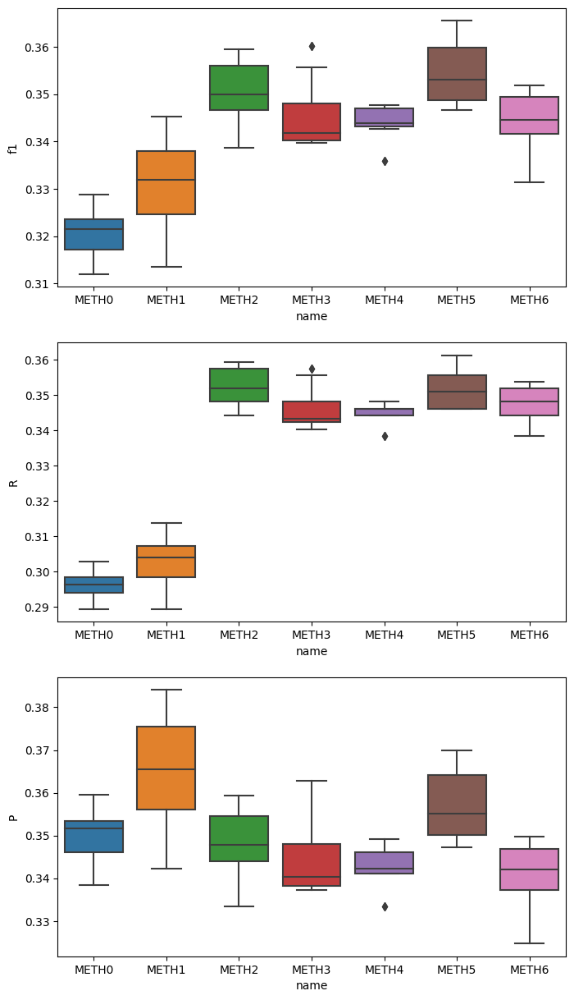

In [9]:
import seaborn as sns
from matplotlib import pyplot as plt

with open("BENCHMARK_BOOTSTRAP_ADDI.pkl", 'rb') as f:
    benchmark = pickle.load(f)

name = []
f1s = []
ps = []
rs = []
for i, b in enumerate(benchmark):
    name += [f"METH{i}"]*10
    rs += [k[0] for k in b]
    ps += [k[1] for k in b]
    f1s += [k[2] for k in b]


stats = pd.DataFrame({
    'name': name,
    "f1": f1s,
    "P": ps,
    "R": rs
})

stats = pd.concat([stats, stats])

f, a = plt.subplots(3, 1, figsize=(8, 15))
sns.boxplot(data=stats, y="f1", x="name", ax=a[0])
sns.boxplot(data=stats, y="R", x="name", ax=a[1])
sns.boxplot(data=stats, y="P", x="name", ax=a[2])

### Interpretation

reminder :
- <ins>Recall :</ins> Pourcentage de positif bien déterminer par le modèle
- <ins>Precision :</ins> Pourcentage de bonne prediction sur toute les predictions positives 


Adding the targetted extraction demonstrationg sugnificantly improves the recall and not the precisions that much.
The extraction strongly helps for the recall and avoid the False Negatives.

Meaning we don't get many more ground truth label but we avoid the false negative.

In [10]:
import os


preds_files = {
    "_".join(x.split("_")[1:])[:-4] : x
    for x in os.listdir(".")
    if "preds_" in x
}

for exp, preds_file in preds_files.items():
    with open(preds_file, 'rb') as f:
        content = pickle.load(f)
        preds_files[exp] = compare_labels_and_preds(content)


In [11]:
import numpy as np

addi_stat = []

for k, preds in preds_files.items():
    labels, preds = zip(*preds)
    nb_preds = np.array([len(x) for x in preds])
    nb_labels = np.array([len(x) for x in labels])

    addi_stat.append({
        "mean_nb_preds" : nb_preds.mean(),
        "mean_nb_labels" : nb_labels.mean(),
        "diff_between_preds_and_labels": np.abs(nb_preds - nb_labels).mean(),
        "signed_diff_between_preds_and_labels": (nb_labels - nb_preds).mean(),
    })

addi_stat = pd.DataFrame.from_records(addi_stat)
addi_stat

,mean_nb_preds,mean_nb_labels,diff_between_preds_and_labels,signed_diff_between_preds_and_labels
0,1.500000,1.983146,0.797753,0.483146
1,1.943820,1.983146,0.814607,0.039326
2,1.915730,1.983146,0.876404,0.067416
3,1.904494,1.983146,0.887640,0.078652
4,1.488764,1.983146,0.786517,0.494382
5,1.893258,1.983146,0.865169,0.089888
6,1.943820,1.983146,0.870787,0.039326


/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magron/miniconda3/envs/nlp1/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/mnt/u14157_ic_nlp_001_files_nfs/nlpdata1/home/magro

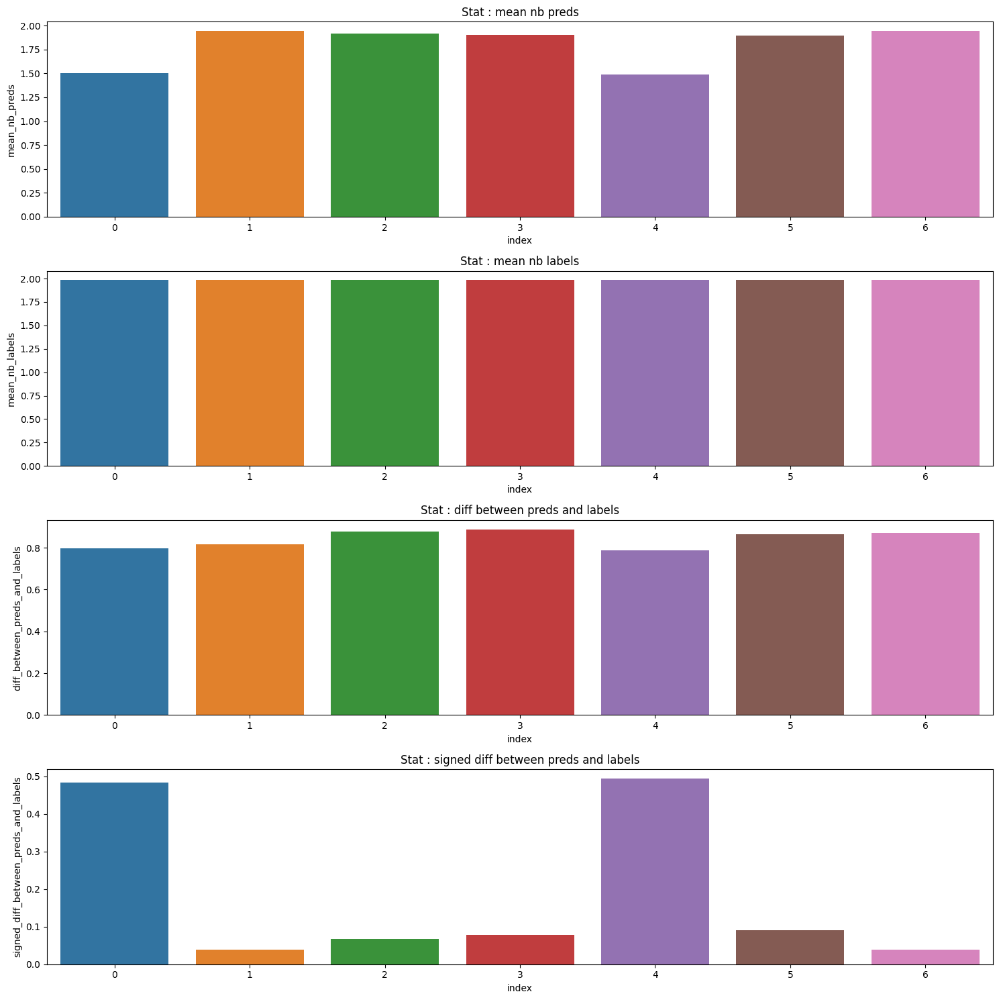

In [13]:
f, a = plt.subplots(4, 1, figsize=(15, 15))


for feat, ax in zip(addi_stat.columns, a.flatten()):
    g = sns.barplot(data=addi_stat.reset_index(), y=feat, ax=ax, x="index")
    g.set_title(f"Stat : {' '.join(feat.split('_'))}")

plt.tight_layout()

In [ ]:
from dataset_evaluation import entity_level_quality

preds_files = {
    "_".join(x.split("_")[1:])[:-4] : x
    for x in os.listdir(".")
    if "preds_" in x
}

metrics_other = {}
for exp, preds_file in preds_files.items():
    with open(preds_file, 'rb') as f:
        content = pickle.load(f)
        metrics_other[exp] = entity_level_quality(content, label_key="skills")


In [22]:
pd.DataFrame.from_records({k : v["1_to_1"] for k, v in metrics_other.items()}).T

,accuracy,precision_micro,precision_macro,recall_micro,recall_macro,F1_micro,F1_macro
support_size_extr_10,0.277620,0.277620,0.303024,0.277620,0.437492,0.277620,0.358049
support_size_extr_5,0.280453,0.280453,0.299507,0.280453,0.430952,0.280453,0.353403
support_size_extr_7,0.263456,0.263456,0.273282,0.263456,0.415111,0.263456,0.329586
support_type_None,0.235127,0.235127,0.216181,0.235127,0.362095,0.235127,0.270729
support_type_kNN_support_size_extr_7_support_size_match_1_nb_candidates_10,0.303116,0.303116,0.310250,0.303116,0.469270,0.303116,0.373540
support_type_kNN_support_size_extr_7_support_size_match_3_nb_candidates_10,0.297450,0.297450,0.329443,0.297450,0.472635,0.297450,0.388257
support_type_kNN_support_size_match_1_nb_candidates_10,0.243626,0.243626,0.222023,0.243626,0.378095,0.243626,0.279764


Small test with train_domain : generated skillspan train, test_domain : generated skill span dev

In [33]:
dev_gen = pd.read_csv("./generation/generated/SKILLSPAN/dev_final.csv")
dev_gen = dev_gen.sample(200) ## studied samples

dev_gen.to_csv("studied_subsamples_generated.csv")

In [4]:
dev_gen = pd.read_csv("studied_subsamples_generated.csv")
dev_gen["skills"] = dev_gen["skills"].apply(eval)
dev_gen = dev_gen.to_dict("records")

predictor = Predictor(
        test_domain="SkillSpan-dev", ## domain for the test samples 
        train_domain="SkillSpan", ## domain of the demonstration retrieval
        candidates_method="mixed"
    )

base = predictor.pipeline_prediction(dev_gen[:178], support_type=None)
knn_full_1 = predictor.pipeline_prediction(dev_gen[:178], support_type="kNN", support_size_match=1, nb_candidates=10, support_size_extr=7)

0it [00:00, ?it/s]

100%|██████████| 1/1 [00:00<00:00,  1.25it/s]
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.06it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.59it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.86it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.14it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.92it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0
No candidates found for:  $80,000 to $90,000


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.88it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.31it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 4946.11it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.54it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.04it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.65it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.49it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.37it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.43it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.24s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.14it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.19it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.48s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.84it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.13it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.29it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.60it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.53it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.66it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.47it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.35it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 4987.28it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.74it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.32s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.13s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.22it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.19s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.25it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.52it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.22s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.73it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.48it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00, 401.87it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.43s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.41it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.90it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.80it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.19it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.41s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.87it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.07it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.61it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.46it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  2.01it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  extraction 0
String not found in sentence for:  leadership


100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.86it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.70it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:01<00:00,  1.62s/it]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Costs:  matching 0


100%|██████████| 1/1 [00:00<00:00,  1.82it/s]


Costs:  extraction 0


100%|██████████| 1/1 [00:00<00:00,  2.97it/s]

Costs:  matching 0


0it [00:00, ?it/s]

preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.68s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.15s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  2.96it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.23it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.15it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.73s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.57s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.00s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.71s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.36s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.40s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.02it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  2.37it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.60s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.21it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.33s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.77s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.78it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  C
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.73it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  2.82it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.34s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  chemistry
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.83it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.27s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.30s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.42s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.39it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.55s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  Jenkins
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.66it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.53it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.62it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.26it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.70s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.08it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  2.81it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.38s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.28it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.14s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.32it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.46s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.76it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  3.22it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.66s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.55it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.37s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.41it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.54it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.79it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.60it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.10s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.22it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.48it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00, 10356.31it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.35it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.11s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  3.26it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.57it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.12s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.16s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.42it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.24it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.21it/s]


Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  Python
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.21s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.64it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.46it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.38it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.63it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.84it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.49it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


Costs:  extraction 0
preparing supports for  matching
String not found in sentence for:  Jenkins
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.51s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.61it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.58it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:00<00:00,  1.31it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.69it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.65it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.72it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.34it/s]


Costs:  extraction 0
preparing supports for  matching


100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.43it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.63s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.94it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.37it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.39s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.67it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.33it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.71it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.44it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.45it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.36it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.59it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.50it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.40it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  1.47it/s]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.51it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:01<00:00,  1.25s/it]


Costs:  matching 0
preparing supports for  extraction


100%|██████████| 1/1 [00:00<00:00,  1.89it/s]


Costs:  extraction 0
preparing supports for  matching
Number of canddidates ::
11


100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

Costs:  matching 0


In [7]:
TP_full_1, FN_full_1, FP_full_1, _ = computed_confusion_matrix(knn_full_1)

print_metrics(TP_full_1, FN_full_1, FP_full_1)

Precision :  0.37136929460580914
Recall :  0.3968957871396896
F1 :  0.38370846730975344


In [8]:
TP_base, FN_base, FP_base, _ = computed_confusion_matrix(base)

print_metrics(TP_base, FN_base, FP_base)

Precision :  0.37136929460580914
Recall :  0.3968957871396896
F1 :  0.38370846730975344
